In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from mpl_toolkits.basemap import Basemap
from scipy import stats
from scipy import interpolate
import matplotlib.cm as cm
import numpy.polynomial.polynomial as poly 
from ipywidgets import widgets
from IPython.display import display
from scipy.integrate import quad
import matplotlib.patheffects as path_effects
from PyAstronomy.pyasl import planck
#import quantities
import math
%matplotlib inline

In [2]:
def errorfill(x, y ,yerr,color=None, fmt = None, label = None, alpha_fill=0.3, ax=None):
    '''Function to create error bands rather than error bars on a scatter plot
    Input:
    x : an array of floats
    y: an array of floats
    yerr: array of flotas as the errors of the y values
    Output:
    Plot of values with error bands'''
    ax = ax if ax is not None else plt.gca()
    if color is None:
        color = ax._get_lines.color_cycle.next()
    if np.isscalar(yerr) or len(yerr) == len(y):
        ymin = y - yerr
        ymax = y + yerr
    elif len(yerr) == 2:
        ymin, ymax = yerr
    ax.scatter(x, y, color=color, label=label)
    ax.plot(x, y, color=color)
    ax.fill_between(x, ymax, ymin, color=color, alpha=alpha_fill)

In [3]:
def MYConcatenate(Years, MY, FileFormat):
    '''Function to create a single data frame from separate data files, 
    specifically for the files containing the albedo data from mcs
    Input:
    Years: The earth year for the specific data file
    MY: The martian year gor the data obtained.
    FileFormat: The Julian date assigned to the file.
    '''
    Gen_File = '/Users/eytangarybicas/Desktop/WORK/Data/MCS_ALBEDO_DATASETS/MY{}/A6_{}_{}_albedo.txt'
    MY_List=[]
    for Year in Years:
        df = pd.read_csv(Gen_File.format(MY, Year, FileFormat), 
        header=None, delimiter=r"\s+", names = ['L_s', 'Distance to Sun', 'Longitude',
        'Latitude','Solar zenith angle', 'Emission angle','Radiance', 'Albedo'])
        df['Mars Year'] = MY
        MY_List.append(df)
    return pd.concat(MY_List)

In [4]:
def CreateSubFrame(MarsYearDF, RanL_s, RanAlbedo, RanSZA, RanLat=[-90,90], RanLong=[-180,180]):
    '''Function to divide previously created data frames in smaller data frames by providing ranges
    Input:
    MarsYearDF: Mars Data frames 
    RanL_s: range of Solar Longitude example [0,360]
    RanAlbedo: Albedo Range example [0.5,1.0]
    RanSZA Solar Zenith angle range example [0,45]
    RanLat and RanLong are set as default
    Output: Several Subframes'''
    L_s_MYDF = MarsYearDF['L_s']
    Lat_MYDF = MarsYearDF['Latitude']
    Long_MYDF= MarsYearDF['Longitude']
    Alb_MYDF = MarsYearDF['Albedo']
    SolZen_MYDF = MarsYearDF['Solar zenith angle']
    MY_SUB = MarsYearDF[(L_s_MYDF <= RanL_s[1])  & (L_s_MYDF >= RanL_s[0]) & 
                        (Alb_MYDF <= RanAlbedo[1]) & (Alb_MYDF >= RanAlbedo[0]) & 
                        (SolZen_MYDF <= RanSZA[1]) & (SolZen_MYDF >= RanSZA[0]) &
                        (Lat_MYDF <= RanLat[1] ) & (Lat_MYDF >= RanLat[0]) & 
                        (Long_MYDF <= RanLong[1]) & (Long_MYDF >= RanLong[0])]
    return MY_SUB

In [5]:
def SubDict(MarsYearDF, TotRanL_s=[0,360], L_sStep=5.0, RanAlbedo=[0.0,1.0], RanSZA=[0.0,70.0], RanLat=[-90,90], RanLong=[-180,180]):
    '''Function to create a dictionary of subframes utilizing the CreateSubFrame function, this function will run through
    the dataframes in Solar Longitude step sizes (default is 5 but can be changed) and make the divisions
    Input:
    MarsYearDF: Mars Data frames 
    MY: Martian Year String
    TotRanL_s: range of values for solar longitude
    L_sStep: Step size
    RanL_s: range of Solar Longitude example [0,360]
    RanAlbedo: Albedo Range example [0.5,1.0]
    RanSZA Solar Zenith angle range example [0,45]
    RanLat and RanLong are set as default
    Output: Dictionary of Sub frames'''
    if (TotRanL_s[1]-TotRanL_s[0])%L_sStep != 0:
        raise('Bad Step Size')
    AllSubs = {}
    SubStr = 'MY_SUB{}'
    for i,L_sBound in enumerate(np.arange(TotRanL_s[0], TotRanL_s[1], L_sStep)):
        NewSub = CreateSubFrame(MarsYearDF, [L_sBound, L_sBound + L_sStep], RanAlbedo, RanSZA, RanLat, RanLong)
        AllSubs[SubStr.format(i)] = NewSub
    return AllSubs   

In [6]:
def SubStats(MYDict):
    '''Function to run statistics on data on the subframes from the dictionaries created by the SubDict function
    Input:
    MYDict: Dictionary Created by the SubDict Function
    Output:
    SubAvg: Average of the Albedo for each subframe in the dictionary
    SubStd: Standard Deviation of the Albedo for each subframe in the dictionary
    Sub_L_s: Average of the  Solar Longitude range for each subframe in the dictionary'''
    SubframeNum = len(MYDict.keys())
    SubAvg = []
    SubStd = []
    Sub_L_s = []
    SubSZAvg = []
    SubStr = 'MY_SUB{}'
    for i in range(SubframeNum):
        Subframe = MYDict[SubStr.format(i)]
        SubAvg.append(np.mean(Subframe['Albedo']))
        SubStd.append(np.std(Subframe['Albedo']))
        Sub_L_s.append(np.mean(Subframe['L_s']))
        SubSZAvg.append(np.mean(Subframe['Solar zenith angle']))
    SubAvg = np.array(SubAvg)
    SubStd = np.array(SubStd)
    Sub_L_s = np.array(Sub_L_s)
    SubSZAvg =np.array(SubSZAvg)
    return SubAvg, SubStd, Sub_L_s, SubSZAvg

In [7]:
def DataAlb(MYDict):
    '''Function to store data for latitude, longitude, albedo and solar zenith angle into listts to be used to graph.
    Input:
    MYDict: Dictionary Created by the SubDict Function
    Output:
    SubLat: Latitude array from sub frames
    SubLong: Longitude array from sub frames
    SubAlb: Albedo array from sub frames
    SunSZA: Solar Zenith Angle array from sub frames'''
    SubframeNum = len(MYDict.keys())
    SubLat = []
    SubLong = []
    SubAlb = []
    SubSZA = []
    SubStr = 'MY_SUB{}'
    for i in range(SubframeNum):
        Subframe = MYDict[SubStr.format(i)]
        SubLat.append(Subframe['Latitude'])
        SubLong.append(Subframe['Longitude'])
        SubAlb.append(Subframe['Albedo'])
        SubSZA.append(Subframe['Solar zenith angle'])
    SubLat = np.array(SubLat)
    SubLong = np.array(SubLong)
    SubAlb = np.array(SubAlb)
    SubSZA = np.array(SubSZA)
    return SubLat, SubLong, SubAlb, SubSZA

In [8]:
def polyval_NaN(p,data):
    '''Function to do a numpy polyval operation on arrays with NaN values 
    Input:
    p = polynomial length based on polyfit
    data = array of data sets that includes NaN values
    Output
    data2: the array with a polyval operation done to it'''
    data2 = np.full_like(data, np.nan)
    good = ~np.isnan(data)
    data2[good] = np.polyval(p,data[good])
    return data2

In [9]:
########
# pco2 #
########
# --------------------------------------------
# Equilibrium vapor pressure over solid CO2
# Brown and Ziegler (1980)
# --------------------------------------------
# Input:
#    T = temperature of solid [K]
# Output:
#    vapor pressure [Pa]
def pco2(T):
    A0 = 2.13807649e1
    A1 = -2.57064700e3
    A2 = -7.78129489e4
    A3 = 4.32506256e6
    A4 = -1.20671368e8
    A5 = 1.34966306e9
    # Pressure in torr
    ptorr = np.exp(A0 + (A1/(T)) + (A2/(T**2)) + (A3/(T**3)) + (A4/(T**4)) + (A5/(T**5)))
    # Pressure in Pa
    p = ptorr*133.3223684211
    return p

In [10]:
########
# tco2 #
########
#-------------------------------------------------------------------------
#Calculate (approximately) the condensation temperature of CO2 at the
#specified pressure(s) (Pa), using the empirical law from Brown and 
#Ziegler (1980). This function calls the pco2() routine.
#-------------------------------------------------------------------------
# Input:
#    p = vapor pressure [Pa]
# Output:
#    temperature of solid [K]
def tco2(p):
    Trange = np.arange(30,350)
    T = interpolate.pchip_interpolate(pco2(Trange),Trange,p)
    return T

In [11]:
# Function: ls2sol
# Purpose: convert Mars "Lsubs" to sol (day of year)
# Input: 
#    ls = areocentric longitude of the Sun [array]
#    n = degree of polynomial fit [scalar]
def ls2sol(ls, n):
    # data
    lsdata = (0,30,60,90,120,150,180,210,240,270,300,330,360) # L_s array
    soldata = (0,61.2,126.6,193.3,257.8,317.5,371.9,421.6,468.5,514.6,562.0,612.9,668.6) # Sol array
    
    # polynomial fit
    p = np.polyfit(lsdata, soldata, n)
    
    # sol for Ls input
    sol = np.polyval(p, ls)
    
    # return result
    return sol

In [12]:
def MYretrieval(dataframe, MY):
    if MY == '28':
        return dataframe[(dataframe['MY'] == 28)]
    elif MY == '29':
        return dataframe[(dataframe['MY'] == 29)]
    elif MY == '30':
        return dataframe[(dataframe['MY'] == 30)]
    elif MY == '31':
        return dataframe[(dataframe['MY'] == 31)]
    elif MY == '32':
        return dataframe[(dataframe['MY'] == 32)]
    elif MY == '33':
        return dataframe[(dataframe['MY'] == 33)]
    elif MY == '34':
        return dataframe[(dataframe['MY'] == 34)]
    elif MY == '35':
        return dataframe[(dataframe['MY'] == 35)]

In [13]:
def CreateEmiFrame(MarsDF, RanL_s, RanLat):
    '''Function to divide previously created data frames in smaller data frames by providing ranges
    Input:
    MarsYearDF: Mars Data frames 
    RanL_s: range of Solar Longitude example [0,360]
    RanAlbedo: Albedo Range example [0.5,1.0]
    RanSZA Solar Zenith angle range example [0,45]
    RanLat and RanLong are set as default
    Output: Several Subframes'''
    L_s_MYDF = MarsDF['L_s']
    Lat_MYDF = MarsDF['Surf_lat']
    Long_MYDF = MarsDF['Surf_lon']
    MY_SUB = MarsDF[(L_s_MYDF <= RanL_s[-1])  & (L_s_MYDF >= RanL_s[0]) &
                        (Lat_MYDF <= RanLat[-1] ) & (Lat_MYDF >= RanLat[0])]
    return MY_SUB

In [14]:
def SubEmiDict(MarsYearDF, TotRanL_s=[0,360], L_sStep=15.0, RanLat=[-90,90]):
    '''Function to create a dictionary of subframes utilizing the CreateSubFrame function, this function will run through
    the dataframes in Solar Longitude step sizes (default is 5 but can be changed) and make the divisions
    Input:
    MarsYearDF: Mars Data frames 
    MY: Martian Year String
    TotRanL_s: range of values for solar longitude
    L_sStep: Step size
    RanL_s: range of Solar Longitude example [0,360]
    RanAlbedo: Albedo Range example [0.5,1.0]
    RanSZA Solar Zenith angle range example [0,45]
    RanLat and RanLong are set as default
    Output: Dictionary of Sub frames'''
    if (TotRanL_s[1]-TotRanL_s[0])%L_sStep != 0:
        raise('Bad Step Size')
    AllSubs = {}
    SubStr = 'MY_SUB{}'
    for i,L_sBound in enumerate(np.arange(TotRanL_s[0], TotRanL_s[1], L_sStep)):
        NewSub = CreateEmiFrame(MarsYearDF, [L_sBound, L_sBound + L_sStep], RanLat)
        AllSubs[SubStr.format(i)] = NewSub
    return AllSubs 

In [15]:
def IRFlux(T):
    '''Calculate the luminosity of the thing.'''
    sigma = 5.67e-8 # W/m**2/K**4
    boltz = sigma * T**4
    return boltz

In [16]:
def DataEmi(MYDict):
    '''Function to store data for latitude, longitude, albedo and solar zenith angle into listts to be used to graph.
    Input:
    MYDict: Dictionary Created by the SubDict Function
    Output:
    SubLat: Latitude array from sub frames
    SubLong: Longitude array from sub frames
    SubAlb: Albedo array from sub frames
    SunSZA: Solar Zenith Angle array from sub frames'''
    SubframeNum = len(MYDict.keys())
    SubLat = []
    SubLong = []
    SubTemp = []
    SubPres = []
    SubIR = []
    SubFPT = []
    SubStr = 'MY_SUB{}'
    for i in range(SubframeNum):
        Subframe = MYDict[SubStr.format(i)]
        SubLat.append(Subframe['Surf_lat'])
        SubLong.append(Subframe['Surf_lon'])
        SubTemp.append(Subframe['T_surf'])
        SubPres.append(Subframe['p_surf'])
        SubIR.append(IRFlux(Subframe['T_surf']))
        SubFPT.append(Subframe['Frost_T'])
    SubLat = np.array(SubLat)
    SubLong = np.array(SubLong)
    SubTemp = np.array(SubTemp)
    SubPres = np.array(SubPres)
    SubIR = np.array(SubIR)
    return SubLat, SubLong, SubTemp, SubPres, SubIR, SubFPT

In [17]:
def photocorr(alb, sza, deg):
    '''Function to do photometric correction on albedo data
    '''
    a = np.polyfit(sza,alb,deg)
    pna = np.polyval(a,sza)
    corralb = (alb/pna)*np.mean(alb)
    return(corralb, pna, a)

In [18]:
def binplot(x,y):
    a = stats.binned_statistic(x,y, bins = int(np.max(x)-np.min(x)),statistic = 'mean')
    b = stats.binned_statistic(x,y, bins = int(np.max(x)-np.min(x)), statistic = 'std')
    newx = a[1][:-1]
    newy = a[0]
    return(newx, newy, b[0])

In [19]:
def ms(lat,dec,alb,d,loc='N'):
    def cos(t):
        e = (np.sin(lat*np.pi/180)*np.sin(dec*np.pi/180)+np.cos(lat*np.pi/180)*np.cos(dec*np.pi/180)*
                np.cos(2*np.pi*t/(88775.244147)*np.pi/180))/d**2
        return(e)
    if loc == 'N':
        t = 371.9*88775.244147
    else:
        t = (668.6-371.9)*88775.244147
    x = np.trapz(cos(t))*(1-alb)
    return x

In [20]:
def dec(ls):
    dec = np.arcsin(np.sin(25.19*np.pi/180)*np.sin(ls*np.pi/180))*180/np.pi
    return dec

In [21]:
def polarrings(array, lo, hi):
    x = np.zeros((200,200))
    y = np.zeros((200,200))
    lon = np.zeros((200,200))
    lat = np.zeros((200,200))
    for i in range(200):
        x[i,:] = i-100
        y[:,i] = i-100
    r = np.sqrt(x**2+y**2)/np.sqrt(10000)
    lat = 90 - r * (30)
    lon = np.arctan(y/x)*180/np.pi
    lon[0:100,100:] = 180 + lon[0:100,100:]
    lon[0:100,0:100] = lon[0:100,0:100] - 180
    maskdown = np.ma.masked_array(lat, lat >= lo).mask
    maskup =  np.ma.masked_array(lat, lat <= hi).mask
    mask = maskup*maskdown
    newarr = array*mask
    newarr[np.where(newarr == 0)] = np.nan
    return(newarr);

In [22]:
def hg2(g, c, theta): 
# function p = henyey_greenstein_two(g, c, theta)
# -------------------------------------------------------------------------
# Two-lobe Henyey-Greenstein phase function
    def hg(g,theta):
        q = ((1-g*g)/(1+g*g-2*g*np.cos(theta)))**(1.5)
        return q
    x = hg(g, theta);
    y = hg(-g, theta);
    p = 0.5*(((1.-c)*x)+((1.+c)*y))
    return p

In [23]:
YearsMY29 = ['2007', '2008', '2009']
MY29 = MYConcatenate(YearsMY29, '29', 'JD2454444-2455131')

In [24]:
YearsMY30 = ['2009', '2010', '2011']
MY30 = MYConcatenate(YearsMY30, '30', 'JD2455131-2455818')

In [25]:
YearsMY31 = ['2011', '2012', '2013']
MY31 = MYConcatenate(YearsMY31, '31', 'JD2455818-2456505')

In [26]:
YearsMY32 = ['2013', '2014', '2015']
MY32 = MYConcatenate(YearsMY32, '32', 'JD2456505-2457192')

In [27]:
YearsMY33 = ['2015', '2016', '2017']
MY33 = MYConcatenate(YearsMY33, '33', 'JD2457192-2457879')

In [28]:
MY29N = MY29[(MY29['Solar zenith angle'] <= 65.0) & (MY29['Latitude'] >= 60.0) & (MY29['Latitude'] <= 87.0)]
MY29N = MY29N.drop(columns = ['Distance to Sun','Emission angle','Radiance', 'Mars Year'])
MY29S = MY29[(MY29['Solar zenith angle'] <= 65.0) & (MY29['Latitude'] <= -60.0) & (MY29['Latitude'] >= -87.0)]
MY29S = MY29S.drop(columns = ['Distance to Sun','Emission angle','Radiance', 'Mars Year'])
MY30N = MY30[(MY30['Solar zenith angle'] <= 65.0) & (MY30['Latitude'] >= 60.0) & (MY30['Latitude'] <= 87.0)]
MY30N = MY30N.drop(columns = ['Distance to Sun','Emission angle','Radiance', 'Mars Year'])
MY30S = MY30[(MY30['Solar zenith angle'] <= 65.0) & (MY30['Latitude'] <= -60.0) & (MY30['Latitude'] >= -87.0)] 
MY30S = MY30S.drop(columns = ['Distance to Sun','Emission angle','Radiance', 'Mars Year'])
MY31N = MY31[(MY31['Solar zenith angle'] <= 65.0) & (MY31['Latitude'] >= 60.0) & (MY31['Latitude'] <= 87.0)]
MY31N = MY31N.drop(columns = ['Distance to Sun','Emission angle','Radiance', 'Mars Year'])
MY31S = MY31[(MY31['Solar zenith angle'] <= 65.0) & (MY31['Latitude'] <= -60.0) & (MY31['Latitude'] >= -87.0)] 
MY31S = MY31S.drop(columns = ['Distance to Sun','Emission angle','Radiance', 'Mars Year'])
MY32N = MY32[(MY32['Solar zenith angle'] <= 65.0) & (MY32['Latitude'] >= 60.0) & (MY32['Latitude'] <= 87.0)]
MY32N = MY32N.drop(columns = ['Distance to Sun','Emission angle','Radiance', 'Mars Year'])
MY32S = MY32[(MY32['Solar zenith angle'] <= 65.0) & (MY32['Latitude'] <= -60.0) & (MY32['Latitude'] >= -87.0)] 
MY32S = MY32S.drop(columns = ['Distance to Sun','Emission angle','Radiance', 'Mars Year'])
MY33N = MY33[(MY33['Solar zenith angle'] <= 65.0) & (MY33['Latitude'] >= 60.0) & (MY33['Latitude'] <= 87.0)]
MY33N = MY33N.drop(columns = ['Distance to Sun','Emission angle','Radiance', 'Mars Year'])
MY33S = MY33[(MY33['Solar zenith angle'] <= 65.0) & (MY33['Latitude'] <= -60.0) & (MY33['Latitude'] >= -87.0)]
MY33S = MY33S.drop(columns = ['Distance to Sun','Emission angle','Radiance', 'Mars Year'])

In [29]:
allMYN = pd.concat([MY29N,MY30N,MY31N,MY32N,MY33N])
allMYS = pd.concat([MY29S,MY30S,MY31S,MY32S,MY33S])

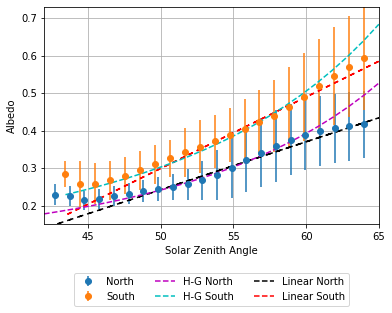

In [30]:
allMYNA = binplot(allMYN['Solar zenith angle'],allMYN['Albedo'])
allMYSA = binplot(allMYS['Solar zenith angle'],allMYS['Albedo'])
fig = plt.figure(1)
ax = fig.add_subplot(111)
plt.errorbar(allMYNA[0],allMYNA[1], allMYNA[2], fmt = 'o',label = 'North')
plt.errorbar(allMYSA[0],allMYSA[1], allMYSA[2], fmt = 'o', label = 'South')
plt.plot(allMYN['Solar zenith angle'], photocorr(allMYN['Albedo'],allMYN['Solar zenith angle'],1)[1],linestyle='--', dashes=(3, 4), c = 'k')
plt.plot(allMYS['Solar zenith angle'], photocorr(allMYS['Albedo'],allMYS['Solar zenith angle'],1)[1],linestyle='--', dashes=(3, 3), c = 'r')
incN = np.linspace(42.,65.,23.)*np.pi/180
thetaN = incN+(75.*np.pi/180)
plt.plot(incN*180/np.pi,hg2(.8,.26,thetaN), linestyle='--', c = 'm', label = 'H-G North')
incS = np.linspace(43.47,65.,21.)*np.pi/180
thetaS = incS+(75.*np.pi/180)
plt.plot(incS*180/np.pi,hg2(.8,.67,thetaS), linestyle='--', c = 'c', label = 'H-G South')
plt.grid()
ax.plot([45,50],[0,0], linestyle='--', label = 'Linear North', c = 'k')
ax.plot([45,50],[0,0], linestyle='--', label = 'Linear South', c = 'r')
plt.xlim(42,65)
plt.ylim(.15,.73)
plt.ylabel('Albedo')
plt.xlabel('Solar Zenith Angle')
handles, labels = ax.get_legend_handles_labels()
handles2 = [handles[4], handles[5], handles[0], handles[1], handles[2], handles[3]]
labels2 = [labels[4], labels[5], labels[0], labels[1], labels[2], labels[3]]
ax.legend(handles2, labels2,loc=9, bbox_to_anchor=(0.5, -0.2), ncol = 3);
plt.savefig('Phcfit.png', dpi= 300, facecolor=fig.get_facecolor(),bbox_inches = 'tight');

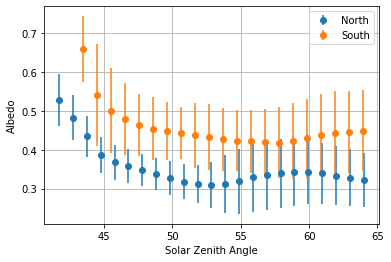

In [31]:
allMYN['Albedo'] = photocorr(allMYN['Albedo'],allMYN['Solar zenith angle'],1)[0]
allMYNB = binplot(allMYN['Solar zenith angle'],allMYN['Albedo'])
plt.errorbar(allMYNB[0],allMYNB[1], allMYNB[2], fmt = 'o', label = 'North')
allMYS['Albedo'] = photocorr(allMYS['Albedo'],allMYS['Solar zenith angle'],1)[0]
allMYSB = binplot(allMYS['Solar zenith angle'],allMYS['Albedo'])
plt.errorbar(allMYSB[0],allMYSB[1], allMYSB[2], fmt = 'o', label = 'South')
plt.ylabel('Albedo')
plt.xlabel('Solar Zenith Angle')
plt.grid()
plt.legend();
plt.savefig('Phtcrr.png', dpi= 300, facecolor=fig.get_facecolor(), bbox_inches = 'tight');

In [32]:
def rmse(data,fit):
    rmse = np.sqrt(np.sum((fit-data)**2)/len(data))
    return rmse

In [33]:
relineN = rmse(allMYNA[1],photocorr(allMYN['Albedo'],allMYN['Solar zenith angle'],1)[2][0]*allMYNA[0] + photocorr(allMYN['Albedo'],allMYN['Solar zenith angle'],1)[2][1])
rebrdfN = rmse(allMYNA[1],hg2(.8,.26,thetaN))
relineS = rmse(allMYSA[1],photocorr(allMYS['Albedo'],allMYS['Solar zenith angle'],1)[2][0]*allMYSA[0] + photocorr(allMYS['Albedo'],allMYS['Solar zenith angle'],1)[2][1])
rebrdfS = rmse(allMYSA[1],hg2(.8,.67,thetaS))

In [34]:
print(relineN, rebrdfN)
print(relineS, rebrdfS)

0.08122972988647668 0.03713091716760095
0.11934198915958395 0.034200524431530176


In [35]:
def rmsdiff(data,fit):
    rmsd = np.sqrt(np.sum(np.square(data))/len(data))
    rmsf = np.sqrt(np.sum(np.square(fit))/len(fit))
    diff = (rmsd-rmsf)
    return diff

In [36]:
rlineN = rmsdiff(allMYNA[1],photocorr(allMYN['Albedo'],allMYN['Solar zenith angle'],1)[2][0]*allMYNA[0] + photocorr(allMYN['Albedo'],allMYN['Solar zenith angle'],1)[2][1])
rbrdfN = rmsdiff(allMYNA[1],hg2(.8,.26,thetaN))
rlineS = rmsdiff(allMYSA[1],photocorr(allMYS['Albedo'],allMYS['Solar zenith angle'],1)[2][0]*allMYSA[0] + photocorr(allMYS['Albedo'],allMYS['Solar zenith angle'],1)[2][1])
rbrdfS = rmsdiff(allMYSA[1],hg2(.8,.67,thetaS))

In [37]:
print(np.sqrt(-rlineN), np.sqrt(-rbrdfN))
print(np.sqrt(-rlineS), np.sqrt(-rbrdfS))

0.16194774613489316 0.13384048062897075
0.188813590822667 0.14061305834976395


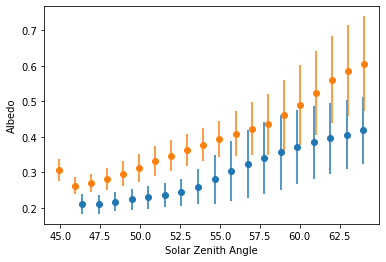

In [38]:
M29NA = binplot(MY29N['Solar zenith angle'],MY29N['Albedo'])
plt.errorbar(M29NA[0],M29NA[1], M29NA[2], fmt = 'o')
M29SA = binplot(MY29S['Solar zenith angle'],MY29S['Albedo'])
plt.errorbar(M29SA[0],M29SA[1], M29SA[2], fmt = 'o')
plt.ylabel('Albedo')
plt.xlabel('Solar Zenith Angle');

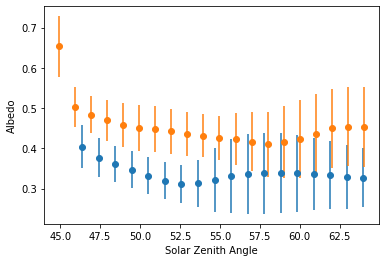

In [39]:
MY29N['Albedo'] = photocorr(MY29N['Albedo'],MY29N['Solar zenith angle'],1)[0]
M29NB = binplot(MY29N['Solar zenith angle'],MY29N['Albedo'])
plt.errorbar(M29NB[0],M29NB[1], M29NB[2], fmt = 'o')
MY29S['Albedo'] = photocorr(MY29S['Albedo'],MY29S['Solar zenith angle'],1)[0]
M29SB = binplot(MY29S['Solar zenith angle'],MY29S['Albedo'])
plt.errorbar(M29SB[0],M29SB[1], M29SB[2], fmt = 'o')
plt.ylabel('Albedo')
plt.xlabel('Solar Zenith Angle');

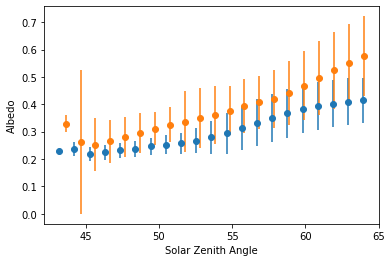

In [40]:
M30NA = binplot(MY30N['Solar zenith angle'],MY30N['Albedo'])
plt.errorbar(M30NA[0],M30NA[1], M30NA[2], fmt = 'o')
M30SA = binplot(MY30S['Solar zenith angle'],MY30S['Albedo'])
plt.errorbar(M30SA[0],M30SA[1], M30SA[2], fmt = 'o')
plt.ylabel('Albedo')
plt.xlabel('Solar Zenith Angle');

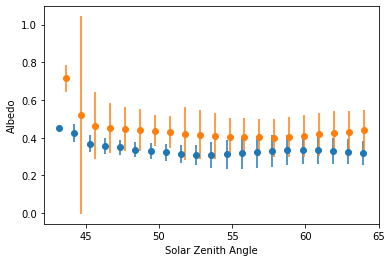

In [41]:
MY30N['Albedo'] = photocorr(MY30N['Albedo'],MY30N['Solar zenith angle'],1)[0]
M30NB = binplot(MY30N['Solar zenith angle'],MY30N['Albedo'])
plt.errorbar(M30NB[0],M30NB[1], M30NB[2], fmt = 'o')
MY30S['Albedo'] = photocorr(MY30S['Albedo'],MY30S['Solar zenith angle'],1)[0]
M30SB = binplot(MY30S['Solar zenith angle'],MY30S['Albedo'])
plt.errorbar(M30SB[0],M30SB[1], M30SB[2], fmt = 'o')
plt.ylabel('Albedo')
plt.xlabel('Solar Zenith Angle');

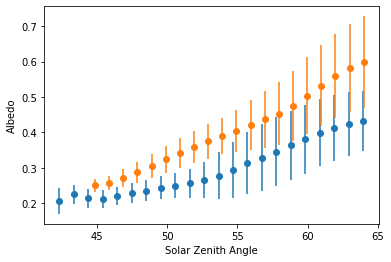

In [42]:
M31NA = binplot(MY31N['Solar zenith angle'],MY31N['Albedo'])
M31SA = binplot(MY31S['Solar zenith angle'],MY31S['Albedo'])
plt.errorbar(M31NA[0],M31NA[1], M31NA[2], fmt = 'o', label = 'North', zorder = 0)
plt.errorbar(M31SA[0],M31SA[1], M31SA[2], fmt = 'o', label = 'South', zorder = 0)
plt.ylabel('Albedo')
plt.xlabel('Solar Zenith Angle');

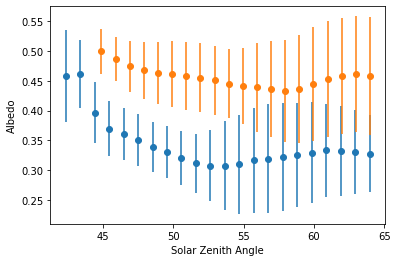

In [43]:
MY31N['Albedo'] = photocorr(MY31N['Albedo'],MY31N['Solar zenith angle'],1)[0]
M31NB = binplot(MY31N['Solar zenith angle'],MY31N['Albedo'])
plt.errorbar(M31NB[0],M31NB[1], M31NB[2], fmt = 'o')
MY31S['Albedo'] = photocorr(MY31S['Albedo'],MY31S['Solar zenith angle'],1)[0]
M31SB = binplot(MY31S['Solar zenith angle'],MY31S['Albedo'])
plt.errorbar(M31SB[0],M31SB[1], M31SB[2], fmt = 'o')
plt.ylabel('Albedo')
plt.xlabel('Solar Zenith Angle');

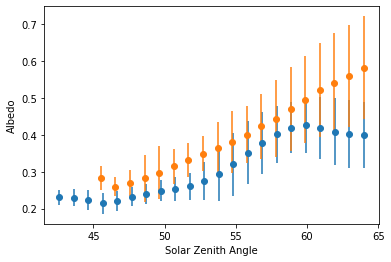

In [44]:
M32NA = binplot(MY32N['Solar zenith angle'],MY32N['Albedo'])
plt.errorbar(M32NA[0],M32NA[1], M32NA[2], fmt = 'o', label = 'North')
M32SA = binplot(MY32S['Solar zenith angle'],MY32S['Albedo'])
plt.errorbar(M32SA[0],M32SA[1], M32SA[2], fmt = 'o', label = 'South')
plt.ylabel('Albedo')
plt.xlabel('Solar Zenith Angle');

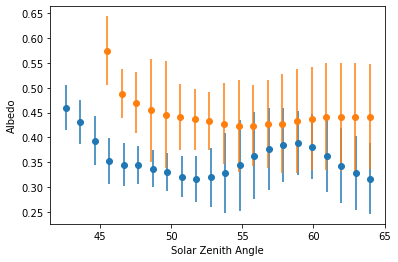

In [45]:
MY32N['Albedo'] = photocorr(MY32N['Albedo'],MY32N['Solar zenith angle'],1)[0]
M32NB = binplot(MY32N['Solar zenith angle'],MY32N['Albedo'])
plt.errorbar(M32NB[0],M32NB[1], M32NB[2], fmt = 'o')
MY32S['Albedo'] = photocorr(MY32S['Albedo'],MY32S['Solar zenith angle'],1)[0]
M32SB = binplot(MY32S['Solar zenith angle'],MY32S['Albedo'])
plt.errorbar(M32SB[0],M32SB[1], M32SB[2], fmt = 'o')
plt.ylabel('Albedo')
plt.xlabel('Solar Zenith Angle');

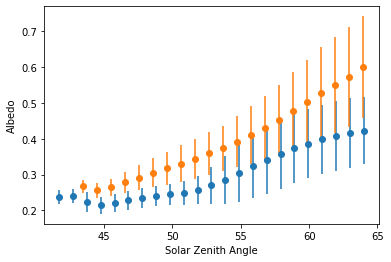

In [46]:
M33NA = binplot(MY33N['Solar zenith angle'],MY33N['Albedo'])
plt.errorbar(M33NA[0],M33NA[1], M33NA[2], fmt = 'o')
M33SA = binplot(MY33S['Solar zenith angle'],MY33S['Albedo'])
plt.errorbar(M33SA[0],M33SA[1], M33SA[2], fmt = 'o')
plt.ylabel('Albedo')
plt.xlabel('Solar Zenith Angle');

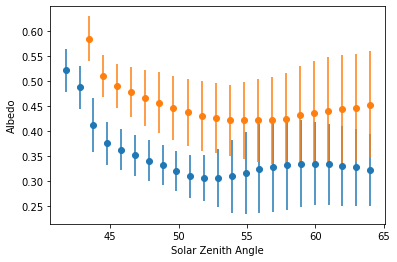

In [47]:
MY33N['Albedo'] = photocorr(MY33N['Albedo'],MY33N['Solar zenith angle'],1)[0]
M33NB = binplot(MY33N['Solar zenith angle'],MY33N['Albedo'])
plt.errorbar(M33NB[0],M33NB[1], M33NB[2], fmt = 'o')
MY33S['Albedo'] = photocorr(MY33S['Albedo'],MY33S['Solar zenith angle'],1)[0]
M33SB = binplot(MY33S['Solar zenith angle'],MY33S['Albedo'])
plt.errorbar(M33SB[0],M33SB[1], M33SB[2], fmt = 'o')
plt.ylabel('Albedo')
plt.xlabel('Solar Zenith Angle');

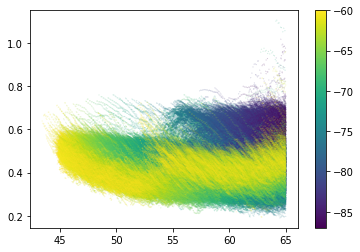

In [48]:
plt.scatter(MY33S['Solar zenith angle'],MY33S['Albedo'], c = MY33S['Latitude'], s = .005)
plt.colorbar();

In [49]:
NAlb = pd.concat([MY29N,MY30N,MY31N,MY33N])

In [50]:
SAlb = pd.concat([MY29S,MY30S,MY31S,MY33S])

In [51]:
SPRCAu1 = MY29[(MY29['Latitude'] <= -85.0) & (MY29['Solar zenith angle']<= 65.0) & (MY29['Latitude'] >= -87.0) & (MY29['Longitude'] >= -27.0) & (MY29['Longitude'] <= 0.0)]
SPRCAu2 = MY30[(MY30['Latitude'] <= -85.0) & (MY30['Latitude'] >= -87.0) & (MY30['Longitude'] >= -27.0) & (MY30['Longitude'] <= 0.0)]
SPRCAu3 = MY31[(MY31['Latitude'] <= -85.0) & (MY31['Latitude'] >= -87.0) & (MY31['Longitude'] >= -27.0) & (MY31['Longitude'] <= 0.0)]
SPRCAu4 = MY33[(MY33['Latitude'] <= -85.0) & (MY33['Latitude'] >= -87.0) & (MY33['Longitude'] >= -27.0) & (MY33['Longitude'] <= 0.0)]

In [52]:
SPRCAc1 = MY29S[(MY29S['Latitude'] <= -85.0) & (MY29S['Longitude'] >= -27.0) & (MY29S['Longitude'] <= 0.0)]
SPRCAc2 = MY30S[(MY30S['Latitude'] <= -85.0) & (MY30S['Longitude'] >= -27.0) & (MY30S['Longitude'] <= 0.0)]
SPRCAc3 = MY31S[(MY31S['Latitude'] <= -85.0) & (MY31S['Longitude'] >= -27.0) & (MY31S['Longitude'] <= 0.0)]
SPRCAc4 = MY33S[(MY33S['Latitude'] <= -85.0) & (MY33S['Longitude'] >= -27.0) & (MY33S['Longitude'] <= 0.0)]

In [53]:
np.nanmean((np.nanmean(SPRCAc1['Albedo']), np.nanmean(SPRCAc2['Albedo']), np.nanmean(SPRCAc3['Albedo']), np.nanmean(SPRCAc4['Albedo'])))

0.6441428673696565

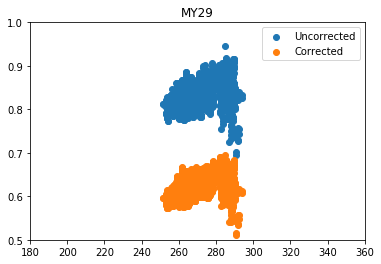

In [54]:
plt.scatter(SPRCAu1['L_s'],SPRCAu1['Albedo'],  label = 'Uncorrected')
plt.scatter(SPRCAc1['L_s'],SPRCAc1['Albedo'],  label = 'Corrected')
plt.title('MY29')
plt.xlim(180,360)
plt.ylim(.5,1)
plt.legend();

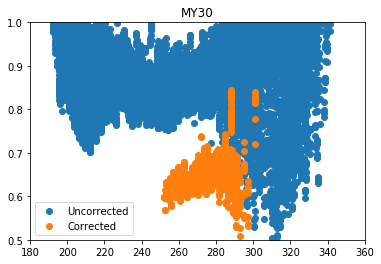

In [55]:
plt.scatter(SPRCAu2['L_s'],SPRCAu2['Albedo'], label = 'Uncorrected')
plt.scatter(SPRCAc2['L_s'],SPRCAc2['Albedo'], label = 'Corrected')
plt.title('MY30')
plt.xlim(180,360)
plt.ylim(.5,1)
plt.legend();

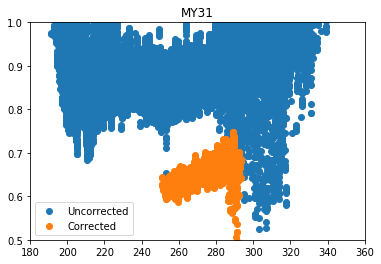

In [56]:
plt.scatter(SPRCAu3['L_s'],SPRCAu3['Albedo'], label = 'Uncorrected')
plt.scatter(SPRCAc3['L_s'],SPRCAc3['Albedo'], label = 'Corrected')
plt.title('MY31')
plt.xlim(180,360)
plt.ylim(.5,1)
plt.legend();

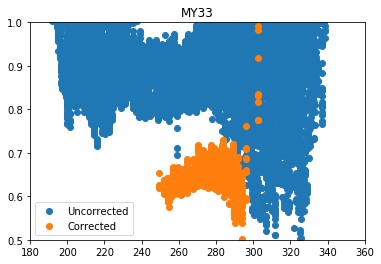

In [57]:
plt.scatter(SPRCAu4['L_s'],SPRCAu4['Albedo'], label = 'Uncorrected')
plt.scatter(SPRCAc4['L_s'],SPRCAc4['Albedo'], label = 'Corrected')
plt.title('MY33')
plt.xlim(180,360)
plt.ylim(.5,1)
plt.legend();

In [58]:
MY29_SubframesNorth = SubDict(MY29N, L_sStep = 15.0)

In [59]:
MY30_SubframesNorth = SubDict(MY30N, L_sStep = 15.0)

In [60]:
MY31_SubframesNorth = SubDict(MY31N, L_sStep = 15.0)

In [61]:
MY32_SubframesNorth = SubDict(MY32N, L_sStep = 15.0)

In [62]:
MY33_SubframesNorth = SubDict(MY33N, L_sStep = 15.0)

In [63]:
MY29_SubframesSouth = SubDict(MY29S, L_sStep = 15.0)

In [64]:
MY30_SubframesSouth = SubDict(MY30S, L_sStep = 15.0)

In [65]:
MY31_SubframesSouth = SubDict(MY31S, L_sStep = 15.0)

In [66]:
MY32_SubframesSouth = SubDict(MY32S, L_sStep = 15.0)

In [67]:
MY33_SubframesSouth = SubDict(MY33S, L_sStep = 15.0)

In [68]:
Alb29N = DataAlb(MY29_SubframesNorth)
Alb30N = DataAlb(MY30_SubframesNorth)
Alb31N = DataAlb(MY31_SubframesNorth)
Alb32N = DataAlb(MY32_SubframesNorth)
Alb33N = DataAlb(MY33_SubframesNorth)

In [69]:
Alb29S = DataAlb(MY29_SubframesSouth)
Alb30S = DataAlb(MY30_SubframesSouth)
Alb31S = DataAlb(MY31_SubframesSouth)
Alb32S = DataAlb(MY32_SubframesSouth)
Alb33S = DataAlb(MY33_SubframesSouth)

# Polar Plots for Martian Year 29, JD2454444-2455131 (Northern Hemisphere)

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  """
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  del sys.path[0]
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:21: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7

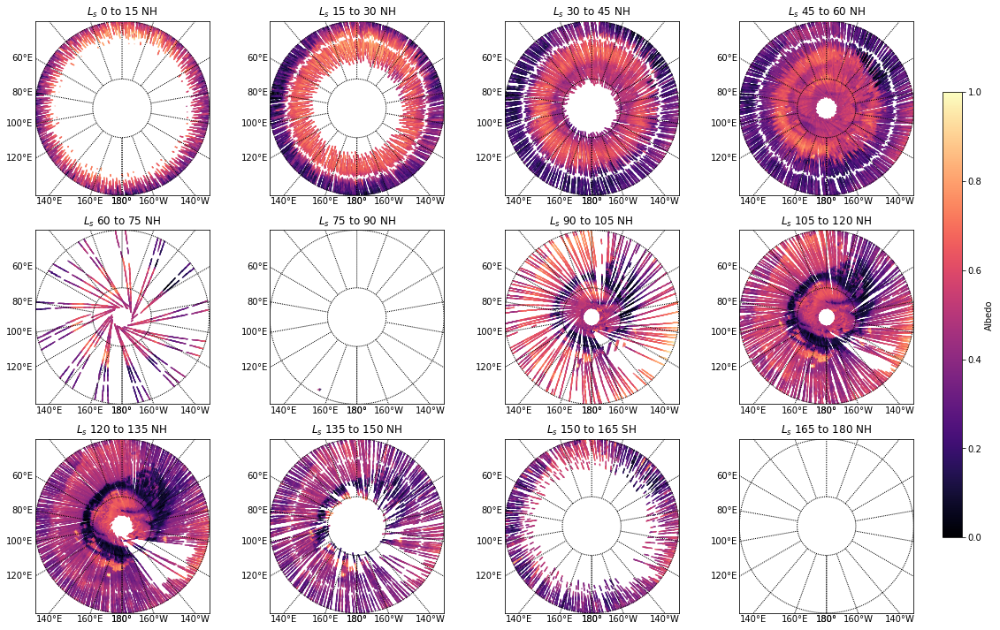

In [70]:
#
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (15,10))
plt.sca(axes[0,0])
#Plotted each small array
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 0 to 15 NH')
x,y = m(np.array(Alb29N[1][0]),np.array(Alb29N[0][0]))
m.scatter(x,y,c=np.array(Alb29N[2][0]), cmap='magma', s= 0.05)
plt.sca(axes[0,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 15 to 30 NH')
x,y = m(np.array(Alb29N[1][1]),np.array(Alb29N[0][1]))
m.scatter(x,y,c=np.array(Alb29N[2][1]), cmap='magma', s= 0.05)
plt.sca(axes[0,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 30 to 45 NH')
x,y = m(np.array(Alb29N[1][2]),np.array(Alb29N[0][2]))
m.scatter(x,y,c=np.array(Alb29N[2][2]), cmap='magma', s= 0.05)
plt.sca(axes[0,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 45 to 60 NH')
x,y = m(np.array(Alb29N[1][3]),np.array(Alb29N[0][3]))
m.scatter(x,y,c=np.array(Alb29N[2][3]), cmap='magma', s= 0.05)
plt.sca(axes[1,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 60 to 75 NH')
x,y = m(np.array(Alb29N[1][4]),np.array(Alb29N[0][4]))
m.scatter(x,y,c=np.array(Alb29N[2][4]), cmap='magma', s= 0.05)
plt.sca(axes[1,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 75 to 90 NH')
x,y = m(np.array(Alb29N[1][5]),np.array(Alb29N[0][5]))
m.scatter(x,y,c=np.array(Alb29N[2][5]), cmap='magma', s= 0.05)
plt.sca(axes[1,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 90 to 105 NH')
x,y = m(np.array(Alb29N[1][6]),np.array(Alb29N[0][6]))
m.scatter(x,y,c=np.array(Alb29N[2][6]), cmap='magma', s= 0.05)
plt.sca(axes[1,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 105 to 120 NH')
x,y = m(np.array(Alb29N[1][7]),np.array(Alb29N[0][7]))
m.scatter(x,y,c=np.array(Alb29N[2][7]), cmap='magma', s= 0.05)
plt.sca(axes[2,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 120 to 135 NH')
x,y = m(np.array(Alb29N[1][8]),np.array(Alb29N[0][8]))
m.scatter(x,y,c=np.array(Alb29N[2][8]), cmap='magma', s= 0.05)
plt.sca(axes[2,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 135 to 150 NH')
x,y = m(np.array(Alb29N[1][9]),np.array(Alb29N[0][9]))
m.scatter(x,y,c=np.array(Alb29N[2][9]), cmap='magma', s= 0.05)
plt.sca(axes[2,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 150 to 165 SH')
x,y = m(np.array(Alb29N[1][10]),np.array(Alb29N[0][10]))
m.scatter(x,y,c=np.array(Alb29N[2][10]), cmap='magma', s= 0.05)
plt.sca(axes[2,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 165 to 180 NH')
x,y = m(np.array(Alb29N[1][11]),np.array(Alb29N[0][11]))
m.scatter(x,y,c=np.array(Alb29N[2][11]), cmap='magma', s= 0.05)
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo') 
plt.show()

# Polar Plots for Martian Year 30, JD2455131-2455818 (Northern Hemisphere)

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  """
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  del sys.path[0]
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:21: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7

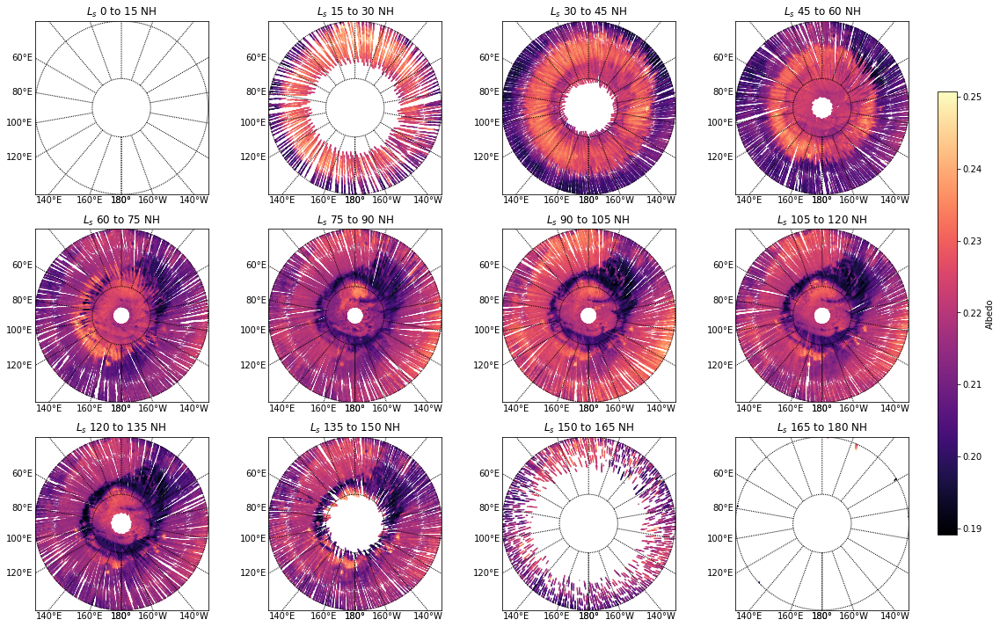

In [71]:
#
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (15,10))
plt.sca(axes[0,0])
#Plotted each small array
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 0 to 15 NH')
x,y = m(np.array(Alb30N[1][0]),np.array(Alb30N[0][0]))
m.scatter(x,y,c=np.array(Alb30N[2][0]), cmap='magma', s= 0.05)
plt.sca(axes[0,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 15 to 30 NH')
x,y = m(np.array(Alb30N[1][1]),np.array(Alb30N[0][1]))
m.scatter(x,y,c=np.array(Alb30N[2][1]), cmap='magma', s= 0.05)
plt.sca(axes[0,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 30 to 45 NH')
x,y = m(np.array(Alb30N[1][2]),np.array(Alb30N[0][2]))
m.scatter(x,y,c=np.array(Alb30N[2][2]), cmap='magma', s= 0.05)
plt.sca(axes[0,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 45 to 60 NH')
x,y = m(np.array(Alb30N[1][3]),np.array(Alb30N[0][3]))
m.scatter(x,y,c=np.array(Alb30N[2][3]), cmap='magma', s= 0.05)
plt.sca(axes[1,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 60 to 75 NH')
x,y = m(np.array(Alb30N[1][4]),np.array(Alb30N[0][4]))
m.scatter(x,y,c=np.array(Alb30N[2][4]), cmap='magma', s= 0.05)
plt.sca(axes[1,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 75 to 90 NH')
x,y = m(np.array(Alb30N[1][5]),np.array(Alb30N[0][5]))
m.scatter(x,y,c=np.array(Alb30N[2][5]), cmap='magma', s= 0.05)
plt.sca(axes[1,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 90 to 105 NH')
x,y = m(np.array(Alb30N[1][6]),np.array(Alb30N[0][6]))
m.scatter(x,y,c=np.array(Alb30N[2][6]), cmap='magma', s= 0.05)
plt.sca(axes[1,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 105 to 120 NH')
x,y = m(np.array(Alb30N[1][7]),np.array(Alb30N[0][7]))
m.scatter(x,y,c=np.array(Alb30N[2][7]), cmap='magma', s= 0.05)
plt.sca(axes[2,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 120 to 135 NH')
x,y = m(np.array(Alb30N[1][8]),np.array(Alb30N[0][8]))
m.scatter(x,y,c=np.array(Alb30N[2][8]), cmap='magma', s= 0.05)
plt.sca(axes[2,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 135 to 150 NH')
x,y = m(np.array(Alb30N[1][9]),np.array(Alb30N[0][9]))
m.scatter(x,y,c=np.array(Alb30N[2][9]), cmap='magma', s= 0.05)
plt.sca(axes[2,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 150 to 165 NH')
x,y = m(np.array(Alb30N[1][10]),np.array(Alb30N[0][10]))
m.scatter(x,y,c=np.array(Alb30N[2][10]), cmap='magma', s= 0.05)
plt.sca(axes[2,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 165 to 180 NH')
x,y = m(np.array(Alb30N[1][11]),np.array(Alb30N[0][11]))
m.scatter(x,y,c=np.array(Alb30N[2][11]), cmap='magma', s= 0.05)
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo') 
plt.show()

# Polar Plots for Martian Year 31, JD2455818-2456505 (Northern Hemisphere)

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  """
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  del sys.path[0]
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:21: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7

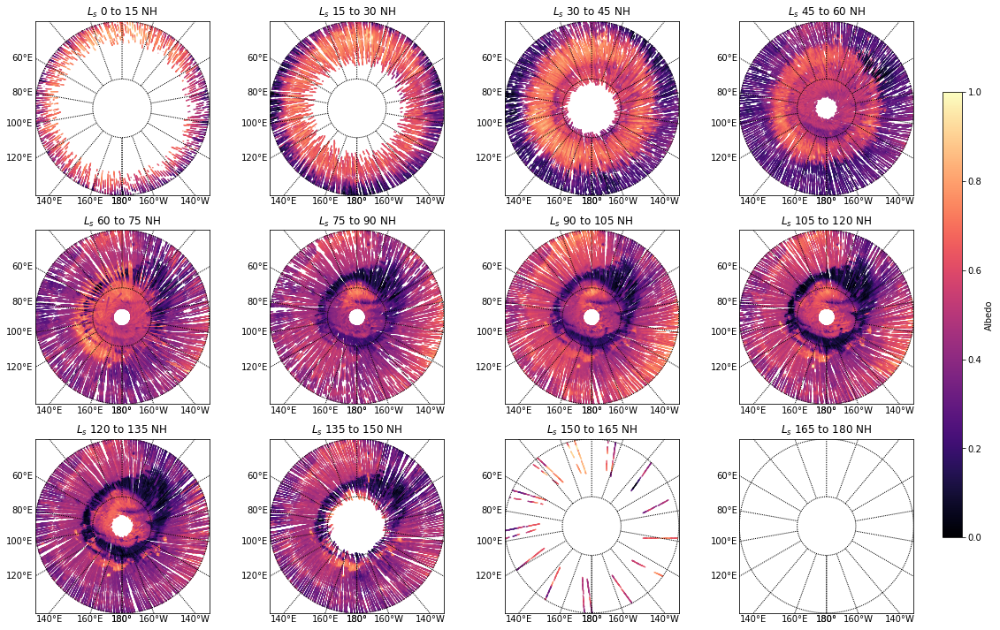

In [72]:
#
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (15,10))
plt.sca(axes[0,0])
#Plotted each small array
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 0 to 15 NH')
x,y = m(np.array(Alb31N[1][0]),np.array(Alb31N[0][0]))
m.scatter(x,y,c=np.array(Alb31N[2][0]), cmap='magma', s= 0.05)
plt.sca(axes[0,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 15 to 30 NH')
x,y = m(np.array(Alb31N[1][1]),np.array(Alb31N[0][1]))
m.scatter(x,y,c=np.array(Alb31N[2][1]), cmap='magma', s= 0.05)
plt.sca(axes[0,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 30 to 45 NH')
x,y = m(np.array(Alb31N[1][2]),np.array(Alb31N[0][2]))
m.scatter(x,y,c=np.array(Alb31N[2][2]), cmap='magma', s= 0.05)
plt.sca(axes[0,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 45 to 60 NH')
x,y = m(np.array(Alb31N[1][3]),np.array(Alb31N[0][3]))
m.scatter(x,y,c=np.array(Alb31N[2][3]), cmap='magma', s= 0.05)
plt.sca(axes[1,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 60 to 75 NH')
x,y = m(np.array(Alb31N[1][4]),np.array(Alb31N[0][4]))
m.scatter(x,y,c=np.array(Alb31N[2][4]), cmap='magma', s= 0.05)
plt.sca(axes[1,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 75 to 90 NH')
x,y = m(np.array(Alb31N[1][5]),np.array(Alb31N[0][5]))
m.scatter(x,y,c=np.array(Alb31N[2][5]), cmap='magma', s= 0.05)
plt.sca(axes[1,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 90 to 105 NH')
x,y = m(np.array(Alb31N[1][6]),np.array(Alb31N[0][6]))
m.scatter(x,y,c=np.array(Alb31N[2][6]), cmap='magma', s= 0.05)
plt.sca(axes[1,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 105 to 120 NH')
x,y = m(np.array(Alb31N[1][7]),np.array(Alb31N[0][7]))
m.scatter(x,y,c=np.array(Alb31N[2][7]), cmap='magma', s= 0.05)
plt.sca(axes[2,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 120 to 135 NH')
x,y = m(np.array(Alb31N[1][8]),np.array(Alb31N[0][8]))
m.scatter(x,y,c=np.array(Alb31N[2][8]), cmap='magma', s= 0.05)
plt.sca(axes[2,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 135 to 150 NH')
x,y = m(np.array(Alb31N[1][9]),np.array(Alb31N[0][9]))
m.scatter(x,y,c=np.array(Alb31N[2][9]), cmap='magma', s= 0.05)
plt.sca(axes[2,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 150 to 165 NH')
x,y = m(np.array(Alb31N[1][10]),np.array(Alb31N[0][10]))
m.scatter(x,y,c=np.array(Alb31N[2][10]), cmap='magma', s= 0.05)
plt.sca(axes[2,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 165 to 180 NH')
x,y = m(np.array(Alb31N[1][11]),np.array(Alb31N[0][11]))
m.scatter(x,y,c=np.array(Alb31N[2][11]), cmap='magma', s= 0.05)
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo') 
plt.show()

# Polar Plots for Martian Year 32, JD2456505-2457192 (Northern Hemisphere)

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  """
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  del sys.path[0]
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:21: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7

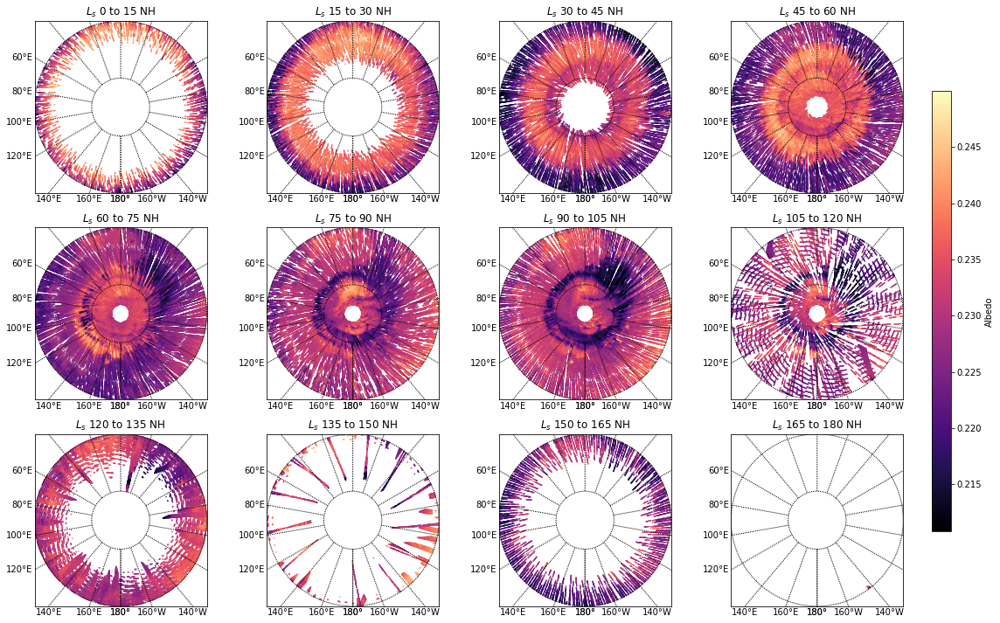

In [73]:
#
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (15,10))
plt.sca(axes[0,0])
#Plotted each small array
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 0 to 15 NH')
x,y = m(np.array(Alb32N[1][0]),np.array(Alb32N[0][0]))
m.scatter(x,y,c=np.array(Alb32N[2][0]), cmap='magma', s= 0.05)
plt.sca(axes[0,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 15 to 30 NH')
x,y = m(np.array(Alb32N[1][1]),np.array(Alb32N[0][1]))
m.scatter(x,y,c=np.array(Alb32N[2][1]), cmap='magma', s= 0.05)
plt.sca(axes[0,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 30 to 45 NH')
x,y = m(np.array(Alb32N[1][2]),np.array(Alb32N[0][2]))
m.scatter(x,y,c=np.array(Alb32N[2][2]), cmap='magma', s= 0.05)
plt.sca(axes[0,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 45 to 60 NH')
x,y = m(np.array(Alb32N[1][3]),np.array(Alb32N[0][3]))
m.scatter(x,y,c=np.array(Alb32N[2][3]), cmap='magma', s= 0.05)
plt.sca(axes[1,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 60 to 75 NH')
x,y = m(np.array(Alb32N[1][4]),np.array(Alb32N[0][4]))
m.scatter(x,y,c=np.array(Alb32N[2][4]), cmap='magma', s= 0.05)
plt.sca(axes[1,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 75 to 90 NH')
x,y = m(np.array(Alb32N[1][5]),np.array(Alb32N[0][5]))
m.scatter(x,y,c=np.array(Alb32N[2][5]), cmap='magma', s= 0.05)
plt.sca(axes[1,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 90 to 105 NH')
x,y = m(np.array(Alb32N[1][6]),np.array(Alb32N[0][6]))
m.scatter(x,y,c=np.array(Alb32N[2][6]), cmap='magma', s= 0.05)
plt.sca(axes[1,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 105 to 120 NH')
x,y = m(np.array(Alb32N[1][7]),np.array(Alb32N[0][7]))
m.scatter(x,y,c=np.array(Alb32N[2][7]), cmap='magma', s= 0.05)
plt.sca(axes[2,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 120 to 135 NH')
x,y = m(np.array(Alb32N[1][8]),np.array(Alb32N[0][8]))
m.scatter(x,y,c=np.array(Alb32N[2][8]), cmap='magma', s= 0.05)
plt.sca(axes[2,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 135 to 150 NH')
x,y = m(np.array(Alb32N[1][9]),np.array(Alb32N[0][9]))
m.scatter(x,y,c=np.array(Alb32N[2][9]), cmap='magma', s= 0.05)
plt.sca(axes[2,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 150 to 165 NH')
x,y = m(np.array(Alb32N[1][10]),np.array(Alb32N[0][10]))
m.scatter(x,y,c=np.array(Alb32N[2][10]), cmap='magma', s= 0.05)
plt.sca(axes[2,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 165 to 180 NH')
x,y = m(np.array(Alb32N[1][11]),np.array(Alb32N[0][11]))
m.scatter(x,y,c=np.array(Alb32N[2][11]), cmap='magma', s= 0.05)
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo') 
plt.show()

# Polar Plots for Martian Year 33,  JD2457192-2457879 (Northern Hemisphere)

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  """
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  del sys.path[0]
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:21: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7

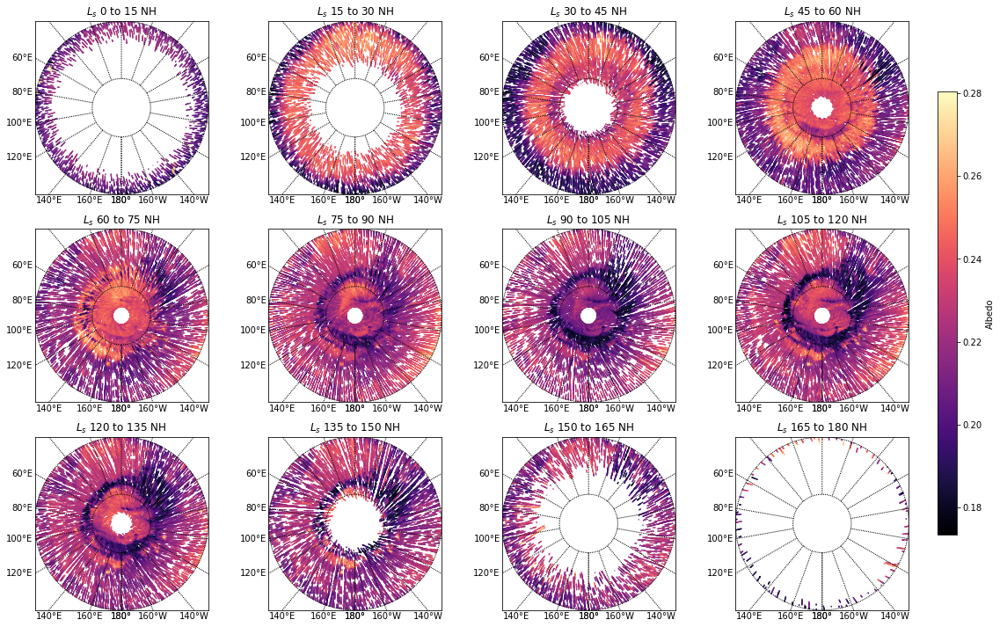

In [74]:
#
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (15,10))
plt.sca(axes[0,0])
#Plotted each small array
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 0 to 15 NH')
x,y = m(np.array(Alb33N[1][0]),np.array(Alb33N[0][0]))
m.scatter(x,y,c=np.array(Alb33N[2][0]), cmap='magma', s= 0.05)
plt.sca(axes[0,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 15 to 30 NH')
x,y = m(np.array(Alb33N[1][1]),np.array(Alb33N[0][1]))
m.scatter(x,y,c=np.array(Alb33N[2][1]), cmap='magma', s= 0.05)
plt.sca(axes[0,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 30 to 45 NH')
x,y = m(np.array(Alb33N[1][2]),np.array(Alb33N[0][2]))
m.scatter(x,y,c=np.array(Alb33N[2][2]), cmap='magma', s= 0.05)
plt.sca(axes[0,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 45 to 60 NH')
x,y = m(np.array(Alb33N[1][3]),np.array(Alb33N[0][3]))
m.scatter(x,y,c=np.array(Alb33N[2][3]), cmap='magma', s= 0.05)
plt.sca(axes[1,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 60 to 75 NH')
x,y = m(np.array(Alb33N[1][4]),np.array(Alb33N[0][4]))
m.scatter(x,y,c=np.array(Alb33N[2][4]), cmap='magma', s= 0.05)
plt.sca(axes[1,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 75 to 90 NH')
x,y = m(np.array(Alb33N[1][5]),np.array(Alb33N[0][5]))
m.scatter(x,y,c=np.array(Alb33N[2][5]), cmap='magma', s= 0.05)
plt.sca(axes[1,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 90 to 105 NH')
x,y = m(np.array(Alb33N[1][6]),np.array(Alb33N[0][6]))
m.scatter(x,y,c=np.array(Alb33N[2][6]), cmap='magma', s= 0.05)
plt.sca(axes[1,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 105 to 120 NH')
x,y = m(np.array(Alb33N[1][7]),np.array(Alb33N[0][7]))
m.scatter(x,y,c=np.array(Alb33N[2][7]), cmap='magma', s= 0.05)
plt.sca(axes[2,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 120 to 135 NH')
x,y = m(np.array(Alb33N[1][8]),np.array(Alb33N[0][8]))
m.scatter(x,y,c=np.array(Alb33N[2][8]), cmap='magma', s= 0.05)
plt.sca(axes[2,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 135 to 150 NH')
x,y = m(np.array(Alb33N[1][9]),np.array(Alb33N[0][9]))
m.scatter(x,y,c=np.array(Alb33N[2][9]), cmap='magma', s= 0.05)
plt.sca(axes[2,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 150 to 165 NH')
x,y = m(np.array(Alb33N[1][10]),np.array(Alb33N[0][10]))
m.scatter(x,y,c=np.array(Alb33N[2][10]), cmap='magma', s= 0.05)
plt.sca(axes[2,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 165 to 180 NH')
x,y = m(np.array(Alb33N[1][11]),np.array(Alb33N[0][11]))
m.scatter(x,y,c=np.array(Alb33N[2][11]), cmap='magma', s= 0.05)
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo') 
plt.show()

# Polar Plots for Martian Year 29, JD2454444-2455131 (Southern Hemisphere)

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  """
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  del sys.path[0]
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:21: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7

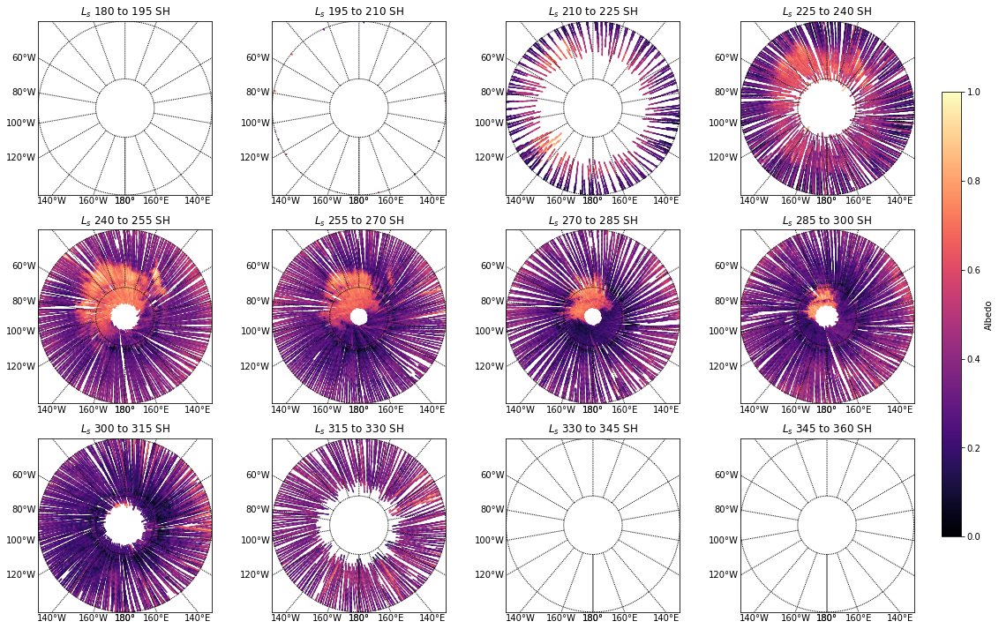

In [75]:
#
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (15,10))
plt.sca(axes[0,0])
#Plotted each small array
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 180 to 195 SH')
x,y = m(np.array(Alb29S[1][12]),np.array(Alb29S[0][12]))
m.scatter(x,y,c=np.array(Alb29S[2][12]), cmap='magma', s= 0.05)
plt.sca(axes[0,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 195 to 210 SH')
x,y = m(np.array(Alb29S[1][13]),np.array(Alb29S[0][13]))
m.scatter(x,y,c=np.array(Alb29S[2][13]), cmap='magma', s= 0.05)
plt.sca(axes[0,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 210 to 225 SH')
x,y = m(np.array(Alb29S[1][14]),np.array(Alb29S[0][14]))
m.scatter(x,y,c=np.array(Alb29S[2][14]), cmap='magma', s= 0.05)
plt.sca(axes[0,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 225 to 240 SH')
x,y = m(np.array(Alb29S[1][15]),np.array(Alb29S[0][15]))
m.scatter(x,y,c=np.array(Alb29S[2][15]), cmap='magma', s= 0.05)
plt.sca(axes[1,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 240 to 255 SH')
x,y = m(np.array(Alb29S[1][16]),np.array(Alb29S[0][16]))
m.scatter(x,y,c=np.array(Alb29S[2][16]), cmap='magma', s= 0.05)
plt.sca(axes[1,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 255 to 270 SH')
x,y = m(np.array(Alb29S[1][17]),np.array(Alb29S[0][17]))
m.scatter(x,y,c=np.array(Alb29S[2][17]), cmap='magma', s= 0.05)
plt.sca(axes[1,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 270 to 285 SH')
x,y = m(np.array(Alb29S[1][18]),np.array(Alb29S[0][18]))
m.scatter(x,y,c=np.array(Alb29S[2][18]), cmap='magma', s= 0.05)
plt.sca(axes[1,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 285 to 300 SH')
x,y = m(np.array(Alb29S[1][19]),np.array(Alb29S[0][19]))
m.scatter(x,y,c=np.array(Alb29S[2][19]), cmap='magma', s= 0.05)
plt.sca(axes[2,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
x,y = m(np.array(Alb29S[1][20]),np.array(Alb29S[0][20]))
plt.title('${L_s}$ 300 to 315 SH')
m.scatter(x,y,c=np.array(Alb29S[2][20]), cmap='magma', s= 0.05)
plt.sca(axes[2,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 315 to 330 SH')
x,y = m(np.array(Alb29S[1][21]),np.array(Alb29S[0][21]))
m.scatter(x,y,c=np.array(Alb29S[2][21]), cmap='magma', s= 0.05)
plt.sca(axes[2,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 330 to 345 SH')
x,y = m(np.array(Alb29S[1][22]),np.array(Alb29S[0][22]))
m.scatter(x,y,c=np.array(Alb29S[2][22]), cmap='magma', s= 0.05)
plt.sca(axes[2,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=-180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 345 to 360 SH')
x,y = m(np.array(Alb29S[1][23]),np.array(Alb29S[0][23]))
m.scatter(x,y,c=np.array(Alb29S[2][23]), cmap='magma', s= 0.05)
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo') 
plt.show()

# Polar Plots for Martian Year 30, JD2455131-2455818 (Southern Hemisphere)

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  """
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  del sys.path[0]
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:21: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7

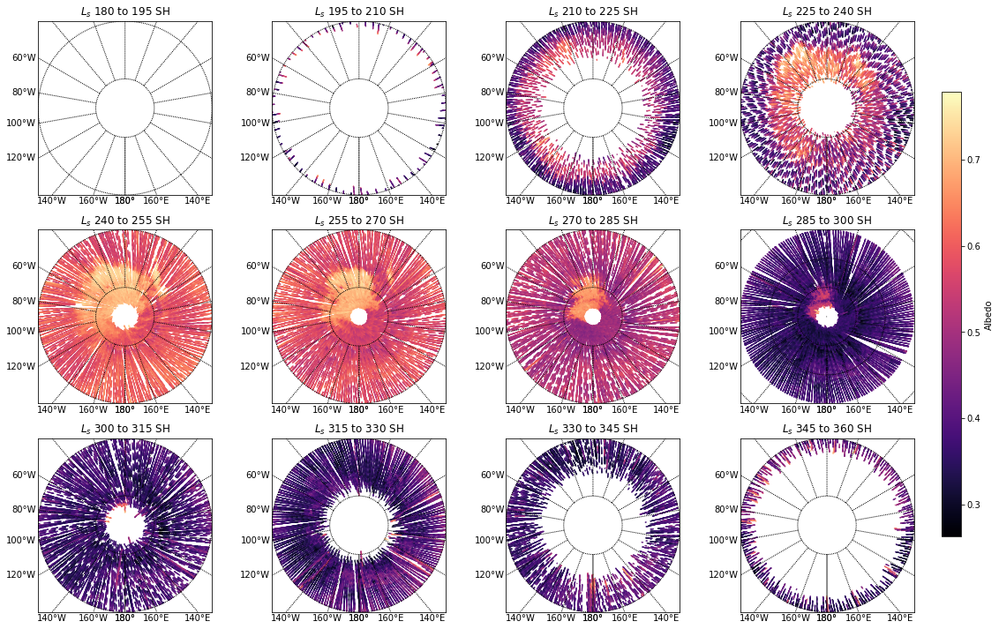

In [76]:
#
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (15,10))
plt.sca(axes[0,0])
#Plotted each small array
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 180 to 195 SH')
x,y = m(np.array(Alb30S[1][12]),np.array(Alb30S[0][12]))
m.scatter(x,y,c=np.array(Alb30S[2][12]), cmap='magma', s= 0.05)
plt.sca(axes[0,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 195 to 210 SH')
x,y = m(np.array(Alb30S[1][13]),np.array(Alb30S[0][13]))
m.scatter(x,y,c=np.array(Alb30S[2][13]), cmap='magma', s= 0.05)
plt.sca(axes[0,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 210 to 225 SH')
x,y = m(np.array(Alb30S[1][14]),np.array(Alb30S[0][14]))
m.scatter(x,y,c=np.array(Alb30S[2][14]), cmap='magma', s= 0.05)
plt.sca(axes[0,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 225 to 240 SH')
x,y = m(np.array(Alb30S[1][15]),np.array(Alb30S[0][15]))
m.scatter(x,y,c=np.array(Alb30S[2][15]), cmap='magma', s= 0.05)
plt.sca(axes[1,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 240 to 255 SH')
x,y = m(np.array(Alb30S[1][16]),np.array(Alb30S[0][16]))
m.scatter(x,y,c=np.array(Alb30S[2][16]), cmap='magma', s= 0.05)
plt.sca(axes[1,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 255 to 270 SH')
x,y = m(np.array(Alb30S[1][17]),np.array(Alb30S[0][17]))
m.scatter(x,y,c=np.array(Alb30S[2][17]), cmap='magma', s= 0.05)
plt.sca(axes[1,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 270 to 285 SH')
x,y = m(np.array(Alb30S[1][18]),np.array(Alb30S[0][18]))
m.scatter(x,y,c=np.array(Alb30S[2][18]), cmap='magma', s= 0.05)
plt.sca(axes[1,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-90.,0.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 285 to 300 SH')
x,y = m(np.array(Alb30S[1][19]),np.array(Alb30S[0][19]))
m.scatter(x,y,c=np.array(Alb30S[2][19]), cmap='magma', s= 0.05)
plt.sca(axes[2,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
x,y = m(np.array(Alb30S[1][20]),np.array(Alb30S[0][20]))
plt.title('${L_s}$ 300 to 315 SH')
m.scatter(x,y,c=np.array(Alb30S[2][20]), cmap='magma', s= 0.05)
plt.sca(axes[2,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 315 to 330 SH')
x,y = m(np.array(Alb30S[1][21]),np.array(Alb30S[0][21]))
m.scatter(x,y,c=np.array(Alb30S[2][21]), cmap='magma', s= 0.05)
plt.sca(axes[2,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 330 to 345 SH')
x,y = m(np.array(Alb30S[1][22]),np.array(Alb30S[0][22]))
m.scatter(x,y,c=np.array(Alb30S[2][22]), cmap='magma', s= 0.05)
plt.sca(axes[2,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 345 to 360 SH')
x,y = m(np.array(Alb30S[1][23]),np.array(Alb30S[0][23]))
m.scatter(x,y,c=np.array(Alb30S[2][23]), cmap='magma', s= 0.05)
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo') 
plt.show()

# Polar Plots for Martian Year 31, JD2455818-2456505 (Southern Hemisphere)

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  """
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  del sys.path[0]
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:21: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7

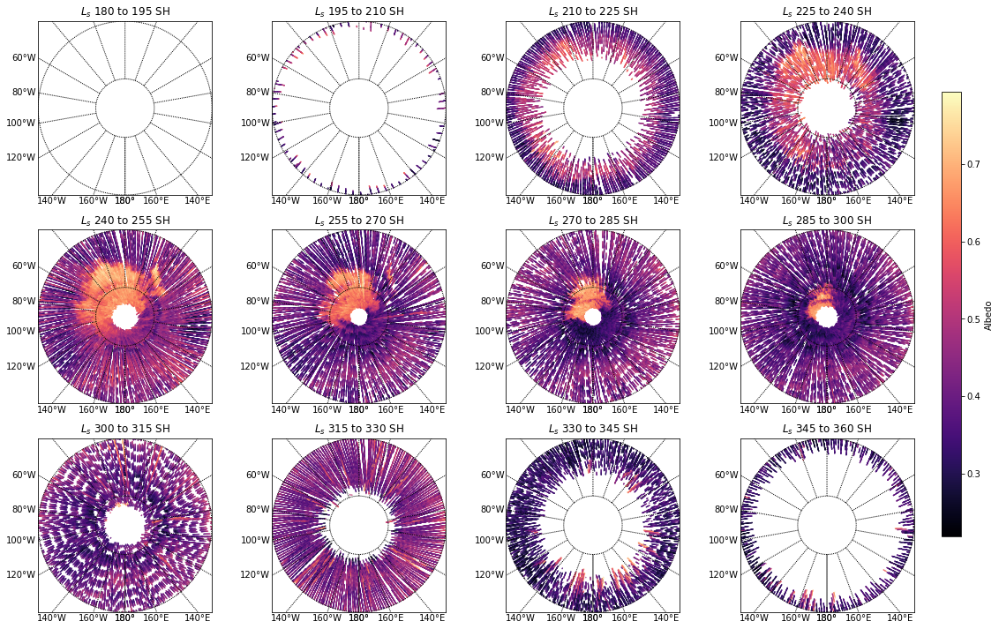

In [77]:
#
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (15,10))
plt.sca(axes[0,0])
#Plotted each small array
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 180 to 195 SH')
x,y = m(np.array(Alb31S[1][12]),np.array(Alb31S[0][12]))
m.scatter(x,y,c=np.array(Alb31S[2][12]), cmap='magma', s= 0.05)
plt.sca(axes[0,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 195 to 210 SH')
x,y = m(np.array(Alb31S[1][13]),np.array(Alb31S[0][13]))
m.scatter(x,y,c=np.array(Alb31S[2][13]), cmap='magma', s= 0.05)
plt.sca(axes[0,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 210 to 225 SH')
x,y = m(np.array(Alb31S[1][14]),np.array(Alb31S[0][14]))
m.scatter(x,y,c=np.array(Alb31S[2][14]), cmap='magma', s= 0.05)
plt.sca(axes[0,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 225 to 240 SH')
x,y = m(np.array(Alb31S[1][15]),np.array(Alb31S[0][15]))
m.scatter(x,y,c=np.array(Alb31S[2][15]), cmap='magma', s= 0.05)
plt.sca(axes[1,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 240 to 255 SH')
x,y = m(np.array(Alb31S[1][16]),np.array(Alb31S[0][16]))
m.scatter(x,y,c=np.array(Alb31S[2][16]), cmap='magma', s= 0.05)
plt.sca(axes[1,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 255 to 270 SH')
x,y = m(np.array(Alb31S[1][17]),np.array(Alb31S[0][17]))
m.scatter(x,y,c=np.array(Alb31S[2][17]), cmap='magma', s= 0.05)
plt.sca(axes[1,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 270 to 285 SH')
x,y = m(np.array(Alb31S[1][18]),np.array(Alb31S[0][18]))
m.scatter(x,y,c=np.array(Alb31S[2][18]), cmap='magma', s= 0.05)
plt.sca(axes[1,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 285 to 300 SH')
x,y = m(np.array(Alb31S[1][19]),np.array(Alb31S[0][19]))
m.scatter(x,y,c=np.array(Alb31S[2][19]), cmap='magma', s= 0.05)
plt.sca(axes[2,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 300 to 315 SH')
x,y = m(np.array(Alb31S[1][20]),np.array(Alb31S[0][20]))
m.scatter(x,y,c=np.array(Alb31S[2][20]), cmap='magma', s= 0.05)
plt.sca(axes[2,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 315 to 330 SH')
x,y = m(np.array(Alb31S[1][21]),np.array(Alb31S[0][21]))
m.scatter(x,y,c=np.array(Alb31S[2][21]), cmap='magma', s= 0.05)
plt.sca(axes[2,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 330 to 345 SH')
x,y = m(np.array(Alb31S[1][22]),np.array(Alb31S[0][22]))
m.scatter(x,y,c=np.array(Alb31S[2][22]), cmap='magma', s= 0.05)
plt.sca(axes[2,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 345 to 360 SH')
x,y = m(np.array(Alb31S[1][23]),np.array(Alb31S[0][23]))
m.scatter(x,y,c=np.array(Alb31S[2][23]), cmap='magma', s= 0.05)
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo') 
plt.show()

# Polar Plots for Martian Year 32, JD2456505-2457192 (Southern Hemisphere)

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  """
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  del sys.path[0]
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:21: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7

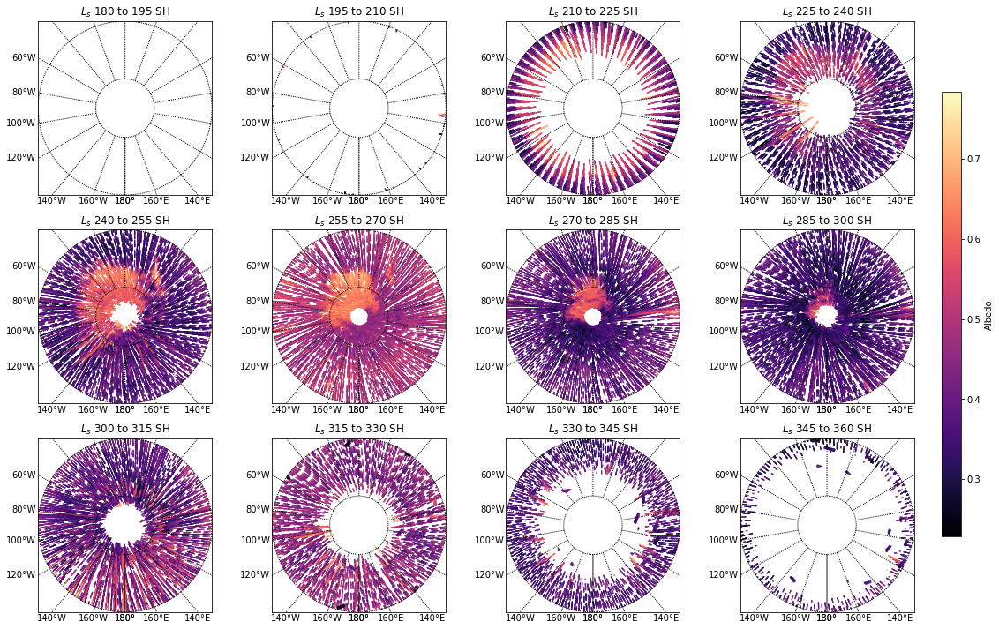

In [78]:
#
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (15,10))
plt.sca(axes[0,0])
#Plotted each small array
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 180 to 195 SH')
x,y = m(np.array(Alb32S[1][12]),np.array(Alb32S[0][12]))
m.scatter(x,y,c=np.array(Alb32S[2][12]), cmap='magma', s= 0.05)
plt.sca(axes[0,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 195 to 210 SH')
x,y = m(np.array(Alb32S[1][13]),np.array(Alb32S[0][13]))
m.scatter(x,y,c=np.array(Alb32S[2][13]), cmap='magma', s= 0.05)
plt.sca(axes[0,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 210 to 225 SH')
x,y = m(np.array(Alb32S[1][14]),np.array(Alb32S[0][14]))
m.scatter(x,y,c=np.array(Alb32S[2][14]), cmap='magma', s= 0.05)
plt.sca(axes[0,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 225 to 240 SH')
x,y = m(np.array(Alb32S[1][15]),np.array(Alb32S[0][15]))
m.scatter(x,y,c=np.array(Alb32S[2][15]), cmap='magma', s= 0.05)
plt.sca(axes[1,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 240 to 255 SH')
x,y = m(np.array(Alb32S[1][16]),np.array(Alb32S[0][16]))
m.scatter(x,y,c=np.array(Alb32S[2][16]), cmap='magma', s= 0.05)
plt.sca(axes[1,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 255 to 270 SH')
x,y = m(np.array(Alb32S[1][17]),np.array(Alb32S[0][17]))
m.scatter(x,y,c=np.array(Alb32S[2][17]), cmap='magma', s= 0.05)
plt.sca(axes[1,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 270 to 285 SH')
x,y = m(np.array(Alb32S[1][18]),np.array(Alb32S[0][18]))
m.scatter(x,y,c=np.array(Alb32S[2][18]), cmap='magma', s= 0.05)
plt.sca(axes[1,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 285 to 300 SH')
x,y = m(np.array(Alb32S[1][19]),np.array(Alb32S[0][19]))
m.scatter(x,y,c=np.array(Alb32S[2][19]), cmap='magma', s= 0.05)
plt.sca(axes[2,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 300 to 315 SH')
x,y = m(np.array(Alb32S[1][20]),np.array(Alb32S[0][20]))
m.scatter(x,y,c=np.array(Alb32S[2][20]), cmap='magma', s= 0.05)
plt.sca(axes[2,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 315 to 330 SH')
x,y = m(np.array(Alb32S[1][21]),np.array(Alb32S[0][21]))
m.scatter(x,y,c=np.array(Alb32S[2][21]), cmap='magma', s= 0.05)
plt.sca(axes[2,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 330 to 345 SH')
x,y = m(np.array(Alb32S[1][22]),np.array(Alb32S[0][22]))
m.scatter(x,y,c=np.array(Alb32S[2][22]), cmap='magma', s= 0.05)
plt.sca(axes[2,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 345 to 360 SH')
x,y = m(np.array(Alb32S[1][23]),np.array(Alb32S[0][23]))
m.scatter(x,y,c=np.array(Alb32S[2][23]), cmap='magma', s= 0.05)
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo') 
plt.show()

# Polar Plots for Martian Year 33,  JD2457192-2457879 (Southern Hemisphere)

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  """
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  del sys.path[0]
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:21: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7

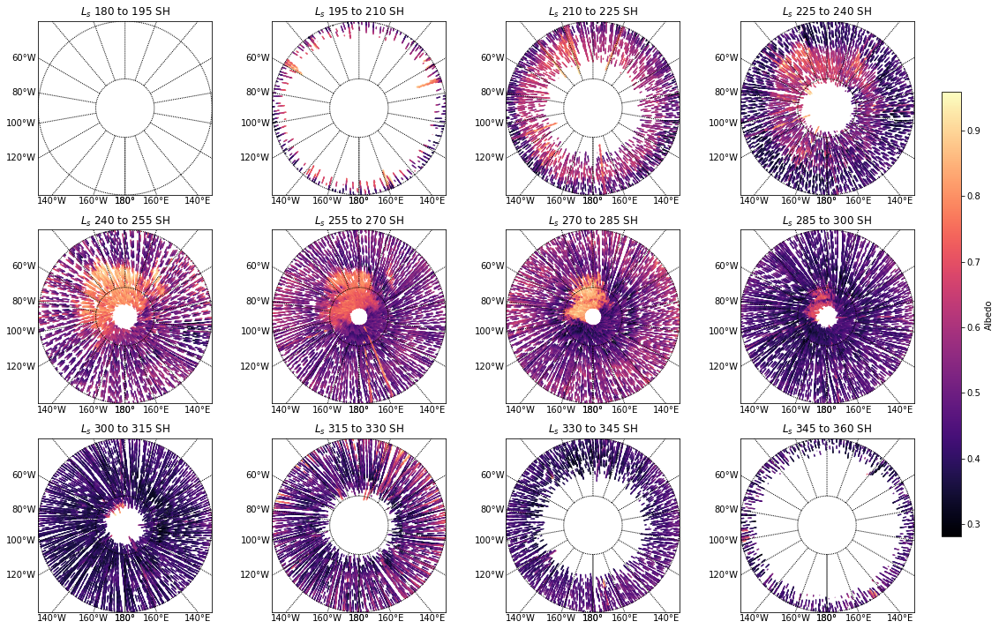

In [79]:
#
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (15,10))
plt.sca(axes[0,0])
#Plotted each small array
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 180 to 195 SH')
x,y = m(np.array(Alb33S[1][12]),np.array(Alb33S[0][12]))
m.scatter(x,y,c=np.array(Alb33S[2][12]), cmap='magma', s= 0.05)
plt.sca(axes[0,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 195 to 210 SH')
x,y = m(np.array(Alb33S[1][13]),np.array(Alb33S[0][13]))
m.scatter(x,y,c=np.array(Alb33S[2][13]), cmap='magma', s= 0.05)
plt.sca(axes[0,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 210 to 225 SH')
x,y = m(np.array(Alb33S[1][14]),np.array(Alb33S[0][14]))
m.scatter(x,y,c=np.array(Alb33S[2][14]), cmap='magma', s= 0.05)
plt.sca(axes[0,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 225 to 240 SH')
x,y = m(np.array(Alb33S[1][15]),np.array(Alb33S[0][15]))
m.scatter(x,y,c=np.array(Alb33S[2][15]), cmap='magma', s= 0.05)
plt.sca(axes[1,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 240 to 255 SH')
x,y = m(np.array(Alb33S[1][16]),np.array(Alb33S[0][16]))
m.scatter(x,y,c=np.array(Alb33S[2][16]), cmap='magma', s= 0.05)
plt.sca(axes[1,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 255 to 270 SH')
x,y = m(np.array(Alb33S[1][17]),np.array(Alb33S[0][17]))
m.scatter(x,y,c=np.array(Alb33S[2][17]), cmap='magma', s= 0.05)
plt.sca(axes[1,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 270 to 285 SH')
x,y = m(np.array(Alb33S[1][18]),np.array(Alb33S[0][18]))
m.scatter(x,y,c=np.array(Alb33S[2][18]), cmap='magma', s= 0.05)
plt.sca(axes[1,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 285 to 300 SH')
x,y = m(np.array(Alb33S[1][19]),np.array(Alb33S[0][19]))
m.scatter(x,y,c=np.array(Alb33S[2][19]), cmap='magma', s= 0.05)
plt.sca(axes[2,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 300 to 315 SH')
x,y = m(np.array(Alb33S[1][20]),np.array(Alb33S[0][20]))
m.scatter(x,y,c=np.array(Alb33S[2][20]), cmap='magma', s= 0.05)
plt.sca(axes[2,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 315 to 330 SH')
x,y = m(np.array(Alb33S[1][21]),np.array(Alb33S[0][21]))
m.scatter(x,y,c=np.array(Alb33S[2][21]), cmap='magma', s= 0.05)
plt.sca(axes[2,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 330 to 345 SH')
x,y = m(np.array(Alb33S[1][22]),np.array(Alb33S[0][22]))
m.scatter(x,y,c=np.array(Alb33S[2][22]), cmap='magma', s= 0.05)
plt.sca(axes[2,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 345 to 360 SH')
x,y = m(np.array(Alb33S[1][23]),np.array(Alb33S[0][23]))
m.scatter(x,y,c=np.array(Alb33S[2][23]), cmap='magma', s= 0.05)
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo') 
plt.show()

# Median Calculation of each hemisphere

In [80]:
def poltocar(latlon, hemisphere, Manual = None, Lat = None, Lon = None):
    '''Function to convert Polar Coordinates into Cartesian
    Input:
    latlon: array containing the polar coordinates
    hemisphere: string to select hemisphere for conversion
    Output:
    x,y: arrays with Cartesian coordinates'''
    rad = np.pi/180
    if Manual == 'Y':
        if hemisphere == 'North' or hemisphere == 'north' or hemisphere == 'N' or hemisphere == 'n':
            R = []
            for i in Lat:
                R.append(2*(np.cos(((i+90)*rad)/2)))
        elif hemisphere == 'South' or hemisphere == 'south' or hemisphere == 'S' or hemisphere == 's':
            R = []
            for i in Lat:
                R.append(2*(np.cos(((90-i)*rad)/2)))
        R = np.array(R)
        e = []
        g = []
        for i in Lon:
            e.append((np.cos(i*rad)))
            g.append((np.sin(i*rad)))
        x = np.array(e)*R
        y = np.array(g)*R
    else:
        if hemisphere == 'North' or hemisphere == 'north' or hemisphere == 'N' or hemisphere == 'n':
            R = []
            for i in latlon[0]:
                R.append(2*(np.cos(((i+90)*rad)/2)))
        elif hemisphere == 'South' or hemisphere == 'south' or hemisphere == 'S' or hemisphere == 's':
            R = []
            for i in latlon[0]:
                R.append(2*(np.cos(((90-i)*rad)/2)))
        R = np.array(R)
        e = []
        g = []
        for i in latlon[1]:
            e.append((np.cos(i*rad)))
            g.append((np.sin(i*rad)))
        x = np.array(e)*R
        y = np.array(g)*R
    return x,y

In [81]:
CAlb29N = poltocar(Alb29N, 'N')
CAlb30N = poltocar(Alb30N, 'N')
CAlb31N = poltocar(Alb31N, 'N')
CAlb32N = poltocar(Alb32N, 'N')
CAlb33N = poltocar(Alb33N, 'N')

In [82]:
CAlb29S = poltocar(Alb29S, 'S')
CAlb30S = poltocar(Alb30S, 'S')
CAlb31S = poltocar(Alb31S, 'S')
CAlb32S = poltocar(Alb32S, 'S')
CAlb33S = poltocar(Alb33S, 'S')

In [83]:
#
x_range = np.arange(-1,1,.01)
y_range = np.arange(-1,1,.01)

xbins, ybins = len(x_range), len(y_range)

N29A, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb29N[0][0],CAlb29N[1][0], values = Alb29N[2][0], statistic='median' , bins = [xbins, ybins])
N31A, _, _, _= stats.binned_statistic_2d(CAlb31N[0][0],CAlb31N[1][0], values = Alb31N[2][0], statistic='median' , bins = [xbins, ybins])
N32A, _, _, _= stats.binned_statistic_2d(CAlb32N[0][0],CAlb32N[1][0], values = Alb32N[2][0], statistic='median' , bins = [xbins, ybins])
N33A, _, _, _= stats.binned_statistic_2d(CAlb33N[0][0],CAlb33N[1][0], values = Alb33N[2][0], statistic='median' , bins = [xbins, ybins])

N29B, _, _, _= stats.binned_statistic_2d(CAlb29N[0][1],CAlb29N[1][1], values = Alb29N[2][1], statistic='median' , bins = [xbins, ybins])
N30B, _, _, _= stats.binned_statistic_2d(CAlb30N[0][1],CAlb30N[1][1], values = Alb30N[2][1], statistic='median' , bins = [xbins, ybins])
N31B, _, _, _= stats.binned_statistic_2d(CAlb31N[0][1],CAlb31N[1][1], values = Alb31N[2][1], statistic='median' , bins = [xbins, ybins])
N32B, _, _, _= stats.binned_statistic_2d(CAlb32N[0][1],CAlb32N[1][1], values = Alb32N[2][1], statistic='median' , bins = [xbins, ybins])
N33B, _, _, _= stats.binned_statistic_2d(CAlb33N[0][1],CAlb33N[1][1], values = Alb33N[2][1], statistic='median' , bins = [xbins, ybins])

N29C, _, _, _= stats.binned_statistic_2d(CAlb29N[0][2],CAlb29N[1][2], values = Alb29N[2][2], statistic='median' , bins = [xbins, ybins])
N30C, _, _, _= stats.binned_statistic_2d(CAlb30N[0][2],CAlb30N[1][2], values = Alb30N[2][2], statistic='median' , bins = [xbins, ybins])
N31C, _, _, _= stats.binned_statistic_2d(CAlb31N[0][2],CAlb31N[1][2], values = Alb31N[2][2], statistic='median' , bins = [xbins, ybins])
N32C, _, _, _= stats.binned_statistic_2d(CAlb32N[0][2],CAlb32N[1][2], values = Alb32N[2][2], statistic='median' , bins = [xbins, ybins])
N33C, _, _, _= stats.binned_statistic_2d(CAlb33N[0][2],CAlb33N[1][2], values = Alb33N[2][2], statistic='median' , bins = [xbins, ybins])

N29D, _, _, _= stats.binned_statistic_2d(CAlb29N[0][3],CAlb29N[1][3], values = Alb29N[2][3], statistic='median' , bins = [xbins, ybins])
N30D, _, _, _= stats.binned_statistic_2d(CAlb30N[0][3],CAlb30N[1][3], values = Alb30N[2][3], statistic='median' , bins = [xbins, ybins])
N31D, _, _, _= stats.binned_statistic_2d(CAlb31N[0][3],CAlb31N[1][3], values = Alb31N[2][3], statistic='median' , bins = [xbins, ybins])
N32D, _, _, _= stats.binned_statistic_2d(CAlb32N[0][3],CAlb32N[1][3], values = Alb32N[2][3], statistic='median' , bins = [xbins, ybins])
N33D, _, _, _= stats.binned_statistic_2d(CAlb33N[0][3],CAlb33N[1][3], values = Alb33N[2][3], statistic='median' , bins = [xbins, ybins])

N29E, _, _, _= stats.binned_statistic_2d(CAlb29N[0][4],CAlb29N[1][4], values = Alb29N[2][4], statistic='median' , bins = [xbins, ybins])
N30E, _, _, _= stats.binned_statistic_2d(CAlb30N[0][4],CAlb30N[1][4], values = Alb30N[2][4], statistic='median' , bins = [xbins, ybins])
N31E, _, _, _= stats.binned_statistic_2d(CAlb31N[0][4],CAlb31N[1][4], values = Alb31N[2][4], statistic='median' , bins = [xbins, ybins])
N32E, _, _, _= stats.binned_statistic_2d(CAlb32N[0][4],CAlb32N[1][4], values = Alb32N[2][4], statistic='median' , bins = [xbins, ybins])
N33E, _, _, _= stats.binned_statistic_2d(CAlb33N[0][4],CAlb33N[1][4], values = Alb33N[2][4], statistic='median' , bins = [xbins, ybins])

#N29F, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb29N[0][5],CAlb29N[1][5], values = Alb29N[2][5], statistic='median' , bins = [xbins, ybins])
N30F, _, _, _= stats.binned_statistic_2d(CAlb30N[0][5],CAlb30N[1][5], values = Alb30N[2][5], statistic='median' , bins = [xbins, ybins])
N31F, _, _, _= stats.binned_statistic_2d(CAlb31N[0][5],CAlb31N[1][5], values = Alb31N[2][5], statistic='median' , bins = [xbins, ybins])
N32F, _, _, _= stats.binned_statistic_2d(CAlb32N[0][5],CAlb32N[1][5], values = Alb32N[2][5], statistic='median' , bins = [xbins, ybins])
N33F, _, _, _= stats.binned_statistic_2d(CAlb33N[0][5],CAlb33N[1][5], values = Alb33N[2][5], statistic='median' , bins = [xbins, ybins])

N29G, _, _, _ = stats.binned_statistic_2d(CAlb29N[0][6],CAlb29N[1][6], values = Alb29N[2][6], statistic='median' , bins = [xbins, ybins])
N30G, _, _, _ = stats.binned_statistic_2d(CAlb30N[0][6],CAlb30N[1][6], values = Alb30N[2][6], statistic='median' , bins = [xbins, ybins])
N31G, _, _, _ = stats.binned_statistic_2d(CAlb31N[0][6],CAlb31N[1][6], values = Alb31N[2][6], statistic='median' , bins = [xbins, ybins])
N32G, _, _, _ = stats.binned_statistic_2d(CAlb32N[0][6],CAlb32N[1][6], values = Alb32N[2][6], statistic='median' , bins = [xbins, ybins])
N33G, _, _, _ = stats.binned_statistic_2d(CAlb33N[0][6],CAlb33N[1][6], values = Alb33N[2][6], statistic='median' , bins = [xbins, ybins])

N29H, _, _, _ = stats.binned_statistic_2d(CAlb29N[0][7],CAlb29N[1][7], values = Alb29N[2][7], statistic='median' , bins = [xbins, ybins])
N30H, _, _, _ = stats.binned_statistic_2d(CAlb30N[0][7],CAlb30N[1][7], values = Alb30N[2][7], statistic='median' , bins = [xbins, ybins])
N31H, _, _, _ = stats.binned_statistic_2d(CAlb31N[0][7],CAlb31N[1][7], values = Alb31N[2][7], statistic='median' , bins = [xbins, ybins])
N32H, _, _, _ = stats.binned_statistic_2d(CAlb32N[0][7],CAlb32N[1][7], values = Alb32N[2][7], statistic='median' , bins = [xbins, ybins])
N33H, _, _, _ = stats.binned_statistic_2d(CAlb33N[0][7],CAlb33N[1][7], values = Alb33N[2][7], statistic='median' , bins = [xbins, ybins])

N29I, _, _, _ = stats.binned_statistic_2d(CAlb29N[0][8],CAlb29N[1][8], values = Alb29N[2][8], statistic='median' , bins = [xbins, ybins])
N30I, _, _, _ = stats.binned_statistic_2d(CAlb30N[0][8],CAlb30N[1][8], values = Alb30N[2][8], statistic='median' , bins = [xbins, ybins])
N31I, _, _, _ = stats.binned_statistic_2d(CAlb31N[0][8],CAlb31N[1][8], values = Alb31N[2][8], statistic='median' , bins = [xbins, ybins])
N32I, _, _, _ = stats.binned_statistic_2d(CAlb32N[0][8],CAlb32N[1][8], values = Alb32N[2][8], statistic='median' , bins = [xbins, ybins])
N33I, _, _, _ = stats.binned_statistic_2d(CAlb33N[0][8],CAlb33N[1][8], values = Alb33N[2][8], statistic='median' , bins = [xbins, ybins])

N29J, _, _, _ = stats.binned_statistic_2d(CAlb29N[0][9],CAlb29N[1][9], values = Alb29N[2][9], statistic='median' , bins = [xbins, ybins])
N30J, _, _, _ = stats.binned_statistic_2d(CAlb30N[0][9],CAlb30N[1][9], values = Alb30N[2][9], statistic='median' , bins = [xbins, ybins])
N31J, _, _, _ = stats.binned_statistic_2d(CAlb31N[0][9],CAlb31N[1][9], values = Alb31N[2][9], statistic='median' , bins = [xbins, ybins])
N32J, _, _, _ = stats.binned_statistic_2d(CAlb32N[0][9],CAlb32N[1][9], values = Alb32N[2][9], statistic='median' , bins = [xbins, ybins])
N33J, _, _, _ = stats.binned_statistic_2d(CAlb33N[0][9],CAlb33N[1][9], values = Alb33N[2][9], statistic='median' , bins = [xbins, ybins])

N29K, _, _, _ = stats.binned_statistic_2d(CAlb29N[0][10],CAlb29N[1][10], values = Alb29N[2][10], statistic='median' , bins = [xbins, ybins])
N30K, _, _, _ = stats.binned_statistic_2d(CAlb30N[0][10],CAlb30N[1][10], values = Alb30N[2][10], statistic='median' , bins = [xbins, ybins])
N31K, _, _, _ = stats.binned_statistic_2d(CAlb31N[0][10],CAlb31N[1][10], values = Alb31N[2][10], statistic='median' , bins = [xbins, ybins])
N32K, _, _, _ = stats.binned_statistic_2d(CAlb32N[0][10],CAlb32N[1][10], values = Alb32N[2][10], statistic='median' , bins = [xbins, ybins])
N33K, _, _, _ = stats.binned_statistic_2d(CAlb33N[0][10],CAlb33N[1][10], values = Alb33N[2][10], statistic='median' , bins = [xbins, ybins])


#N30L, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb30N[0][11],CAlb30N[1][11], values = Alb30N[2][11], statistic='median' , bins = [xbins, ybins])
#N32L, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb32N[0][11],CAlb32N[1][11], values = Alb32N[2][11], statistic='median' , bins = [xbins, ybins])
#N33L, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb33N[0][11],CAlb33N[1][11], values = Alb33N[2][11], statistic='median' , bins = [xbins, ybins])

In [84]:
#
x_range = np.arange(-1,1,.01)
y_range = np.arange(-1,1,.01)

xbins, ybins = len(x_range), len(y_range)
#S29A, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb29S[0][12],CAlb29S[1][12], values = Alb29S[2][12], statistic='median' , bins = [xbins, ybins])
#S30A, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb30S[0][12],CAlb30S[1][12], values = Alb30S[2][12], statistic='median' , bins = [xbins, ybins])
#S31A, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb31S[0][12],CAlb31S[1][12], values = Alb31S[2][12], statistic='median' , bins = [xbins, ybins])
#S32A, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb32S[0][12],CAlb32S[1][12], values = Alb32S[2][12], statistic='median' , bins = [xbins, ybins])
#S33A, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb33S[0][12],CAlb33S[1][12], values = Alb33S[2][12], statistic='median' , bins = [xbins, ybins])


#S29B, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb29S[0][13],CAlb29S[1][13], values = Alb29S[2][13], statistic='median' , bins = [xbins, ybins])
#S30B, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb30S[0][13],CAlb30S[1][13], values = Alb30S[2][13], statistic='median' , bins = [xbins, ybins])
#S31B, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb31S[0][13],CAlb31S[1][13], values = Alb31S[2][13], statistic='median' , bins = [xbins, ybins])
#S32B, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb32S[0][13],CAlb32S[1][13], values = Alb32S[2][13], statistic='median' , bins = [xbins, ybins])
#S33B, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb33S[0][13],CAlb33S[1][13], values = Alb33S[2][13], statistic='median' , bins = [xbins, ybins])

S29C, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb29S[0][14],CAlb29S[1][14], values = Alb29S[2][14], statistic='median' , bins = [xbins, ybins])
S30C, _, _, _ = stats.binned_statistic_2d(CAlb30S[0][14],CAlb30S[1][14], values = Alb30S[2][14], statistic='median' , bins = [xbins, ybins])
S31C, _, _, _ = stats.binned_statistic_2d(CAlb31S[0][14],CAlb31S[1][14], values = Alb31S[2][14], statistic='median' , bins = [xbins, ybins])
S32C, _, _, _ = stats.binned_statistic_2d(CAlb32S[0][14],CAlb32S[1][14], values = Alb32S[2][14], statistic='median' , bins = [xbins, ybins])
S33C, _, _, _ = stats.binned_statistic_2d(CAlb33S[0][14],CAlb33S[1][14], values = Alb33S[2][14], statistic='median' , bins = [xbins, ybins])

S29D, _, _, _ = stats.binned_statistic_2d(CAlb29S[0][15],CAlb29S[1][15], values = Alb29S[2][15], statistic='median' , bins = [xbins, ybins])
S30D, _, _, _ = stats.binned_statistic_2d(CAlb30S[0][15],CAlb30S[1][15], values = Alb30S[2][15], statistic='median' , bins = [xbins, ybins])
S31D, _, _, _ = stats.binned_statistic_2d(CAlb31S[0][15],CAlb31S[1][15], values = Alb31S[2][15], statistic='median' , bins = [xbins, ybins])
S32D, _, _, _ = stats.binned_statistic_2d(CAlb32S[0][15],CAlb32S[1][15], values = Alb32S[2][15], statistic='median' , bins = [xbins, ybins])
S33D, _, _, _ = stats.binned_statistic_2d(CAlb33S[0][15],CAlb33S[1][15], values = Alb33S[2][15], statistic='median' , bins = [xbins, ybins])

S29E, _, _, _ = stats.binned_statistic_2d(CAlb29S[0][16],CAlb29S[1][16], values = Alb29S[2][16], statistic='median' , bins = [xbins, ybins])
S30E, _, _, _ = stats.binned_statistic_2d(CAlb30S[0][16],CAlb30S[1][16], values = Alb30S[2][16], statistic='median' , bins = [xbins, ybins])
S31E, _, _, _ = stats.binned_statistic_2d(CAlb31S[0][16],CAlb31S[1][16], values = Alb31S[2][16], statistic='median' , bins = [xbins, ybins])
S32E, _, _, _ = stats.binned_statistic_2d(CAlb32S[0][16],CAlb32S[1][16], values = Alb32S[2][16], statistic='median' , bins = [xbins, ybins])
S33E, _, _, _ = stats.binned_statistic_2d(CAlb33S[0][16],CAlb33S[1][16], values = Alb33S[2][16], statistic='median' , bins = [xbins, ybins])

S29F, _, _, _ = stats.binned_statistic_2d(CAlb29S[0][17],CAlb29S[1][17], values = Alb29S[2][17], statistic='median' , bins = [xbins, ybins])
S30F, _, _, _ = stats.binned_statistic_2d(CAlb30S[0][17],CAlb30S[1][17], values = Alb30S[2][17], statistic='median' , bins = [xbins, ybins])
S31F, _, _, _ = stats.binned_statistic_2d(CAlb31S[0][17],CAlb31S[1][17], values = Alb31S[2][17], statistic='median' , bins = [xbins, ybins])
S32F, _, _, _ = stats.binned_statistic_2d(CAlb32S[0][17],CAlb32S[1][17], values = Alb32S[2][17], statistic='median' , bins = [xbins, ybins])
S33F, _, _, _ = stats.binned_statistic_2d(CAlb33S[0][17],CAlb33S[1][17], values = Alb33S[2][17], statistic='median' , bins = [xbins, ybins])

S29G, _, _, _ = stats.binned_statistic_2d(CAlb29S[0][18],CAlb29S[1][18], values = Alb29S[2][18], statistic='median' , bins = [xbins, ybins])
S30G, _, _, _ = stats.binned_statistic_2d(CAlb30S[0][18],CAlb30S[1][18], values = Alb30S[2][18], statistic='median' , bins = [xbins, ybins])
S31G, _, _, _ = stats.binned_statistic_2d(CAlb31S[0][18],CAlb31S[1][18], values = Alb31S[2][18], statistic='median' , bins = [xbins, ybins])
S32G, _, _, _ = stats.binned_statistic_2d(CAlb32S[0][18],CAlb32S[1][18], values = Alb32S[2][18], statistic='median' , bins = [xbins, ybins])
S33G, _, _, _ = stats.binned_statistic_2d(CAlb33S[0][18],CAlb33S[1][18], values = Alb33S[2][18], statistic='median' , bins = [xbins, ybins])

S29H, _, _, _ = stats.binned_statistic_2d(CAlb29S[0][19],CAlb29S[1][19], values = Alb29S[2][19], statistic='median' , bins = [xbins, ybins])
S30H, _, _, _ = stats.binned_statistic_2d(CAlb30S[0][19],CAlb30S[1][19], values = Alb30S[2][19], statistic='median' , bins = [xbins, ybins])
S31H, _, _, _ = stats.binned_statistic_2d(CAlb31S[0][19],CAlb31S[1][19], values = Alb31S[2][19], statistic='median' , bins = [xbins, ybins])
S32H, _, _, _ = stats.binned_statistic_2d(CAlb32S[0][19],CAlb32S[1][19], values = Alb32S[2][19], statistic='median' , bins = [xbins, ybins])
S33H, _, _, _ = stats.binned_statistic_2d(CAlb33S[0][19],CAlb33S[1][19], values = Alb33S[2][19], statistic='median' , bins = [xbins, ybins])

S29I, _, _, _ = stats.binned_statistic_2d(CAlb29S[0][20],CAlb29S[1][20], values = Alb29S[2][20], statistic='median' , bins = [xbins, ybins])
S30I, _, _, _ = stats.binned_statistic_2d(CAlb30S[0][20],CAlb30S[1][20], values = Alb30S[2][20], statistic='median' , bins = [xbins, ybins])
S31I, _, _, _ = stats.binned_statistic_2d(CAlb31S[0][20],CAlb31S[1][20], values = Alb31S[2][20], statistic='median' , bins = [xbins, ybins])
S32I, _, _, _ = stats.binned_statistic_2d(CAlb32S[0][20],CAlb32S[1][20], values = Alb32S[2][20], statistic='median' , bins = [xbins, ybins])
S33I, _, _, _ = stats.binned_statistic_2d(CAlb33S[0][20],CAlb33S[1][20], values = Alb33S[2][20], statistic='median' , bins = [xbins, ybins])

S29J, _, _, _ = stats.binned_statistic_2d(CAlb29S[0][21],CAlb29S[1][21], values = Alb29S[2][21], statistic='median' , bins = [xbins, ybins])
S30J, _, _, _ = stats.binned_statistic_2d(CAlb30S[0][21],CAlb30S[1][21], values = Alb30S[2][21], statistic='median' , bins = [xbins, ybins])
S31J, _, _, _ = stats.binned_statistic_2d(CAlb31S[0][21],CAlb31S[1][21], values = Alb31S[2][21], statistic='median' , bins = [xbins, ybins])
S32J, _, _, _ = stats.binned_statistic_2d(CAlb32S[0][21],CAlb32S[1][21], values = Alb32S[2][21], statistic='median' , bins = [xbins, ybins])
S33J, _, _, _ = stats.binned_statistic_2d(CAlb33S[0][21],CAlb33S[1][21], values = Alb33S[2][21], statistic='median' , bins = [xbins, ybins])

S30K, _, _, _ = stats.binned_statistic_2d(CAlb30S[0][22],CAlb30S[1][22], values = Alb30S[2][22], statistic='median' , bins = [xbins, ybins])
S31K, _, _, _ = stats.binned_statistic_2d(CAlb31S[0][22],CAlb31S[1][22], values = Alb31S[2][22], statistic='median' , bins = [xbins, ybins])
S32K, _, _, _ = stats.binned_statistic_2d(CAlb32S[0][22],CAlb32S[1][22], values = Alb32S[2][22], statistic='median' , bins = [xbins, ybins])
S33K, _, _, _ = stats.binned_statistic_2d(CAlb33S[0][22],CAlb33S[1][22], values = Alb33S[2][22], statistic='median' , bins = [xbins, ybins])

#S30L, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb30S[0][23],CAlb30S[1][23], values = Alb30S[2][23], statistic='median' , bins = [xbins, ybins])
#S31L, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb31S[0][23],CAlb31S[1][23], values = Alb31S[2][23], statistic='median' , bins = [xbins, ybins])
#S32L, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb32S[0][23],CAlb32S[1][23], values = Alb32S[2][23], statistic='median' , bins = [xbins, ybins])
#S33L, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb33S[0][23],CAlb33S[1][23], values = Alb33S[2][23], statistic='median' , bins = [xbins, ybins])

In [85]:
def medianstack(*args): 
    x = np.dstack((args))
    y = np.nanmedian(x, axis=2)
    return y
def meanstack(*args): 
    x = np.dstack((args))
    y = np.nanmean(x, axis=2)
    return y

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1115: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:32: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:39: MatplotlibDeprecationWarning: 
The dedent

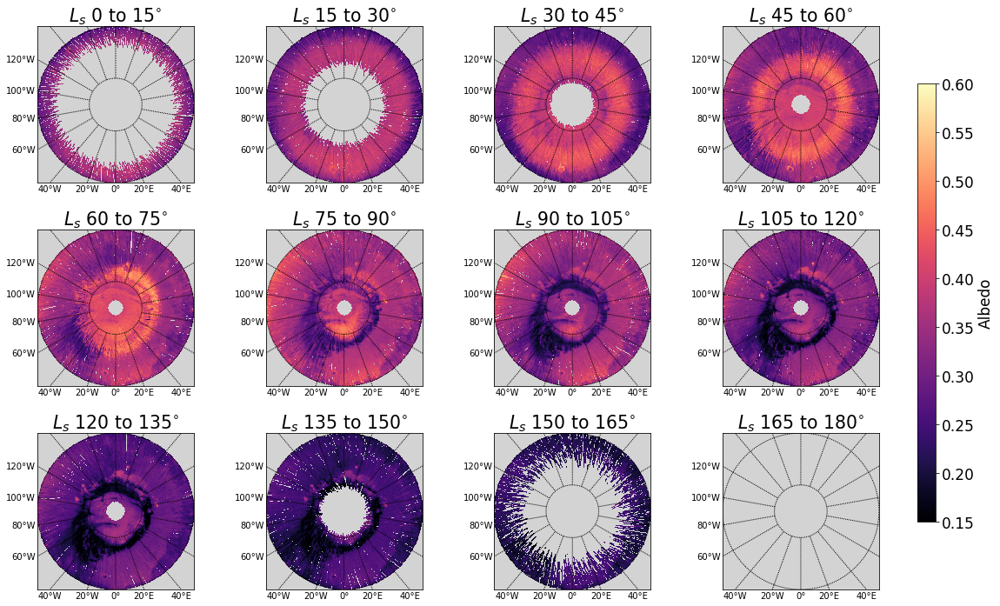

In [86]:
#
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (15,10))
plt.rcParams.update({'font.size': 17})
fig.patch.set_alpha(0.0)
axes[0,0].set_facecolor('lightgrey')
axes[0,1].set_facecolor('lightgrey')
axes[0,2].set_facecolor('lightgrey')
axes[0,3].set_facecolor('lightgrey')
axes[1,0].set_facecolor('lightgrey')
axes[1,1].set_facecolor('lightgrey')
axes[1,2].set_facecolor('lightgrey')
axes[1,3].set_facecolor('lightgrey')
axes[2,0].set_facecolor('lightgrey')
axes[2,1].set_facecolor('lightgrey')
axes[2,2].set_facecolor('lightgrey')
axes[2,3].set_facecolor('lightgrey')
plt.sca(axes[0,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(medianstack(N29A,N31A,N32A,N33A), origin='upper', cmap = 'magma')
plt.clim(.15,.6)
plt.title('${L_s}$ 0 to $15^{\circ}$')
plt.sca(axes[0,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(medianstack(N29B,N30B,N31B,N32B,N33B), origin='upper', cmap = 'magma')
plt.clim(.15,.6)
plt.title('${L_s}$ 15 to $30^{\circ}$')
plt.sca(axes[0,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(medianstack(N29C,N30C,N31C,N32C,N33C), origin='upper', cmap = 'magma')
plt.clim(.15,.6)
plt.title('${L_s}$ 30 to $45^{\circ}$')
plt.sca(axes[0,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(medianstack(N29D,N30D,N31D,N32C,N33D), origin='upper', cmap = 'magma')
plt.clim(.15,.6)
plt.title('${L_s}$ 45 to $60^{\circ}$')
plt.sca(axes[1,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(medianstack(N29E,N30E,N31E,N32E,N33E), origin='upper', cmap = 'magma')
plt.clim(.15,.6)
plt.title('${L_s}$ 60 to $75^{\circ}$')
plt.sca(axes[1,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(medianstack(N30F,N31F,N32F,N33F), origin='upper', cmap = 'magma')
plt.clim(.15,.6)
plt.title('${L_s}$ 75 to $90^{\circ}$')
plt.sca(axes[1,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(medianstack(N29G,N30G,N31G,N32G,N33G), origin='upper', cmap = 'magma')
plt.clim(.15,.6)
plt.title('${L_s}$ 90 to $105^{\circ}$')
plt.sca(axes[1,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(medianstack(N29H,N30H,N31H,N32H,N33H), origin='upper', cmap = 'magma')
plt.clim(.15,.6)
plt.title('${L_s}$ 105 to $120^{\circ}$')
plt.sca(axes[2,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(medianstack(N29I,N30I,N31I,N33I), origin='upper', cmap = 'magma')
plt.clim(.15,.6)
plt.title('${L_s}$ 120 to $135^{\circ}$')
plt.sca(axes[2,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(medianstack(N29J,N30J,N31J,N33J), origin='upper', cmap = 'magma')
plt.clim(.15,.6)
plt.title('${L_s}$ 135 to $150^{\circ}$')
plt.sca(axes[2,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(medianstack(N29K,N30K,N31K,N33K), origin='upper', cmap = 'magma')
plt.clim(.15,.6)
plt.title('${L_s}$ 150 to $165^{\circ}$')
plt.sca(axes[2,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
#m.imshow(medianstack(N33L), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 165 to $180^{\circ}$')
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo')
plt.savefig('NAlb.png', dpi= 300, facecolor=fig.get_facecolor(), bbox_inches = 'tight')
plt.show()

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  import sys
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:30: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-pa

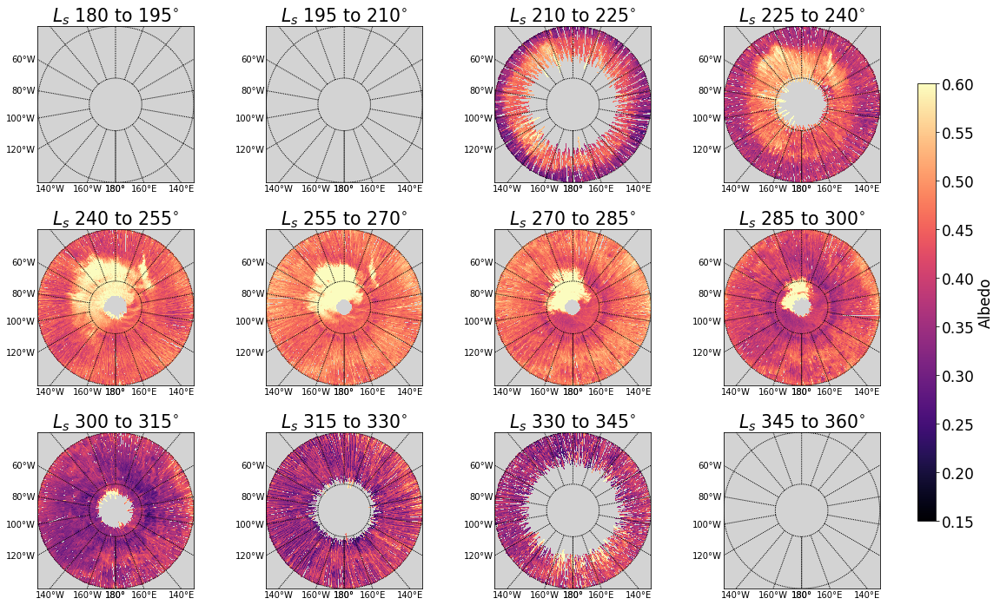

In [87]:
#
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (15,10))
plt.rcParams.update({'font.size': 17})
fig.patch.set_alpha(0.0)
plt.sca(axes[0,0])
axes[0,0].set_facecolor('lightgrey')
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
#plt.clim(.26,.74)
plt.title('${L_s}$ 180 to $195^{\circ}$')
plt.sca(axes[0,1])
axes[0,1].set_facecolor('lightgrey')
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
#m.imshow(medianstack(S33B),cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
#plt.clim(.15,.74)
plt.title('${L_s}$ 195 to $210^{\circ}$')
plt.sca(axes[0,2])
axes[0,2].set_facecolor('lightgrey')
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(medianstack(S29C,S30C,S31C,S32C,S33C),cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.clim(.15,.6)
plt.title('${L_s}$ 210 to $225^{\circ}$')
plt.sca(axes[0,3])
axes[0,3].set_facecolor('lightgrey')
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(medianstack(S29D,S30D,S31D,S32D,S33D),cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 225 to $240^{\circ}$')
plt.clim(.15,.6)
plt.sca(axes[1,0])
axes[1,0].set_facecolor('lightgrey')
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(medianstack(S29E,S30E,S31E,S32E,S33E),cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.clim(.15,.6)
plt.title('${L_s}$ 240 to $255^{\circ}$')
plt.sca(axes[1,1])
axes[1,1].set_facecolor('lightgrey')
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(medianstack(S29F,S30F,S31F,S32F,S33F),cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.clim(.15,.6)
plt.title('${L_s}$ 255 to $270^{\circ}$')
plt.sca(axes[1,2])
axes[1,2].set_facecolor('lightgrey')
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(medianstack(S29G,S30G,S31G,S32G,S33G),cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.clim(.15,.6)
plt.title('${L_s}$ 270 to $285^{\circ}$')
plt.sca(axes[1,3])
axes[1,3].set_facecolor('lightgrey')
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(medianstack(S29H,S30H,S31H,S32H,S33H),cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.clim(.15,.6)
plt.title('${L_s}$ 285 to $300^{\circ}$')
plt.sca(axes[2,0])
axes[2,0].set_facecolor('lightgrey')
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(medianstack(S29I,S30I,S31I,S33I),cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.clim(.15,.6)
plt.title('${L_s}$ 300 to $315^{\circ}$')
plt.sca(axes[2,1])
axes[2,1].set_facecolor('lightgrey')
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(medianstack(S29J,S30J,S31J,S33J),cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.clim(.15,.6)
plt.title('${L_s}$ 315 to $330^{\circ}$')
plt.sca(axes[2,2])
axes[2,2].set_facecolor('lightgrey')
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(medianstack(S30K,S31K,S33K),cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.clim(.15,.6)
plt.title('${L_s}$ 330 to $345^{\circ}$')
plt.sca(axes[2,3])
axes[2,3].set_facecolor('lightgrey')
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
#m.imshow(medianstack(S30L,S31L,S33L),cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.clim(.15,.6)
plt.title('${L_s}$ 345 to $360^{\circ}$')
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo')
plt.savefig('SAlb.png', dpi= 300, facecolor=fig.get_facecolor(), bbox_inches = 'tight')
plt.show()

In [88]:
def emi(IR, FPT):
    '''Function to calculate emissivity using frost point temperature and infrared flux
    Input:
    IR - Infrared Array
    FPT - Frost Point Temperature
    Output:
    e- emissivity array'''
    b = planck(IR, 3.2e-5)
    fp = planck(FPT, 3.2e-5)
    e = b/fp
    return e

In [89]:
def binreduce(emi, alb):
    '''function to find bins in albedo mapr that match the emissivity bins
    Input:
    emi - Emissivity Array
    alb - Albedo Array
    Output:
    emi - Matching Emissivity Array
    alb - Matching Albedo Array'''
    emi = pd.DataFrame(emi)
    alb = pd.DataFrame(alb)
    matchemi = emi.mask(alb.isnull())
    matchalb = alb.mask(emi.isnull())
    return matchemi, matchalb     

In [90]:
pi = np.pi
h = 6.626e-34
c = 3.0e+8
k = 1.38e-23

def planck(T, wav):
    a = 2.0*h*pi*c**2
    b = h*c/(wav*k*T)
    intensity = a/ ( (wav**5)*(math.e**b - 1.0) )
    return intensity

In [91]:
df = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data/surf_bT_ret_171031.txt', header=None, delimiter=r"\s+", names = [' ', 'UTC', 'MY', 'L_s', 'LTST', 'Surf_lat', 'Surf_lon', 'Surf_rad', 'Surf_elev', 'T_surf', 'T_surf_err', 'Dust_column', 'Dust_column_err', 'H2Oice_column', 'H2Oice_column_err', 'p_surf', 'p_surf_err', 'P_qual', 'T_qual'])
#read data into dataframe

In [92]:
df['Sol'] = ls2sol(df['L_s'],8)
dfday = df[df['LTST'] >= .5]
dfnight = df[df['LTST'] <= .5]

In [93]:
cond = (df['MY'],df['L_s'],pco2(df['T_surf']), df['p_surf'], tco2(df['p_surf']), df['p_surf_err'], df['T_surf'], df['LTST'], df['Surf_lat'], df['Surf_lon'], df['Dust_column'] , df['Sol'] )
cond_right= np.transpose(cond)
CO2 = pd.DataFrame([cond_right][0])
CO2.columns = ['MY','L_s','Eq_Vap_P','p_surf','Frost_T','p_err','T_surf','LTST', 'Surf_lat', 'Surf_lon', 'Dust_column', 'Sol']

In [94]:
CO2['p_err'] = CO2['p_err'].where(CO2['p_err'] > 0, 0)

In [95]:
newCO2 = CO2[(CO2['Eq_Vap_P'] <= (CO2['p_surf'])) & (CO2['MY'] > 28.0) & (CO2['MY'] <34.0)] 

In [96]:
CO2day = newCO2[newCO2['LTST'] >= 0.5]

In [97]:
SubCO2DayN = SubEmiDict(CO2day, L_sStep = 15.0, RanLat=[60.0,87.0])
SubCO2DayS = SubEmiDict(CO2day, L_sStep = 15.0, RanLat=[-87.0,-60.0])

In [98]:
SubnewNorth = SubEmiDict(newCO2, L_sStep = 15.0, RanLat=[60.0,87.0])
SubnewSouth = SubEmiDict(newCO2, L_sStep = 15.0, RanLat=[-87.0,-60.0])

In [99]:
CO2DayN = DataEmi(SubCO2DayN)
CO2DayS = DataEmi(SubCO2DayS)

In [100]:
newCO2N = DataEmi(SubnewNorth)
newCO2S = DataEmi(SubnewSouth)

In [101]:
del(SubCO2DayN,SubCO2DayS,SubnewNorth,SubnewSouth)

In [102]:
CO2EAN = poltocar(CO2DayN, 'N')
CO2EAS = poltocar(CO2DayS, 'S')

In [103]:
NEWEAN = poltocar(newCO2N, 'N')
NEWEAS = poltocar(newCO2S, 'S')

In [104]:
def center(Series, Stype):
    newpoint1 = pd.Series([-0.5])
    newpoint2 = pd.Series([0.5])
    newpoint3 = pd.Series([0])
    if Stype == 'loc':
        Series = Series.append(newpoint1)
        Series = Series.append(newpoint2)
    elif Stype == 'IR':
        Series = Series.append(newpoint3)
        Series = Series.append(newpoint3)
    return Series

In [105]:
#
x_range = np.arange(-1,1,.01)
y_range = np.arange(-1,1,.01)
xbins, ybins = len(x_range), len(y_range)

NIR0, xedges, yedges, binnumber = stats.binned_statistic_2d(center(CO2EAN[1][0], 'loc'), center(CO2EAN[0][0], 'loc'), values = center(CO2DayN[2][0], 'IR'), statistic='mean' , bins = [xbins, ybins])
NIR1, _, _, _ = stats.binned_statistic_2d(center(CO2EAN[0][1], 'loc'), center(CO2EAN[1][1], 'loc'), values = center(CO2DayN[2][1], 'IR'), statistic='mean' , bins = [xbins, ybins])
NIR2, _, _, _ = stats.binned_statistic_2d(center(CO2EAN[0][2], 'loc'), center(CO2EAN[1][2], 'loc'), values = center(CO2DayN[2][2], 'IR'), statistic='mean' , bins = [xbins, ybins])
NIR3, _, _, _ = stats.binned_statistic_2d(center(CO2EAN[0][3], 'loc'), center(CO2EAN[1][3], 'loc'), values = center(CO2DayN[2][3], 'IR'), statistic='mean' , bins = [xbins, ybins])
NIR4, _, _, _ = stats.binned_statistic_2d(center(CO2EAN[0][4], 'loc'), center(CO2EAN[1][4], 'loc'), values = center(CO2DayN[2][4], 'IR'), statistic='mean' , bins = [xbins, ybins])
NIR5, _, _, _ = stats.binned_statistic_2d(center(CO2EAN[0][5], 'loc'), center(CO2EAN[1][5], 'loc'), values = center(CO2DayN[2][5], 'IR'), statistic='mean' , bins = [xbins, ybins])
#NIR6, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAN[0][6], CO2EAN[1][6], values = CO2DayN[4][6], statistic='mean' , bins = [xbins, ybins])
#NIR7, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAN[0][7], CO2EAN[1][7], values = CO2DayN[4][7], statistic='mean' , bins = [xbins, ybins])
#NIR8, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAN[0][8], CO2EAN[1][8], values = CO2DayN[4][8], statistic='mean' , bins = [xbins, ybins])
#NIR9, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAN[0][9], CO2EAN[1][9], values = CO2DayN[4][9], statistic='mean' , bins = [xbins, ybins])
#NIR10, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAN[0][10], CO2EAN[1][10], values = CO2DayN[4][10], statistic='mean' , bins = [xbins, ybins])
#NIR11, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAN[0][11], CO2EAN[1][11], values = CO2DayN[4][11], statistic='mean' , bins = [xbins, ybins])
NIR12, _, _, _ = stats.binned_statistic_2d(center(NEWEAN[0][12], 'loc'), center(NEWEAN[1][12], 'loc'), values = center(newCO2N[2][12], 'IR'), statistic='mean' , bins = [xbins, ybins])
NIR13, _, _, _ = stats.binned_statistic_2d(center(NEWEAN[0][13], 'loc'), center(NEWEAN[1][13], 'loc'), values = center(newCO2N[2][13], 'IR'), statistic='mean' , bins = [xbins, ybins])
NIR14, _, _, _ = stats.binned_statistic_2d(center(NEWEAN[0][14], 'loc'), center(NEWEAN[1][14], 'loc'), values = center(newCO2N[2][14], 'IR'), statistic='mean' , bins = [xbins, ybins])
NIR15, _, _, _ = stats.binned_statistic_2d(center(NEWEAN[0][15], 'loc'), center(NEWEAN[1][15], 'loc'), values = center(newCO2N[2][15], 'IR'), statistic='mean' , bins = [xbins, ybins])
NIR16, _, _, _ = stats.binned_statistic_2d(center(NEWEAN[0][16], 'loc'), center(NEWEAN[1][16], 'loc'), values = center(newCO2N[2][16], 'IR'), statistic='mean' , bins = [xbins, ybins])
NIR17, _, _, _ = stats.binned_statistic_2d(center(NEWEAN[0][17], 'loc'), center(NEWEAN[1][17], 'loc'), values = center(newCO2N[2][17], 'IR'), statistic='mean' , bins = [xbins, ybins])
NIR18, _, _, _ = stats.binned_statistic_2d(center(NEWEAN[0][18], 'loc'), center(NEWEAN[1][18], 'loc'), values = center(newCO2N[2][18], 'IR'), statistic='mean' , bins = [xbins, ybins])
NIR19, _, _, _ = stats.binned_statistic_2d(center(NEWEAN[0][19], 'loc'), center(NEWEAN[1][19], 'loc'), values = center(newCO2N[2][19], 'IR'), statistic='mean' , bins = [xbins, ybins])
NIR20, _, _, _ = stats.binned_statistic_2d(center(NEWEAN[0][20], 'loc'), center(NEWEAN[1][20], 'loc'), values = center(newCO2N[2][20], 'IR'), statistic='mean' , bins = [xbins, ybins])
NIR21, _, _, _ = stats.binned_statistic_2d(center(NEWEAN[0][21], 'loc'), center(NEWEAN[1][21], 'loc'), values = center(newCO2N[2][21], 'IR'), statistic='mean' , bins = [xbins, ybins])
NIR22, _, _, _ = stats.binned_statistic_2d(center(NEWEAN[0][22], 'loc'), center(NEWEAN[1][22], 'loc'), values = center(newCO2N[2][22], 'IR'), statistic='mean' , bins = [xbins, ybins])
NIR23, _, _, _ = stats.binned_statistic_2d(center(NEWEAN[0][23], 'loc'), center(NEWEAN[1][23], 'loc'), values = center(newCO2N[2][23], 'IR'), statistic='mean' , bins = [xbins, ybins])

NFPT0, _, _, _ = stats.binned_statistic_2d(center(CO2EAN[0][0], 'loc'), center(CO2EAN[1][0], 'loc'), values = center(CO2DayN[5][0], 'IR'), statistic='mean' , bins = [xbins, ybins])
NFPT1, _, _, _ = stats.binned_statistic_2d(center(CO2EAN[0][1], 'loc'), center(CO2EAN[1][1], 'loc'), values = center(CO2DayN[5][1], 'IR'), statistic='mean' , bins = [xbins, ybins])
NFPT2, _, _, _ = stats.binned_statistic_2d(center(CO2EAN[0][2], 'loc'), center(CO2EAN[1][2], 'loc'), values = center(CO2DayN[5][2], 'IR'), statistic='mean' , bins = [xbins, ybins])
NFPT3, _, _, _ = stats.binned_statistic_2d(center(CO2EAN[0][3], 'loc'), center(CO2EAN[1][3], 'loc'), values = center(CO2DayN[5][3], 'IR'), statistic='mean' , bins = [xbins, ybins])
NFPT4, _, _, _ = stats.binned_statistic_2d(center(CO2EAN[0][4], 'loc'), center(CO2EAN[1][4], 'loc'), values = center(CO2DayN[5][4], 'IR'), statistic='mean' , bins = [xbins, ybins])
NFPT5, _, _, _ = stats.binned_statistic_2d(center(CO2EAN[0][5], 'loc'), center(CO2EAN[1][5], 'loc'), values = center(CO2DayN[5][5], 'IR'), statistic='mean' , bins = [xbins, ybins])
#NFPT6, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAN[0][6], CO2EAN[1][6], values = CO2DayN[5][6], statistic='mean' , bins = [xbins, ybins])
#NFPT7, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAN[0][7], CO2EAN[1][7], values = CO2DayN[5][7], statistic='mean' , bins = [xbins, ybins])
#NFPT8, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAN[0][8], CO2EAN[1][8], values = CO2DayN[5][8], statistic='mean' , bins = [xbins, ybins])
#NFPT9, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAN[0][9], CO2EAN[1][9], values = CO2DayN[5][9], statistic='mean' , bins = [xbins, ybins])
#NFPT10, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAN[0][10], CO2EAN[1][10], values = CO2DayN[5][10], statistic='mean' , bins = [xbins, ybins])
#NFPT11, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAN[0][11], CO2EAN[1][11], values = CO2DayN[5][11], statistic='mean' , bins = [xbins, ybins])
NFPT12, _, _, _= stats.binned_statistic_2d(center(NEWEAN[0][12], 'loc'), center(NEWEAN[1][12], 'loc'), values = center(newCO2N[5][12], 'IR'), statistic='mean' , bins = [xbins, ybins])
NFPT13, _, _, _= stats.binned_statistic_2d(center(NEWEAN[0][13], 'loc'), center(NEWEAN[1][13], 'loc'), values = center(newCO2N[5][13], 'IR'), statistic='mean' , bins = [xbins, ybins])
NFPT14, _, _, _= stats.binned_statistic_2d(center(NEWEAN[0][14], 'loc'), center(NEWEAN[1][14], 'loc'), values = center(newCO2N[5][14], 'IR'), statistic='mean' , bins = [xbins, ybins])
NFPT15, _, _, _= stats.binned_statistic_2d(center(NEWEAN[0][15], 'loc'), center(NEWEAN[1][15], 'loc'), values = center(newCO2N[5][15], 'IR'), statistic='mean' , bins = [xbins, ybins])
NFPT16, _, _, _= stats.binned_statistic_2d(center(NEWEAN[0][16], 'loc'), center(NEWEAN[1][16], 'loc'), values = center(newCO2N[5][16], 'IR'), statistic='mean' , bins = [xbins, ybins])
NFPT17, _, _, _= stats.binned_statistic_2d(center(NEWEAN[0][17], 'loc'), center(NEWEAN[1][17], 'loc'), values = center(newCO2N[5][17], 'IR'), statistic='mean' , bins = [xbins, ybins])
NFPT18, _, _, _= stats.binned_statistic_2d(center(NEWEAN[0][18], 'loc'), center(NEWEAN[1][18], 'loc'), values = center(newCO2N[5][18], 'IR'), statistic='mean' , bins = [xbins, ybins])
NFPT19, _, _, _= stats.binned_statistic_2d(center(NEWEAN[0][19], 'loc'), center(NEWEAN[1][19], 'loc'), values = center(newCO2N[5][19], 'IR'), statistic='mean' , bins = [xbins, ybins])
NFPT20, _, _, _= stats.binned_statistic_2d(center(NEWEAN[0][20], 'loc'), center(NEWEAN[1][20], 'loc'), values = center(newCO2N[5][20], 'IR'), statistic='mean' , bins = [xbins, ybins])
NFPT21, _, _, _= stats.binned_statistic_2d(center(NEWEAN[0][21], 'loc'), center(NEWEAN[1][21], 'loc'), values = center(newCO2N[5][21], 'IR'), statistic='mean' , bins = [xbins, ybins])
NFPT22, _, _, _= stats.binned_statistic_2d(center(NEWEAN[0][22], 'loc'), center(NEWEAN[1][22], 'loc'), values = center(newCO2N[5][22], 'IR'), statistic='mean' , bins = [xbins, ybins])
NFPT23, _, _, _= stats.binned_statistic_2d(center(NEWEAN[0][23], 'loc'), center(NEWEAN[1][23], 'loc'), values = center(newCO2N[5][23], 'IR'), statistic='mean' , bins = [xbins, ybins])


In [106]:
#
x_range = np.arange(-1,1,.01)
y_range = np.arange(-1,1,.01)

xbins, ybins = len(x_range), len(y_range)

SIR0, xedges, yedges, binnumber = stats.binned_statistic_2d(center(CO2EAS[0][0], 'loc'), center(CO2EAS[1][0], 'loc'), values = center(CO2DayS[2][0], 'IR'), statistic='mean' , bins = [xbins, ybins])
SIR1, _,_,_ = stats.binned_statistic_2d(center(CO2EAS[0][1], 'loc'), center(CO2EAS[1][1], 'loc'), values = center(CO2DayS[2][1], 'IR'), statistic='mean' , bins = [xbins, ybins])
SIR2, _,_,_ = stats.binned_statistic_2d(CO2EAS[0][2], CO2EAS[1][2], values = CO2DayS[2][2], statistic='mean' , bins = [xbins, ybins])
SIR3, _,_,_ = stats.binned_statistic_2d(CO2EAS[0][3], CO2EAS[1][3], values = CO2DayS[2][3], statistic='mean' , bins = [xbins, ybins])
SIR4, _,_,_ = stats.binned_statistic_2d(CO2EAS[0][4], CO2EAS[1][4], values = CO2DayS[2][4], statistic='mean' , bins = [xbins, ybins])
SIR5, _,_,_ = stats.binned_statistic_2d(CO2EAS[0][5], CO2EAS[1][5], values = CO2DayS[2][5], statistic='mean' , bins = [xbins, ybins])
SIR6, _,_,_ = stats.binned_statistic_2d(CO2EAS[0][6], CO2EAS[1][6], values = CO2DayS[2][6], statistic='mean' , bins = [xbins, ybins])
SIR7, _,_,_ = stats.binned_statistic_2d(CO2EAS[0][7], CO2EAS[1][7], values = CO2DayS[2][7], statistic='mean' , bins = [xbins, ybins])
SIR8, _,_,_ = stats.binned_statistic_2d(CO2EAS[0][8], CO2EAS[1][8], values = CO2DayS[2][8], statistic='mean' , bins = [xbins, ybins])
SIR9, _,_,_ = stats.binned_statistic_2d(CO2EAS[0][9], CO2EAS[1][9], values = CO2DayS[2][9], statistic='mean' , bins = [xbins, ybins])
SIR10, _,_,_ = stats.binned_statistic_2d(CO2EAS[0][10], CO2EAS[1][10], values = CO2DayS[2][10], statistic='mean' , bins = [xbins, ybins])
SIR11, _,_,_ = stats.binned_statistic_2d(CO2EAS[0][11], CO2EAS[1][11], values = CO2DayS[2][11], statistic='mean' , bins = [xbins, ybins])
SIR12, _,_,_ = stats.binned_statistic_2d(center(NEWEAS[0][12], 'loc'), center(NEWEAS[1][12], 'loc'), values = center(newCO2S[2][12],'IR'), statistic='mean' , bins = [xbins, ybins])
SIR13, _,_,_ = stats.binned_statistic_2d(center(NEWEAS[0][13], 'loc'), center(NEWEAS[1][13], 'loc'), values = center(newCO2S[2][13],'IR'), statistic='mean' , bins = [xbins, ybins])
SIR14, _,_,_ = stats.binned_statistic_2d(center(NEWEAS[0][14], 'loc'), center(NEWEAS[1][14], 'loc'), values = center(newCO2S[2][14],'IR'), statistic='mean' , bins = [xbins, ybins])
SIR15, _,_,_ = stats.binned_statistic_2d(center(NEWEAS[0][15], 'loc'), center(NEWEAS[1][15], 'loc'), values = center(newCO2S[2][15],'IR'), statistic='mean' , bins = [xbins, ybins])
SIR16, _,_,_ = stats.binned_statistic_2d(center(NEWEAS[0][16], 'loc'), center(NEWEAS[1][16], 'loc'), values = center(newCO2S[2][16],'IR'), statistic='mean' , bins = [xbins, ybins])
SIR17, _,_,_ = stats.binned_statistic_2d(center(NEWEAS[0][17], 'loc'), center(NEWEAS[1][17], 'loc'), values = center(newCO2S[2][17],'IR'), statistic='mean' , bins = [xbins, ybins])
SIR18, _,_,_ = stats.binned_statistic_2d(center(NEWEAS[0][18], 'loc'), center(NEWEAS[1][18], 'loc'), values = center(newCO2S[2][18],'IR'), statistic='mean' , bins = [xbins, ybins])
SIR19, _,_,_ = stats.binned_statistic_2d(center(NEWEAS[0][19], 'loc'), center(NEWEAS[1][19], 'loc'), values = center(newCO2S[2][19],'IR'), statistic='mean' , bins = [xbins, ybins])
SIR20, _,_,_ = stats.binned_statistic_2d(center(NEWEAS[0][20], 'loc'), center(NEWEAS[1][20], 'loc'), values = center(newCO2S[2][20],'IR'), statistic='mean' , bins = [xbins, ybins])
SIR21, _,_,_ = stats.binned_statistic_2d(center(NEWEAS[0][21], 'loc'), center(NEWEAS[1][21], 'loc'), values = center(newCO2S[2][21],'IR'), statistic='mean' , bins = [xbins, ybins])
SIR22, _,_,_ = stats.binned_statistic_2d(center(NEWEAS[0][22], 'loc'), center(NEWEAS[1][22], 'loc'), values = center(newCO2S[2][22],'IR'), statistic='mean' , bins = [xbins, ybins])
SIR23, _,_,_ = stats.binned_statistic_2d(center(NEWEAS[0][23], 'loc'), center(NEWEAS[1][23], 'loc'), values = center(newCO2S[2][23],'IR'), statistic='mean' , bins = [xbins, ybins])


SFPT0, _,_,_ = stats.binned_statistic_2d(center(CO2EAS[0][0],'loc'), center(CO2EAS[1][0], 'loc'), values = center(CO2DayS[5][0], 'IR'), statistic='mean' , bins = [xbins, ybins])
SFPT1, _,_,_ = stats.binned_statistic_2d(center(CO2EAS[0][1],'loc'), center(CO2EAS[1][1], 'loc'), values = center(CO2DayS[5][1], 'IR'), statistic='mean' , bins = [xbins, ybins])
SFPT2, _,_,_ = stats.binned_statistic_2d(CO2EAS[0][2], CO2EAS[1][2], values = CO2DayS[5][2], statistic='mean' , bins = [xbins, ybins])
SFPT3, _,_,_ = stats.binned_statistic_2d(CO2EAS[0][3], CO2EAS[1][3], values = CO2DayS[5][3], statistic='mean' , bins = [xbins, ybins])
SFPT4, _,_,_ = stats.binned_statistic_2d(CO2EAS[0][4], CO2EAS[1][4], values = CO2DayS[5][4], statistic='mean' , bins = [xbins, ybins])
SFPT5, _,_,_ = stats.binned_statistic_2d(CO2EAS[0][5], CO2EAS[1][5], values = CO2DayS[5][5], statistic='mean' , bins = [xbins, ybins])
SFPT6, _,_,_ = stats.binned_statistic_2d(CO2EAS[0][6], CO2EAS[1][6], values = CO2DayS[5][6], statistic='mean' , bins = [xbins, ybins])
SFPT7, _,_,_ = stats.binned_statistic_2d(CO2EAS[0][7], CO2EAS[1][7], values = CO2DayS[5][7], statistic='mean' , bins = [xbins, ybins])
SFPT8, _,_,_ = stats.binned_statistic_2d(CO2EAS[0][8], CO2EAS[1][8], values = CO2DayS[5][8], statistic='mean' , bins = [xbins, ybins])
SFPT9, _,_,_ = stats.binned_statistic_2d(CO2EAS[0][9], CO2EAS[1][9], values = CO2DayS[5][9], statistic='mean' , bins = [xbins, ybins])
SFPT10, _,_,_ = stats.binned_statistic_2d(CO2EAS[0][10], CO2EAS[1][10], values = CO2DayS[5][10], statistic='mean' , bins = [xbins, ybins])
SFPT11, _,_,_ = stats.binned_statistic_2d(CO2EAS[0][11], CO2EAS[1][11], values = CO2DayS[5][11], statistic='mean' , bins = [xbins, ybins])
SFPT12, _,_,_ = stats.binned_statistic_2d(center(NEWEAS[0][12],'loc'), center(NEWEAS[1][12], 'loc'), values = center(newCO2S[5][12], 'IR'), statistic='mean' , bins = [xbins, ybins])
SFPT13, _,_,_ = stats.binned_statistic_2d(center(NEWEAS[0][13],'loc'), center(NEWEAS[1][13], 'loc'), values = center(newCO2S[5][13], 'IR'), statistic='mean' , bins = [xbins, ybins])
SFPT14, _,_,_ = stats.binned_statistic_2d(center(NEWEAS[0][14],'loc'), center(NEWEAS[1][14], 'loc'), values = center(newCO2S[5][14], 'IR'), statistic='mean' , bins = [xbins, ybins])
SFPT15, _,_,_ = stats.binned_statistic_2d(center(NEWEAS[0][15],'loc'), center(NEWEAS[1][15], 'loc'), values = center(newCO2S[5][15], 'IR'), statistic='mean' , bins = [xbins, ybins])
SFPT16, _,_,_ = stats.binned_statistic_2d(center(NEWEAS[0][16],'loc'), center(NEWEAS[1][16], 'loc'), values = center(newCO2S[5][16], 'IR'), statistic='mean' , bins = [xbins, ybins])
SFPT17, _,_,_ = stats.binned_statistic_2d(center(NEWEAS[0][17],'loc'), center(NEWEAS[1][17], 'loc'), values = center(newCO2S[5][17], 'IR'), statistic='mean' , bins = [xbins, ybins])
SFPT18, _,_,_ = stats.binned_statistic_2d(center(NEWEAS[0][18],'loc'), center(NEWEAS[1][18], 'loc'), values = center(newCO2S[5][18], 'IR'), statistic='mean' , bins = [xbins, ybins])
SFPT19, _,_,_ = stats.binned_statistic_2d(center(NEWEAS[0][19],'loc'), center(NEWEAS[1][19], 'loc'), values = center(newCO2S[5][19], 'IR'), statistic='mean' , bins = [xbins, ybins])
SFPT20, _,_,_ = stats.binned_statistic_2d(center(NEWEAS[0][20],'loc'), center(NEWEAS[1][20], 'loc'), values = center(newCO2S[5][20], 'IR'), statistic='mean' , bins = [xbins, ybins])
SFPT21, _,_,_ = stats.binned_statistic_2d(center(NEWEAS[0][21],'loc'), center(NEWEAS[1][21], 'loc'), values = center(newCO2S[5][21], 'IR'), statistic='mean' , bins = [xbins, ybins])
SFPT22, _,_,_ = stats.binned_statistic_2d(center(NEWEAS[0][22],'loc'), center(NEWEAS[1][22], 'loc'), values = center(newCO2S[5][22], 'IR'), statistic='mean' , bins = [xbins, ybins])
SFPT23, _,_,_ = stats.binned_statistic_2d(center(NEWEAS[0][23],'loc'), center(NEWEAS[1][23], 'loc'), values = center(newCO2S[5][23], 'IR'), statistic='mean' , bins = [xbins, ybins])

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  """
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in true_divide
  
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use insp

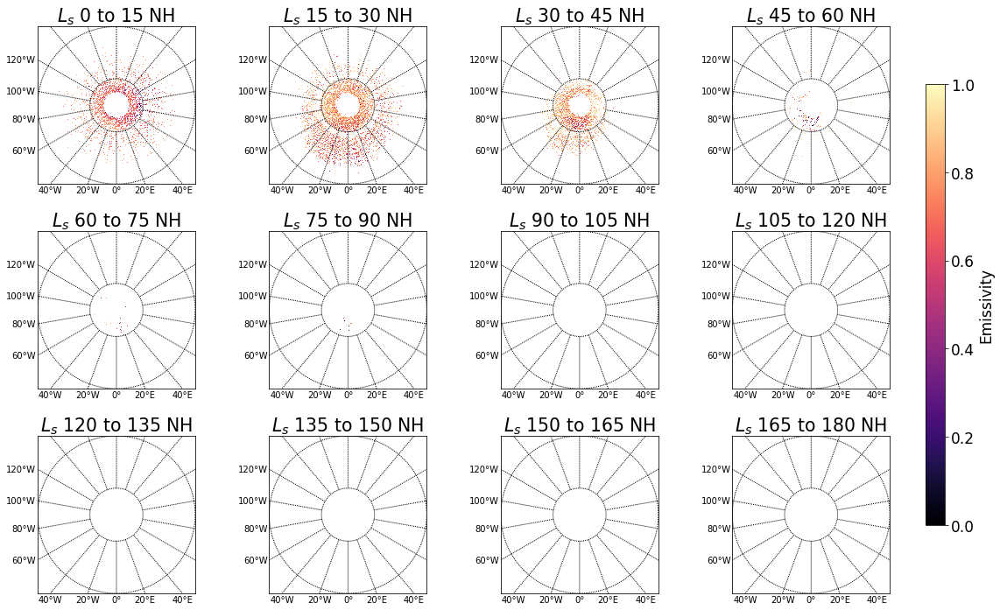

In [107]:
#
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (15,10))
plt.rcParams.update({'font.size': 17})
plt.sca(axes[0,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR0,NFPT0), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 0 to 15 NH')
plt.sca(axes[0,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR1,NFPT1), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 15 to 30 NH')
plt.sca(axes[0,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR2,NFPT2), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 30 to 45 NH')
plt.sca(axes[0,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR3,NFPT3), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 45 to 60 NH')
plt.sca(axes[1,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR4,NFPT4), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 60 to 75 NH')
plt.sca(axes[1,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR5,NFPT5), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 75 to 90 NH')
plt.sca(axes[1,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
x,y = m(np.array(Alb32S[1][12]),np.array(Alb32S[0][12]))
m.scatter(x,y,c=np.array(Alb32S[2][12]), cmap='magma', s= 0.05)
plt.title('${L_s}$ 90 to 105 NH')
plt.sca(axes[1,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
x,y = m(np.array(Alb32S[1][12]),np.array(Alb32S[0][12]))
m.scatter(x,y,c=np.array(Alb32S[2][12]), cmap='magma', s= 0.05)
plt.title('${L_s}$ 105 to 120 NH')
plt.sca(axes[2,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
x,y = m(np.array(Alb32S[1][12]),np.array(Alb32S[0][12]))
m.scatter(x,y,c=np.array(Alb32S[2][12]), cmap='magma', s= 0.05)
plt.title('${L_s}$ 120 to 135 NH')
plt.sca(axes[2,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
x,y = m(np.array(Alb32S[1][12]),np.array(Alb32S[0][12]))
m.scatter(x,y,c=np.array(Alb32S[2][12]), cmap='magma', s= 0.05)
plt.title('${L_s}$ 135 to 150 NH')
plt.sca(axes[2,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
x,y = m(np.array(Alb32S[1][12]),np.array(Alb32S[0][12]))
m.scatter(x,y,c=np.array(Alb32S[2][12]), cmap='magma', s= 0.05)
plt.title('${L_s}$ 150 to 165 NH')
plt.sca(axes[2,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
x,y = m(np.array(Alb32S[1][12]),np.array(Alb32S[0][12]))
m.scatter(x,y,c=np.array(Alb32S[2][12]), cmap='magma', s= 0.05)
plt.title('${L_s}$ 165 to 180 NH')
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Emissivity')
plt.show()

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in true_divide
  
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.c

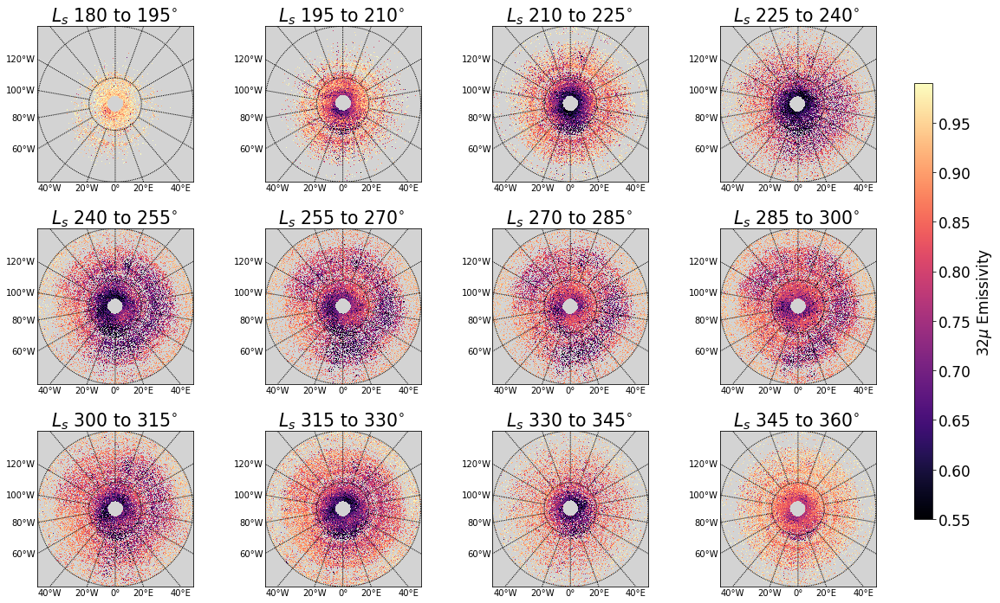

In [108]:
#
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (15,10))
plt.rcParams.update({'font.size': 17})
fig.patch.set_alpha(0.0)
axes[0,0].set_facecolor('lightgrey')
axes[0,1].set_facecolor('lightgrey')
axes[0,2].set_facecolor('lightgrey')
axes[0,3].set_facecolor('lightgrey')
axes[1,0].set_facecolor('lightgrey')
axes[1,1].set_facecolor('lightgrey')
axes[1,2].set_facecolor('lightgrey')
axes[1,3].set_facecolor('lightgrey')
axes[2,0].set_facecolor('lightgrey')
axes[2,1].set_facecolor('lightgrey')
axes[2,2].set_facecolor('lightgrey')
axes[2,3].set_facecolor('lightgrey')
plt.sca(axes[0,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR12,NFPT12), origin='upper', cmap = 'magma')
plt.clim(.55,.99)
plt.title('${L_s}$ 180 to 195$^{\circ}$ ')
plt.sca(axes[0,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR13,NFPT13), origin='upper', cmap = 'magma')
plt.clim(.55,.99)
plt.title('${L_s}$ 195 to 210$^{\circ}$ ')
plt.sca(axes[0,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR14,NFPT14), origin='upper', cmap = 'magma')
plt.clim(.55,.99)
plt.title('${L_s}$ 210 to 225$^{\circ}$ ')
plt.sca(axes[0,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR15,NFPT15), origin='upper', cmap = 'magma')
plt.clim(.55,.99)
plt.title('${L_s}$ 225 to 240$^{\circ}$ ')
plt.sca(axes[1,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR16,NFPT16), origin='upper', cmap = 'magma')
plt.clim(.55,.99)
plt.title('${L_s}$ 240 to 255$^{\circ}$ ')
plt.sca(axes[1,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR17,NFPT17), origin='upper', cmap = 'magma')
plt.clim(.55,.99)
plt.title('${L_s}$ 255 to 270$^{\circ}$ ')
plt.sca(axes[1,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR18,NFPT18), origin='upper', cmap = 'magma')
plt.clim(.55,.99)
plt.title('${L_s}$ 270 to 285$^{\circ}$ ')
plt.sca(axes[1,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR19,NFPT19), origin='upper', cmap = 'magma')
plt.clim(.55,.99)
plt.title('${L_s}$ 285 to 300$^{\circ}$ ')
plt.sca(axes[2,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR20,NFPT20), origin='upper', cmap = 'magma')
plt.clim(.55,.99)
plt.title('${L_s}$ 300 to 315$^{\circ}$ ')
plt.sca(axes[2,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR21,NFPT21), origin='upper', cmap = 'magma')
plt.clim(.55,.99)
plt.title('${L_s}$ 315 to 330$^{\circ}$ ')
plt.sca(axes[2,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR22,NFPT22), origin='upper', cmap = 'magma')
plt.clim(.55,.99)
plt.title('${L_s}$ 330 to 345$^{\circ}$ ')
plt.sca(axes[2,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR23,NFPT23), origin='upper', cmap = 'magma')
plt.clim(.55,.99)
plt.title('${L_s}$ 345 to 360$^{\circ}$ ')
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('32$\mu$ Emissivity')
plt.savefig('NEmi.png', dpi= 300, facecolor=fig.get_facecolor(), bbox_inches = 'tight')
plt.show()

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in true_divide
  
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.c

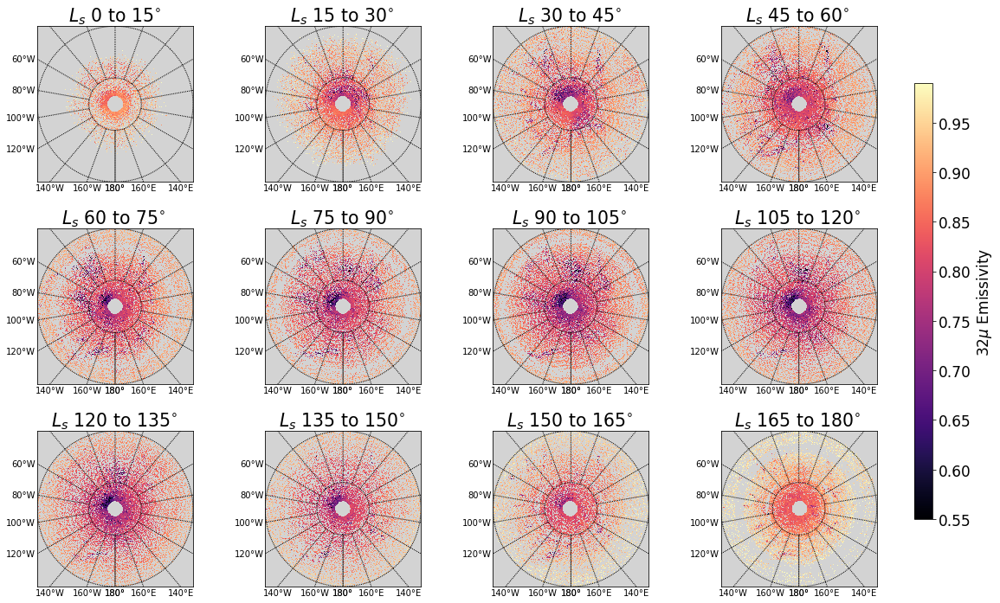

In [109]:
#
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (15,10))
plt.rcParams.update({'font.size': 17})
fig.patch.set_alpha(0.0)
axes[0,0].set_facecolor('lightgrey')
axes[0,1].set_facecolor('lightgrey')
axes[0,2].set_facecolor('lightgrey')
axes[0,3].set_facecolor('lightgrey')
axes[1,0].set_facecolor('lightgrey')
axes[1,1].set_facecolor('lightgrey')
axes[1,2].set_facecolor('lightgrey')
axes[1,3].set_facecolor('lightgrey')
axes[2,0].set_facecolor('lightgrey')
axes[2,1].set_facecolor('lightgrey')
axes[2,2].set_facecolor('lightgrey')
axes[2,3].set_facecolor('lightgrey')
plt.sca(axes[0,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR0,SFPT0), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.clim(.55,.99)
plt.title('${L_s}$ 0 to 15$^{\circ}$')
plt.sca(axes[0,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR1,SFPT1), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.clim(.55,.99)
plt.title('${L_s}$ 15 to 30$^{\circ}$ ')
plt.sca(axes[0,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR2,SFPT2), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.clim(.55,.99)
plt.title('${L_s}$ 30 to 45$^{\circ}$ ')
plt.sca(axes[0,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR3,SFPT3), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.clim(.55,.99)
plt.title('${L_s}$ 45 to 60$^{\circ}$ ')
plt.sca(axes[1,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR4,SFPT4), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.clim(.55,.99)
plt.title('${L_s}$ 60 to 75$^{\circ}$ ')
plt.sca(axes[1,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR5,SFPT5), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.clim(.55,.99)
plt.title('${L_s}$ 75 to 90$^{\circ}$ ')
plt.sca(axes[1,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR6,SFPT6), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.clim(.55,.99)
plt.title('${L_s}$ 90 to 105$^{\circ}$ ')
plt.sca(axes[1,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR7,SFPT7), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.clim(.55,.99)
plt.title('${L_s}$ 105 to 120$^{\circ}$ ')
plt.sca(axes[2,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR8,SFPT8), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.clim(.55,.99)
plt.title('${L_s}$ 120 to 135$^{\circ}$ ')
plt.sca(axes[2,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR9,SFPT9), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.clim(.55,.99)
plt.title('${L_s}$ 135 to 150$^{\circ}$ ')
plt.sca(axes[2,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR10,SFPT10), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.clim(.55,.99)
plt.title('${L_s}$ 150 to 165$^{\circ}$ ')
plt.sca(axes[2,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR11,SFPT11), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.clim(.55,.99)
plt.title('${L_s}$ 165 to 180$^{\circ}$ ')
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('32$\mu$ Emissivity')
plt.savefig('SEmi.png', dpi= 300, facecolor=fig.get_facecolor(), bbox_inches = 'tight')
plt.show()

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  """
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in true_divide
  
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use insp

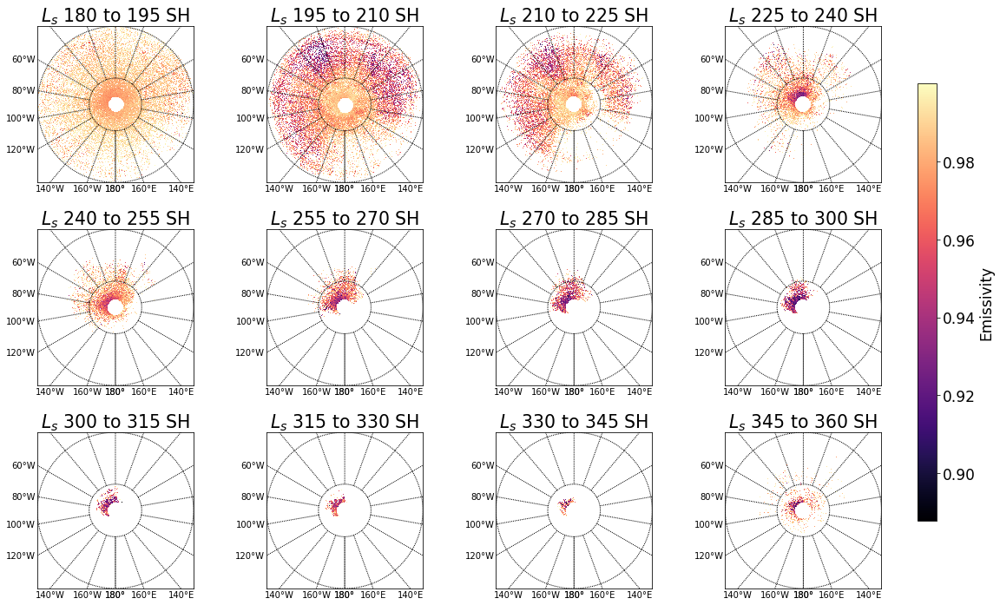

In [110]:
#
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (15,10))
plt.rcParams.update({'font.size': 17})
plt.sca(axes[0,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR12,SFPT12), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 180 to 195 SH')
plt.sca(axes[0,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR13,SFPT13), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 195 to 210 SH')
plt.sca(axes[0,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR14,SFPT14), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 210 to 225 SH')
plt.sca(axes[0,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR15,SFPT15), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 225 to 240 SH')
plt.sca(axes[1,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR16,SFPT16), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 240 to 255 SH')
plt.sca(axes[1,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR17,SFPT17), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 255 to 270 SH')
plt.sca(axes[1,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR18,SFPT18), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 270 to 285 SH')
plt.sca(axes[1,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR19,SFPT19), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 285 to 300 SH')
plt.sca(axes[2,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR20,SFPT20), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 300 to 315 SH')
plt.sca(axes[2,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR21,SFPT21), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 315 to 330 SH')
plt.sca(axes[2,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR22,SFPT22), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 330 to 345 SH')
plt.sca(axes[2,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR23,SFPT23), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 345 to 360 SH')
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Emissivity') 
plt.show()

In [111]:
n15 = np.float(np.count_nonzero(~np.isnan(emi(NIR0,NFPT0))))
n30 = np.float(np.count_nonzero(~np.isnan(emi(NIR1,NFPT1))))
n45 = np.float(np.count_nonzero(~np.isnan(emi(NIR2,NFPT2))))
n60 = np.float(np.count_nonzero(~np.isnan(emi(NIR3,NFPT3))))
n75 = np.float(np.count_nonzero(~np.isnan(emi(NIR4,NFPT4))))
n90 = np.float(np.count_nonzero(~np.isnan(emi(NIR5,NFPT5))))
n105 = np.float(0)
n120 = np.float(0)
n135 = np.float(0) 
n150 = np.float(0)
n165 = np.float(0)
n180 = np.float(0)
s195 = np.count_nonzero(~np.isnan(emi(SIR12,SFPT12)))
s210 = np.count_nonzero(~np.isnan(emi(SIR13,SFPT13)))
s225 = np.count_nonzero(~np.isnan(emi(SIR14,SFPT14)))
s240 = np.count_nonzero(~np.isnan(emi(SIR15,SFPT15)))
s255 = np.count_nonzero(~np.isnan(emi(SIR16,SFPT16)))
s270 = np.count_nonzero(~np.isnan(emi(SIR17,SFPT17)))
s285 = np.count_nonzero(~np.isnan(emi(SIR18,SFPT18)))
s300 = np.count_nonzero(~np.isnan(emi(SIR19,SFPT19)))
s315 = np.count_nonzero(~np.isnan(emi(SIR20,SFPT20)))
s330 = np.count_nonzero(~np.isnan(emi(SIR21,SFPT21)))
s345 = np.count_nonzero(~np.isnan(emi(SIR22,SFPT22)))
s360 = np.count_nonzero(~np.isnan(emi(SIR23,SFPT23)))
sdata = [s195,s210,s225,s240,s255,s270,s285,s300,s315,s330,s345,s360]
ndata = [n15,n30,n45,n60,n75,n90,0,0,0,0,0,0]
nod = np.array([0.06,0.09,0.11,0.12,0.13,0.14,0,0,0,0,0,0])
sod = np.array([0.06,0.12,0.18,0.24,0.30,0.33,0.30,0.21,0.12,0.24,0.15,0.12])
noh = np.array([0.1,0.05,0.05,0.04,0.06,0.01,0,0,0,0,0,0])
soh = np.array([0.1,0.08,0.02,0.05,0.07,0.05,0.04,0.04,0.06,0.09,0.07,0.09])

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in true_divide
  
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.


In [112]:
np.sum(ndata*nod)/np.sum(ndata)

0.08836199430904368

In [113]:
np.sum(sdata*sod)/np.sum(sdata)

0.14443541818941213

In [114]:
np.sum(ndata*noh)/np.sum(ndata)

0.06208338488185081

In [115]:
np.sum(sdata*soh)/np.sum(sdata)

0.06930145139396471

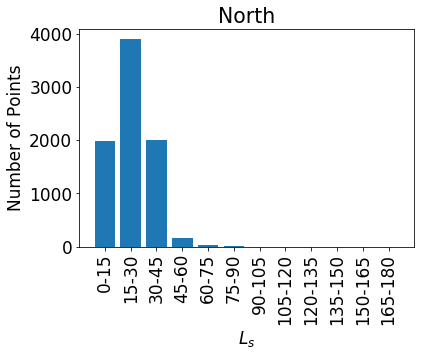

In [116]:
ndate = ['0-15','15-30','30-45','45-60','60-75','75-90','90-105','105-120','120-135','135-150','150-165','165-180']
ax = plt.gca()
plt.bar(ndate, ndata)
plt.ylabel('Number of Points')
plt.xlabel('$L_s$')
plt.title('North')
plt.setp(ax.get_xticklabels(), rotation=90, horizontalalignment='center')
plt.savefig('Nco2pointcount.png', dpi= 300, facecolor=fig.get_facecolor(), bbox_inches = 'tight');

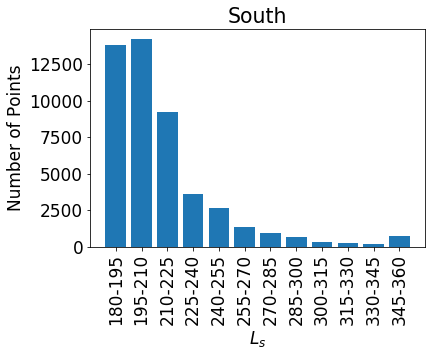

In [117]:
sdate = ['180-195','195-210','210-225','225-240','240-255','255-270','270-285','285-300','300-315','315-330','330-345','345-360']
ax = plt.gca()
plt.bar(sdate, sdata)
plt.ylabel('Number of Points')
plt.xlabel('$L_s$')
plt.title('South')
plt.setp(ax.get_xticklabels(), rotation=90, horizontalalignment='center')
plt.savefig('Sco2pointcount.png', dpi= 300, facecolor=fig.get_facecolor(), bbox_inches = 'tight');

In [118]:
EmiWinN180 = emi(NIR12,NFPT12)
EmiWinN195 = emi(NIR13,NFPT13)
EmiWinN210 = emi(NIR14,NFPT14)
EmiWinN225 = emi(NIR15,NFPT15)
EmiWinN240 = emi(NIR16,NFPT16)
EmiWinN255 = emi(NIR17,NFPT17)
EmiWinN270 = emi(NIR18,NFPT18)
EmiWinN285 = emi(NIR19,NFPT19)
EmiWinN300 = emi(NIR20,NFPT20)
EmiWinN315 = emi(NIR21,NFPT21)
EmiWinN330 = emi(NIR22,NFPT22)
EmiWinN345 = emi(NIR23,NFPT23) 

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in true_divide
  
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.


In [119]:
EmiSumS180 = emi(SIR12,SFPT12)
EmiSumS195 = emi(SIR13,SFPT13)
EmiSumS210 = emi(SIR14,SFPT14)
EmiSumS225 = emi(SIR15,SFPT15)
EmiSumS240 = emi(SIR16,SFPT16)
EmiSumS255 = emi(SIR17,SFPT17)
EmiSumS270 = emi(SIR18,SFPT18)
EmiSumS285 = emi(SIR19,SFPT19)
EmiSumS300 = emi(SIR20,SFPT20)
EmiSumS315 = emi(SIR21,SFPT21)
EmiSumS330 = emi(SIR22,SFPT22)
EmiSumS345 = emi(SIR23,SFPT23) 

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in true_divide
  
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.


In [120]:
EmiWinN180 =   EmiWinN180.flatten()
EmiWinN195 =   EmiWinN195.flatten()
EmiWinN210 =   EmiWinN210.flatten()
EmiWinN225 =   EmiWinN225.flatten()
EmiWinN240 =   EmiWinN240.flatten()
EmiWinN255 =   EmiWinN255.flatten()
EmiWinN270 =   EmiWinN270.flatten()
EmiWinN285 =   EmiWinN285.flatten()
EmiWinN300 =   EmiWinN300.flatten()
EmiWinN315 =   EmiWinN315.flatten()
EmiWinN330 =   EmiWinN330.flatten()
EmiWinN345 =   EmiWinN345.flatten()

In [121]:
EmiWinN = np.concatenate((EmiWinN180[np.logical_not(np.isnan(EmiWinN180))],
                          EmiWinN195[np.logical_not(np.isnan(EmiWinN195))],
                          EmiWinN210[np.logical_not(np.isnan(EmiWinN210))],
                          EmiWinN225[np.logical_not(np.isnan(EmiWinN225))],
                          EmiWinN240[np.logical_not(np.isnan(EmiWinN240))],
                          EmiWinN255[np.logical_not(np.isnan(EmiWinN255))],
                          EmiWinN270[np.logical_not(np.isnan(EmiWinN270))],
                          EmiWinN285[np.logical_not(np.isnan(EmiWinN285))],
                          EmiWinN300[np.logical_not(np.isnan(EmiWinN300))],
                          EmiWinN315[np.logical_not(np.isnan(EmiWinN315))],
                          EmiWinN330[np.logical_not(np.isnan(EmiWinN330))],
                          EmiWinN345[np.logical_not(np.isnan(EmiWinN345))]
                          ))

In [122]:
EmiSumN0 =  emi(NIR0,NFPT0)
EmiSumN15 = emi(NIR1,NFPT1)
EmiSumN30 = emi(NIR2,NFPT2)
EmiSumN45 = emi(NIR3,NFPT3)
EmiSumN60 = emi(NIR4,NFPT4)
EmiSumN75 = emi(NIR5,NFPT5)

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in true_divide
  
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.


In [123]:
EmiSumN0 =   EmiSumN0.flatten()
EmiSumN15 =   EmiSumN15.flatten()
EmiSumN30 =   EmiSumN30.flatten()
EmiSumN45 =   EmiSumN45.flatten()
EmiSumN60 =   EmiSumN60.flatten()
EmiSumN75 =   EmiSumN75.flatten()

In [124]:
EmiSumN = np.concatenate((EmiSumN0[np.logical_not(np.isnan(EmiSumN0))],
                          EmiSumN15[np.logical_not(np.isnan(EmiSumN15))],
                          EmiSumN30[np.logical_not(np.isnan(EmiSumN30))],
                          EmiSumN45[np.logical_not(np.isnan(EmiSumN45))],
                          EmiSumN60[np.logical_not(np.isnan(EmiSumN60))],
                          EmiSumN75[np.logical_not(np.isnan(EmiSumN75))]
                          ))

In [125]:
EmiSumS180 =   EmiSumS180.flatten()
EmiSumS195 =   EmiSumS195.flatten()
EmiSumS210 =   EmiSumS210.flatten()
EmiSumS225 =   EmiSumS225.flatten()
EmiSumS240 =   EmiSumS240.flatten()
EmiSumS255 =   EmiSumS255.flatten()
EmiSumS270 =   EmiSumS270.flatten()
EmiSumS285 =   EmiSumS285.flatten()
EmiSumS300 =   EmiSumS300.flatten()
EmiSumS315 =   EmiSumS315.flatten()
EmiSumS330 =   EmiSumS330.flatten()
EmiSumS345 =   EmiSumS345.flatten()

In [126]:
EmiSumS = np.concatenate((EmiSumS180[np.logical_not(np.isnan(EmiSumS180))],
                          EmiSumS195[np.logical_not(np.isnan(EmiSumS195))],
                          EmiSumS210[np.logical_not(np.isnan(EmiSumS210))],
                          EmiSumS225[np.logical_not(np.isnan(EmiSumS225))],
                          EmiSumS240[np.logical_not(np.isnan(EmiSumS240))],
                          EmiSumS255[np.logical_not(np.isnan(EmiSumS255))],
                          EmiSumS270[np.logical_not(np.isnan(EmiSumS270))],
                          EmiSumS285[np.logical_not(np.isnan(EmiSumS285))],
                          EmiSumS300[np.logical_not(np.isnan(EmiSumS300))],
                          EmiSumS315[np.logical_not(np.isnan(EmiSumS315))],
                          EmiSumS330[np.logical_not(np.isnan(EmiSumS330))],
                          EmiSumS345[np.logical_not(np.isnan(EmiSumS345))]
                          ))

In [127]:
EmiWinN180 = emi(NIR12,NFPT12)
EmiWinN195 = emi(NIR13,NFPT13)
EmiWinN210 = emi(NIR14,NFPT14)
EmiWinN225 = emi(NIR15,NFPT15)
EmiWinN240 = emi(NIR16,NFPT16)
EmiWinN255 = emi(NIR17,NFPT17)
EmiWinN270 = emi(NIR18,NFPT18)
EmiWinN285 = emi(NIR19,NFPT19)
EmiWinN300 = emi(NIR20,NFPT20)
EmiWinN315 = emi(NIR21,NFPT21)
EmiWinN330 = emi(NIR22,NFPT22)
EmiWinN345 = emi(NIR23,NFPT23) 

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in true_divide
  
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.


In [128]:
EmiWinN180 =   EmiWinN180.flatten()
EmiWinN195 =   EmiWinN195.flatten()
EmiWinN210 =   EmiWinN210.flatten()
EmiWinN225 =   EmiWinN225.flatten()
EmiWinN240 =   EmiWinN240.flatten()
EmiWinN255 =   EmiWinN255.flatten()
EmiWinN270 =   EmiWinN270.flatten()
EmiWinN285 =   EmiWinN285.flatten()
EmiWinN300 =   EmiWinN300.flatten()
EmiWinN315 =   EmiWinN315.flatten()
EmiWinN330 =   EmiWinN330.flatten()
EmiWinN345 =   EmiWinN345.flatten()

In [129]:
EmiWinN = np.concatenate((EmiWinN180[np.logical_not(np.isnan(EmiWinN180))],
                          EmiWinN195[np.logical_not(np.isnan(EmiWinN195))],
                          EmiWinN210[np.logical_not(np.isnan(EmiWinN210))],
                          EmiWinN225[np.logical_not(np.isnan(EmiWinN225))],
                          EmiWinN240[np.logical_not(np.isnan(EmiWinN240))],
                          EmiWinN255[np.logical_not(np.isnan(EmiWinN255))],
                          EmiWinN270[np.logical_not(np.isnan(EmiWinN270))],
                          EmiWinN285[np.logical_not(np.isnan(EmiWinN285))],
                          EmiWinN300[np.logical_not(np.isnan(EmiWinN300))],
                          EmiWinN315[np.logical_not(np.isnan(EmiWinN315))],
                          EmiWinN330[np.logical_not(np.isnan(EmiWinN330))],
                          EmiWinN345[np.logical_not(np.isnan(EmiWinN345))]
                          ))

In [130]:
EmiWinS0  = emi(SIR0,SFPT0)
EmiWinS15 = emi(SIR1,SFPT1)
EmiWinS30 = emi(SIR2,SFPT2)
EmiWinS45 = emi(SIR3,SFPT3)
EmiWinS60 = emi(SIR4,SFPT4)
EmiWinS75 = emi(SIR5,SFPT5)
EmiWinS90 = emi(SIR6,SFPT6)
EmiWinS105 = emi(SIR7,SFPT7)
EmiWinS120 = emi(SIR8,SFPT8)
EmiWinS135 = emi(SIR9,SFPT9)
EmiWinS150 = emi(SIR10,SFPT10)
EmiWinS165 = emi(SIR11,SFPT11)

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in true_divide
  
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.


In [131]:
EmiWinS0  = EmiWinS0.flatten()
EmiWinS15 = EmiWinS15.flatten() 
EmiWinS30 = EmiWinS30.flatten() 
EmiWinS45 = EmiWinS45.flatten() 
EmiWinS60 = EmiWinS60.flatten() 
EmiWinS75 = EmiWinS75.flatten() 
EmiWinS90 = EmiWinS90.flatten() 
EmiWinS105 = EmiWinS105.flatten() 
EmiWinS120 = EmiWinS120.flatten() 
EmiWinS135 = EmiWinS135.flatten() 
EmiWinS150 = EmiWinS150.flatten() 
EmiWinS165 = EmiWinS165.flatten()  

In [132]:
#
EmiWinS = np.concatenate((EmiWinS0[np.logical_not(np.isnan(EmiWinS0))],
                          EmiWinS15[np.logical_not(np.isnan(EmiWinS15))],
                          EmiWinS30[np.logical_not(np.isnan(EmiWinS30))],
                          EmiWinS45[np.logical_not(np.isnan(EmiWinS45))],
                          EmiWinS60[np.logical_not(np.isnan(EmiWinS60))],
                          EmiWinS75[np.logical_not(np.isnan(EmiWinS75))],
                          EmiWinS90[np.logical_not(np.isnan(EmiWinS90))],
                          EmiWinS105[np.logical_not(np.isnan(EmiWinS105))],
                          EmiWinS120[np.logical_not(np.isnan(EmiWinS120))],
                          EmiWinS135[np.logical_not(np.isnan(EmiWinS135))],
                          EmiWinS150[np.logical_not(np.isnan(EmiWinS150))],
                          EmiWinS165[np.logical_not(np.isnan(EmiWinS165))]
                          ))

In [133]:
NLS0 =  binreduce(emi(NIR0,NFPT0),medianstack(N29A,N31A,N32A,N33A))
NLS15 = binreduce(emi(NIR1,NFPT1),medianstack(N29B,N30B,N31B,N32B,N33B))
NLS30 = binreduce(emi(NIR2,NFPT2),medianstack(N29C,N30C,N31C,N32C,N33C))
NLS45 = binreduce(emi(NIR3,NFPT3),medianstack(N29D,N30D,N31D,N32D,N33D))
NLS60 = binreduce(emi(NIR4,NFPT4),medianstack(N29E,N30E,N31E,N32E,N33E))
NLS75 = binreduce(emi(NIR5,NFPT5),medianstack(N30F,N31F,N32F,N33F))   

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in true_divide
  
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.


In [134]:
NLS0A = np.array(NLS0[0])
NLS0B = np.array(NLS0[1])
NLS15A = np.array(NLS15[0])
NLS15B = np.array(NLS15[1])
NLS30A = np.array(NLS30[0])
NLS30B = np.array(NLS30[1])
NLS45A = np.array(NLS45[0])
NLS45B = np.array(NLS45[1])
NLS60A = np.array(NLS60[0])
NLS60B = np.array(NLS60[1])
NLS75A = np.array(NLS75[0])
NLS75B = np.array(NLS75[1])

In [135]:
NLS0A = NLS0A.flatten()
NLS0B = NLS0B.flatten()
NLS15A = NLS15A.flatten()
NLS15B = NLS15B.flatten()
NLS30A = NLS30A.flatten()
NLS30B = NLS30B.flatten()
NLS45A = NLS45A.flatten()
NLS45B = NLS45B.flatten()
NLS60A = NLS60A.flatten()
NLS60B = NLS60B.flatten()
NLS75A = NLS75A.flatten()
NLS75B = NLS75B.flatten()

In [136]:
NLS0A = NLS0A[np.logical_not(np.isnan(NLS0A))]
NLS0B = NLS0B[np.logical_not(np.isnan(NLS0B))]
NLS15A = NLS15A[np.logical_not(np.isnan(NLS15A))]
NLS15B = NLS15B[np.logical_not(np.isnan(NLS15B))]
NLS30A = NLS30A[np.logical_not(np.isnan(NLS30A))]
NLS30B = NLS30B[np.logical_not(np.isnan(NLS30B))]
NLS45A = NLS45A[np.logical_not(np.isnan(NLS45A))]
NLS45B = NLS45B[np.logical_not(np.isnan(NLS45B))]
NLS60A = NLS60A[np.logical_not(np.isnan(NLS60A))]
NLS60B = NLS60B[np.logical_not(np.isnan(NLS60B))]
NLS75A = NLS75A[np.logical_not(np.isnan(NLS75A))]
NLS75B = NLS75B[np.logical_not(np.isnan(NLS75B))]

In [137]:
N0 = np.concatenate((NLS0A,NLS15A,NLS30A,NLS45A,NLS60A,NLS75A))
N1 = np.concatenate((NLS0B,NLS15B,NLS30B,NLS45B,NLS60B,NLS75B))

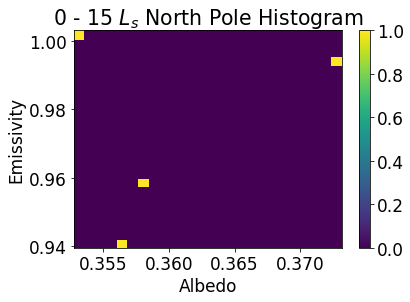

In [138]:
plt.hist2d(NLS0B,NLS0A, bins =[25,25])
plt.title('0 - 15 $L_s$ North Pole Histogram')
plt.xlabel('Albedo')
plt.ylabel('Emissivity')
plt.colorbar()
plt.show()

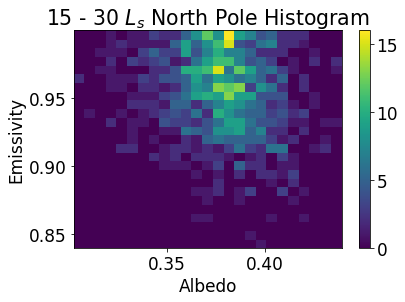

In [139]:
plt.hist2d(NLS15B,NLS15A, bins =[25,25])
plt.title('15 - 30 $L_s$ North Pole Histogram')
plt.xlabel('Albedo')
plt.ylabel('Emissivity')
plt.colorbar()
plt.show()

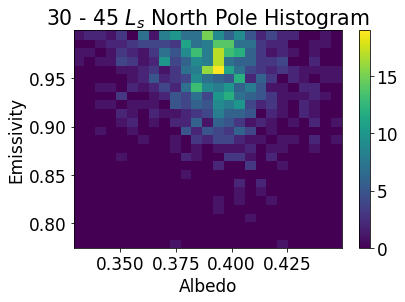

In [140]:
plt.hist2d(NLS30B,NLS30A, bins =[25,25])
plt.title('30 - 45 $L_s$ North Pole Histogram')
plt.xlabel('Albedo')
plt.ylabel('Emissivity')
plt.colorbar()
plt.show()

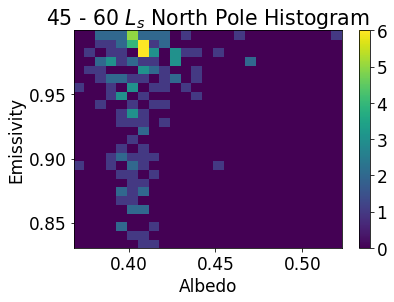

In [141]:
plt.hist2d(NLS45B,NLS45A, bins =[25,25])
plt.title('45 - 60 $L_s$ North Pole Histogram')
plt.xlabel('Albedo')
plt.ylabel('Emissivity')
plt.colorbar()
plt.show()

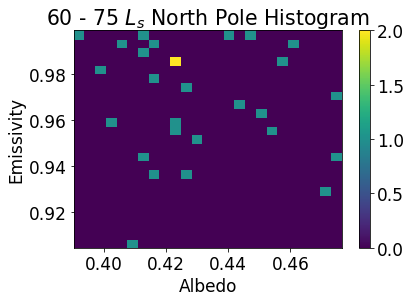

In [142]:
plt.hist2d(NLS60B,NLS60A, bins =[25,25])
plt.title('60 - 75 $L_s$ North Pole Histogram')
plt.xlabel('Albedo')
plt.ylabel('Emissivity')
plt.colorbar()
plt.show()

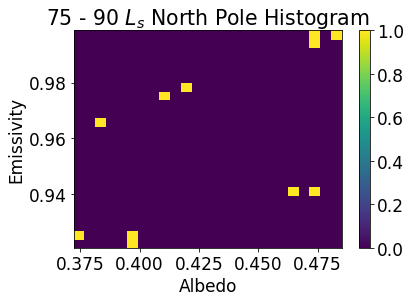

In [143]:
plt.hist2d(NLS75B,NLS75A, bins =[25,25])
plt.title('75 - 90 $L_s$ North Pole Histogram')
plt.xlabel('Albedo')
plt.ylabel('Emissivity')
plt.colorbar()
plt.show()

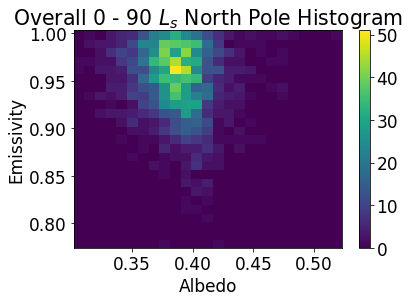

In [144]:
plt.hist2d(N1,N0, bins =[25,25])
plt.title('Overall 0 - 90 $L_s$ North Pole Histogram')
plt.xlabel('Albedo')
plt.ylabel('Emissivity')
plt.colorbar()
plt.show()

In [145]:
SLS210 = binreduce(emi(SIR14,SFPT14), medianstack(S29C,S30C,S31C,S33C))
SLS225 = binreduce(emi(SIR15,SFPT15), medianstack(S29D,S30D,S31D,S33D))
SLS240 = binreduce(emi(SIR16,SFPT16), medianstack(S29E,S30E,S31E,S33E))
SLS255 = binreduce(emi(SIR17,SFPT17), medianstack(S29F,S30F,S31F,S33F))
SLS270 = binreduce(emi(SIR18,SFPT18), medianstack(S29G,S30G,S31G,S33G))
SLS285 = binreduce(emi(SIR19,SFPT19), medianstack(S29H,S30H,S31H,S33H))
SLS300 = binreduce(emi(SIR20,SFPT20), medianstack(S29I,S30I,S31I,S33I))
SLS315 = binreduce(emi(SIR21,SFPT21), medianstack(S29J,S30J,S31J,S33J))
SLS330 = binreduce(emi(SIR22,SFPT22), medianstack(S30K,S31K,S33K))                   

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in true_divide
  
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.


In [146]:
SLS210A = np.array(SLS210[0])
SLS210B = np.array(SLS210[1])
SLS225A = np.array(SLS225[0])
SLS225B = np.array(SLS225[1])
SLS240A = np.array(SLS240[0])
SLS240B = np.array(SLS240[1])
SLS255A = np.array(SLS255[0])
SLS255B = np.array(SLS255[1])
SLS270A = np.array(SLS270[0])
SLS270B = np.array(SLS270[1])
SLS285A = np.array(SLS285[0])
SLS285B = np.array(SLS285[1])
SLS300A = np.array(SLS300[0])
SLS300B = np.array(SLS300[1])
SLS315A = np.array(SLS315[0])
SLS315B = np.array(SLS315[1])
SLS330A = np.array(SLS330[0])
SLS330B = np.array(SLS330[1])

In [147]:
SLS210A = SLS210A.flatten()
SLS210B = SLS210B.flatten()
SLS225A = SLS225A.flatten()
SLS225B = SLS225B.flatten()
SLS240A = SLS240A.flatten()
SLS240B = SLS240B.flatten()
SLS255A = SLS255A.flatten()
SLS255B = SLS255B.flatten()
SLS270A = SLS270A.flatten()
SLS270B = SLS270B.flatten()
SLS285A = SLS285A.flatten()
SLS285B = SLS285B.flatten()
SLS300A = SLS300A.flatten()
SLS300B = SLS300B.flatten()
SLS315A = SLS315A.flatten()
SLS315B = SLS315B.flatten()
SLS330A = SLS330A.flatten()
SLS330B = SLS330B.flatten() 

In [148]:
SLS210A = SLS210A[np.logical_not(np.isnan(SLS210A))]
SLS210B = SLS210B[np.logical_not(np.isnan(SLS210B))]
SLS225A = SLS225A[np.logical_not(np.isnan(SLS225A))]
SLS225B = SLS225B[np.logical_not(np.isnan(SLS225B))]
SLS240A = SLS240A[np.logical_not(np.isnan(SLS240A))]
SLS240B = SLS240B[np.logical_not(np.isnan(SLS240B))]
SLS255A = SLS255A[np.logical_not(np.isnan(SLS255A))]
SLS255B = SLS255B[np.logical_not(np.isnan(SLS255B))]
SLS270A = SLS270A[np.logical_not(np.isnan(SLS270A))]
SLS270B = SLS270B[np.logical_not(np.isnan(SLS270B))]
SLS285A = SLS285A[np.logical_not(np.isnan(SLS285A))]
SLS285B = SLS285B[np.logical_not(np.isnan(SLS285B))]
SLS300A = SLS300A[np.logical_not(np.isnan(SLS300A))]
SLS300B = SLS300B[np.logical_not(np.isnan(SLS300B))]
SLS315A = SLS315A[np.logical_not(np.isnan(SLS315A))]
SLS315B = SLS315B[np.logical_not(np.isnan(SLS315B))]
SLS330A = SLS330A[np.logical_not(np.isnan(SLS330A))]
SLS330B = SLS330B[np.logical_not(np.isnan(SLS330B))]

In [149]:
S0 = np.concatenate((SLS210A,SLS225A,SLS240A,SLS255A,SLS270A,SLS285A,SLS300A,SLS315A,SLS330A))
S1 = np.concatenate((SLS210B,SLS225B,SLS240B,SLS255B,SLS270B,SLS285B,SLS300B,SLS315B,SLS330B))

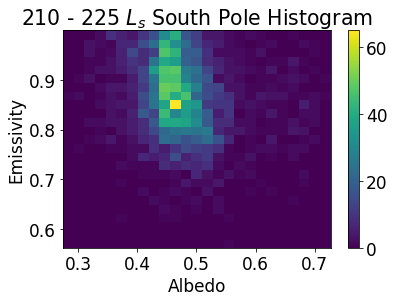

In [150]:
plt.hist2d(SLS210B,SLS210A, bins =[25,25])
plt.title('210 - 225 $L_s$ South Pole Histogram')
plt.xlabel('Albedo')
plt.ylabel('Emissivity')
plt.colorbar()
plt.show()

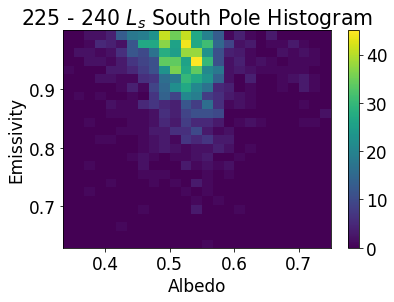

In [151]:
plt.hist2d(SLS225B,SLS225A, bins =[25,25])
plt.title('225 - 240 $L_s$ South Pole Histogram')
plt.xlabel('Albedo')
plt.ylabel('Emissivity')
plt.colorbar()
plt.show()

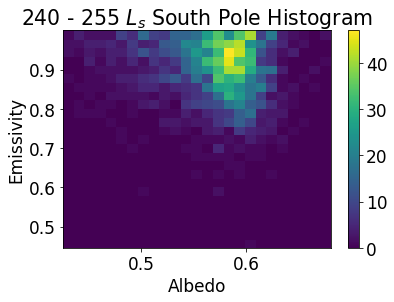

In [152]:
plt.hist2d(SLS240B,SLS240A, bins =[25,25])
plt.title('240 - 255 $L_s$ South Pole Histogram')
plt.xlabel('Albedo')
plt.ylabel('Emissivity')
plt.colorbar()
plt.show()

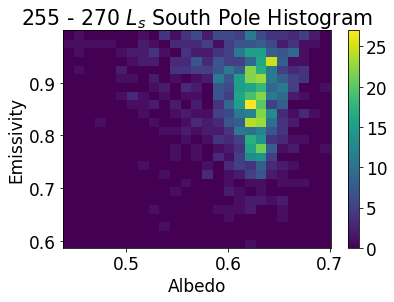

In [153]:
plt.hist2d(SLS255B,SLS255A, bins =[25,25])
plt.title('255 - 270 $L_s$ South Pole Histogram')
plt.xlabel('Albedo')
plt.ylabel('Emissivity')
plt.colorbar()
plt.show()

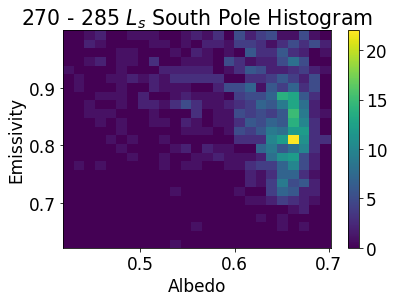

In [154]:
plt.hist2d(SLS270B,SLS270A, bins =[25,25])
plt.title('270 - 285 $L_s$ South Pole Histogram')
plt.xlabel('Albedo')
plt.ylabel('Emissivity')
plt.colorbar()
plt.show()

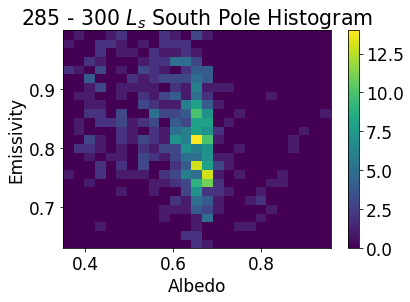

In [155]:
plt.hist2d(SLS285B,SLS285A, bins =[25,25])
plt.title('285 - 300 $L_s$ South Pole Histogram')
plt.xlabel('Albedo')
plt.ylabel('Emissivity')
plt.colorbar()
plt.show()

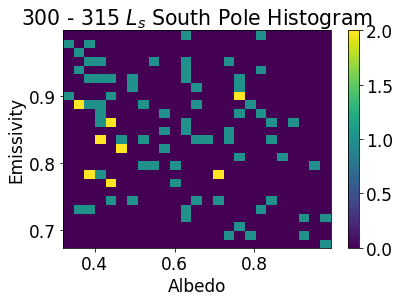

In [156]:
plt.hist2d(SLS300B,SLS300A, bins =[25,25])
plt.title('300 - 315 $L_s$ South Pole Histogram')
plt.xlabel('Albedo')
plt.ylabel('Emissivity')
plt.colorbar()
plt.show()

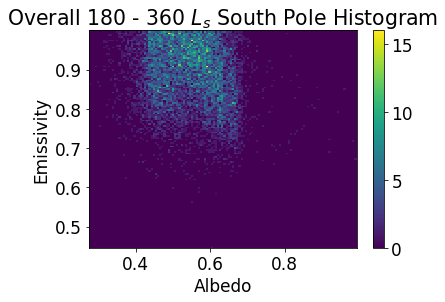

In [157]:
plt.hist2d(S1,S0, bins =[125,125])
plt.title('Overall 180 - 360 $L_s$ South Pole Histogram')
plt.xlabel('Albedo')
plt.ylabel('Emissivity')
plt.colorbar()
plt.show()

In [158]:
resolutions = 5
def adjustable_bins(Location ='South' , resolution=125):
    resolutions = resolution
    if Location == 'North':
        Location1 = N1
        Location0 = N0
        if resolution > 25:
            resolutions = 25
        LS1 = 0
        LS2 = 90
    if Location == 'South':
        Location1 = S1
        Location0 = S0
        LS1 = 180
        LS2 = 360
    plt.hist2d(Location1,Location0, bins =[resolutions,resolutions])
    plt.title('Overall {} - {} $L_s$ {} Pole Histogram'.format(LS1,LS2,Location))
    plt.xlabel('Albedo')
    plt.ylabel('Emissivity')
    plt.colorbar()
    plt.show()
interactive_plot = widgets.interactive(adjustable_bins, Location =['South', 'North'], resolution=(5,500,10))
interactive_plot

interactive(children=(Dropdown(description='Location', options=('South', 'North'), value='South'), IntSlider(v…

In [159]:
np.nanmean(medianstack(N29A,N31A,N33A))

0.3276006869685623

In [160]:
np.nanmean(medianstack(N29B,N30B,N31B,N33B))

0.3441031685772706

In [161]:
np.nanmean(medianstack(N29C,N30C,N31C,N33C))

0.3556940882816192

In [162]:
Ultimate_Albedo_North_3000 = meanstack(medianstack(N29A,N31A,N32A,N33A),medianstack(N29B,N30B,N31B,N32B,N33B),medianstack(N29C,N30C,N31C,N32C,N33C),
                                       medianstack(N29D,N30D,N31D,N32D,N33D),medianstack(N29E,N30E,N31E,N32E,N33E),medianstack(N30F,N31F,N32F,N33F),
                                       medianstack(N29G,N30G,N31G,N32G,N33G),medianstack(N29H,N30H,N31H,N32H,N33H),medianstack(N29I,N30I,N31I,N33I),
                                       medianstack(N29K,N30K,N31K,N33K))

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: Mean of empty slice
  import sys


In [163]:
np.nanmax(Ultimate_Albedo_North_3000)
#plt.clim(0.15,.28)
#plt.colorbar()

0.4943823205865097

In [164]:
np.nanmin(Ultimate_Albedo_North_3000)

0.17771536490668868

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  after removing the cwd from sys.path.


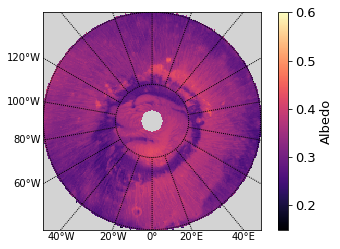

In [165]:
plt.rcParams.update({'font.size': 13})
ax = plt.gca()
ax.set_facecolor('lightgrey')
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(Ultimate_Albedo_North_3000, cmap = 'magma', origin ='upper', vmin = 0.0, vmax = 0.8)
#plt.title('Average North Summer Albedo')
cbar = plt.colorbar()
cbar.set_label('Albedo')
plt.clim(.15,.6)
plt.savefig('ANAlb.png', dpi= 300, facecolor=fig.get_facecolor(), bbox_inches = 'tight')
plt.show()

In [166]:
np.nanmean(Ultimate_Albedo_North_3000)

0.32984890940970735

In [167]:
Ultimate_Albedo_South_3000 = meanstack(medianstack(S29C,S30C,S31C,S32C,S33C),medianstack(S29D,S30D,S31D,S32D,S33D),
                                       medianstack(S29E,S30E,S31E,S32E,S33E),medianstack(S29F,S30F,S31F,S32F,S33F),medianstack(S29G,S30G,S31G,S32G,S33G),
                                       medianstack(S29H,S30H,S31H,S32H,S33H),medianstack(S29I,S30I,S31I,S33I),medianstack(S29J,S30J,S31J,S33J),
                                       medianstack(S30K,S31K,S33K))

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: Mean of empty slice
  import sys


/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  after removing the cwd from sys.path.


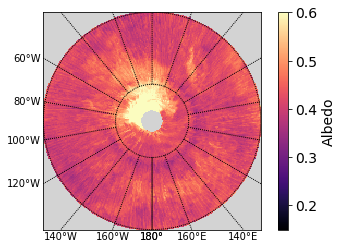

In [168]:
plt.rcParams.update({'font.size': 14})
ax = plt.gca()
ax.set_facecolor('lightgrey')
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(Ultimate_Albedo_South_3000, cmap ='magma', vmin = 0.0, vmax = 0.8)
#plt.title('Average South Summer Albedo')
plt.clim(.15,.6)
cbar = plt.colorbar()
cbar.set_label('Albedo')
plt.savefig('ASAlb.png', dpi= 300, facecolor=fig.get_facecolor(), bbox_inches = 'tight')
plt.show()

In [169]:
np.nanmin(Ultimate_Albedo_South_3000)

0.2810964998816954

In [170]:
np.nanmean(Ultimate_Albedo_South_3000)

0.43157240188730916

In [171]:
def adjustable_alb(Location = 'North', minval =0.0, maxval = 1.0):
    if Location == 'North':
        if minval > .30:
            minval = .30
        m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
        m.drawparallels(np.arange(0.,91.,20.))
        m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
        m.imshow(Ultimate_Albedo_North_3000, cmap = 'magma', origin ='upper', vmin=minval, vmax =maxval)
        plt.title('Albedo in the North $L_s$ 0 - 180')
        cbar = plt.colorbar()
        cbar.set_label('Albedo')
        plt.show()
    if Location == 'South':
        m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
        m.drawparallels(np.arange(-80.,-40.,20.))
        m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
        m.imshow(Ultimate_Albedo_South_3000, cmap ='magma', vmin = minval, vmax = maxval)
        plt.title('Albedo in the North $L_s$ 180 - 360')
        cbar = plt.colorbar()
        cbar.set_label('Albedo')
        plt.show()
interactive_plot = widgets.interactive(adjustable_alb, Location =['South', 'North'], minval=(0.0,1.0,0.05), maxval=(0.0,1.0,0.05))
interactive_plot

interactive(children=(Dropdown(description='Location', index=1, options=('South', 'North'), value='North'), Fl…

In [172]:
Ultimate_Emissivity_North_Winter_3000= meanstack(emi(NIR12,NFPT12),emi(NIR13,NFPT13),emi(NIR14,NFPT14),
                                                 emi(NIR15,NFPT15),emi(NIR16,NFPT16),emi(NIR17,NFPT17),
                                                 emi(NIR18,NFPT18),emi(NIR19,NFPT19),emi(NIR20,NFPT20),
                                                 emi(NIR21,NFPT21),emi(NIR22,NFPT22),emi(NIR23,NFPT23))

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in true_divide
  
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: Mean of empty slice
  import sys


In [173]:
Ultimate_Emissivity_North_Summer_3000= meanstack(emi(NIR0,NFPT0),emi(NIR1,NFPT1),emi(NIR2,NFPT2),
                                                 emi(NIR3,NFPT3),emi(NIR4,NFPT4),emi(NIR5,NFPT5))

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in true_divide
  
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: Mean of empty slice
  import sys


In [174]:
np.nanmax(Ultimate_Emissivity_North_Winter_3000)

0.9998451677521477

In [175]:
np.nanmin(Ultimate_Emissivity_North_Winter_3000)

0.41687326561428784

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  """


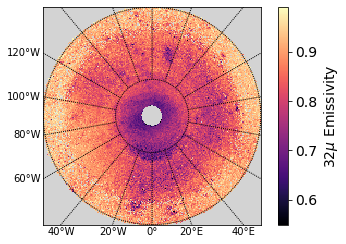

In [176]:
#
plt.rcParams.update({'font.size': 14})
ax = plt.gca()
ax.set_facecolor('lightgrey')
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(Ultimate_Emissivity_North_Winter_3000, cmap = 'magma', origin = 'upper')
plt.clim(.55,.99)
cbar = plt.colorbar()
cbar.set_label('32$\mu$ Emissivity')
plt.savefig('ANEmi.png', dpi= 300, facecolor=fig.get_facecolor(), bbox_inches = 'tight')
plt.show()

In [177]:
np.nanmean(Ultimate_Emissivity_North_Winter_3000)

0.8506907662107316

In [178]:
Ultimate_Emissivity_South_Winter_3000= meanstack(emi(SIR0,SFPT0),emi(SIR1,SFPT1),emi(SIR2,SFPT2),
                                                 emi(SIR3,SFPT3),emi(SIR4,SFPT4),emi(SIR5,SFPT5),
                                                 emi(SIR6,SFPT6),emi(SIR7,SFPT7),emi(SIR8,SFPT8),
                                                 emi(SIR9,SFPT9),emi(SIR10,SFPT10),emi(SIR11,SFPT11))

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in true_divide
  
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: Mean of empty slice
  import sys


In [179]:
Ultimate_Emissivity_South_Summer_3000= meanstack(emi(SIR12,SFPT12),emi(SIR13,SFPT13),emi(SIR14,SFPT14),
                                                 emi(SIR15,SFPT15),emi(SIR16,SFPT16),emi(SIR17,SFPT17),
                                                 emi(SIR19,SFPT19),emi(SIR20,SFPT20),emi(SIR21,SFPT21),
                                                 emi(SIR22,SFPT22),emi(SIR23,SFPT23))

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in true_divide
  
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: Mean of empty slice
  import sys


In [180]:
Ultsouth = binreduce(Ultimate_Emissivity_South_Summer_3000,Ultimate_Albedo_South_3000)
Ultnorth = binreduce(Ultimate_Emissivity_North_Summer_3000,Ultimate_Albedo_North_3000)

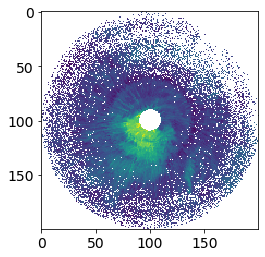

In [181]:
plt.imshow(Ultsouth[1])

In [182]:
np.nanmax(Ultimate_Emissivity_South_Winter_3000)

0.9998778382751266

In [183]:
np.nanmin(Ultimate_Emissivity_South_Winter_3000)

0.5332671962417885

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  """


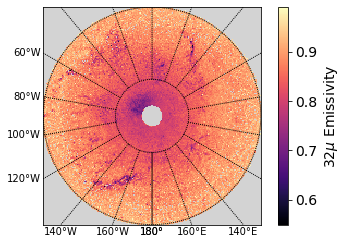

In [184]:
#
plt.rcParams.update({'font.size': 14})
ax = plt.gca()
ax.set_facecolor('lightgrey')
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(Ultimate_Emissivity_South_Winter_3000, cmap ='magma', origin ='lower')
cbar = plt.colorbar()
plt.clim(.55,.99)
cbar.set_label('32$\mu$ Emissivity')
plt.savefig('ASEmi.png', dpi= 300, facecolor=fig.get_facecolor(), bbox_inches = 'tight')
plt.show()

In [185]:
np.nanmean(Ultimate_Emissivity_South_Winter_3000)

0.8713714882394212

In [186]:
def adjustable_emi(Location = 'North', minval =0.0, maxval = 1.0):
    if Location == 'North':
        if minval > .30:
            minval = .30
        m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
        m.drawparallels(np.arange(0.,91.,20.))
        m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
        m.imshow(Ultimate_Emissivity_North_Winter_3000, cmap = 'magma', origin ='upper', vmin=minval, vmax =maxval)
        plt.title('Emissivity in the North $L_s$ 180-360')
        cbar = plt.colorbar()
        cbar.set_label('Emissivity')
        plt.show()
    if Location == 'South':
        m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
        m.drawparallels(np.arange(-80.,-40.,20.))
        m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
        m.imshow(Ultimate_Emissivity_South_Winter_3000, cmap ='magma', vmin = minval, vmax = maxval)
        plt.title('Emissivity in the South $L_s$ 0-180')
        cbar = plt.colorbar()
        cbar.set_label('Emissivity')
        plt.show()
interactive_plot = widgets.interactive(adjustable_emi, Location =['South', 'North'], minval=(0.0,1.0,0.05), maxval=(0.0,1.0,0.05))
interactive_plot

interactive(children=(Dropdown(description='Location', index=1, options=('South', 'North'), value='North'), Fl…

In [187]:
NWICO2 = newCO2[(newCO2['L_s'] >= 180) & (newCO2['Surf_lat'] >= 60.0) & (newCO2['Surf_lat'] <= 85.0)]

In [188]:
SWICO2 = newCO2[(newCO2['L_s'] <= 180) & (newCO2['Surf_lat'] >= -85.0) & (newCO2['Surf_lat'] <= -60.0)]

In [189]:
NWIECoor = poltocar(NWICO2, 'N', 'Y', NWICO2['Surf_lat'], NWICO2['Surf_lon'])
SWIECoor = poltocar(SWICO2, 'S', 'Y', SWICO2['Surf_lat'], SWICO2['Surf_lon'])

In [190]:
x_range = np.arange(-1,1,.01)
y_range = np.arange(-1,1,.01)

xbins, ybins = len(x_range), len(y_range)
NWIIR, xedges, yedges, binnumber = stats.binned_statistic_2d(NWIECoor[0], NWIECoor[1], values= (NWICO2['T_surf']), statistic ='mean', bins = [xbins, ybins])
SWIIR, xedges, yedges, binnumber = stats.binned_statistic_2d(SWIECoor[0], SWIECoor[1], values= (SWICO2['T_surf']), statistic ='mean', bins = [xbins, ybins])
NWIFPT, xedges, yedges, binnumber = stats.binned_statistic_2d(NWIECoor[0], NWIECoor[1], values= (NWICO2['Frost_T']), statistic ='mean', bins = [xbins, ybins])
SWIFPT, xedges, yedges, binnumber = stats.binned_statistic_2d(SWIECoor[0], SWIECoor[1], values= (SWICO2['Frost_T']), statistic ='mean', bins = [xbins, ybins])

In [191]:
NWIEmi = emi(NWIIR, NWIFPT)
SWIEmi = emi(SWIIR, SWIFPT)

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  """Entry point for launching an IPython kernel.


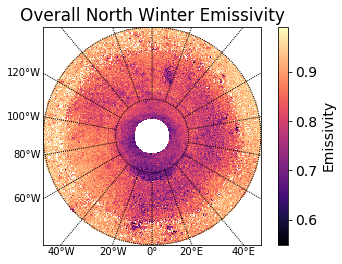

In [192]:
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(NWIEmi, cmap = 'magma', origin = 'upper')
plt.title('Overall North Winter Emissivity')
cbar = plt.colorbar()
cbar.set_label('Emissivity')
plt.clim(0.55,.99)
plt.show()

In [193]:
np.nanmean(NWIEmi)

0.8512682993613131

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  """Entry point for launching an IPython kernel.


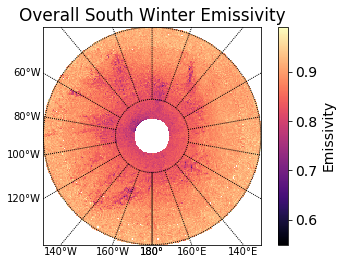

In [194]:
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(SWIEmi, cmap ='magma')
plt.title('Overall South Winter Emissivity')
cbar = plt.colorbar()
cbar.set_label('Emissivity')
plt.clim(.55,.99)
plt.show()

In [195]:
np.nanmean(SWIEmi)

0.8804405761023077

In [196]:
NWICoor = poltocar(NAlb, 'N', 'Y', NAlb['Latitude'], NAlb['Longitude'])
SWICoor = poltocar(SAlb, 'S', 'Y', SAlb['Latitude'], SAlb['Longitude'])

In [197]:
x_range = np.arange(-1,1,.01)
y_range = np.arange(-1,1,.01)

xbins, ybins = len(x_range), len(y_range)
NALB, xedges, yedges, binnumber = stats.binned_statistic_2d(NWICoor[0], NWICoor[1], values= (NAlb['Albedo']), statistic ='mean', bins = [xbins, ybins])
SALB, xedges, yedges, binnumber = stats.binned_statistic_2d(SWICoor[0], SWICoor[1], values= (SAlb['Albedo']), statistic ='mean', bins = [xbins, ybins])

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  """Entry point for launching an IPython kernel.


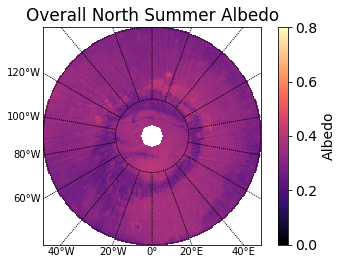

In [198]:
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(NALB, cmap = 'magma', origin ='upper', vmin = 0.0, vmax = 0.8)
plt.title('Overall North Summer Albedo')
cbar = plt.colorbar()
cbar.set_label('Albedo')
plt.show()

In [199]:
np.nanmean(NALB)

0.321802285446831

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  """Entry point for launching an IPython kernel.


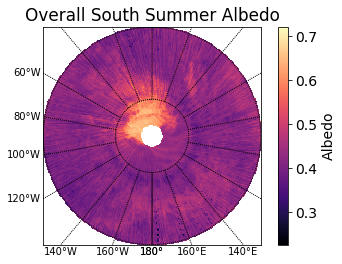

In [200]:
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('Overall South Summer Albedo')
m.imshow(SALB, cmap ='magma')
cbar = plt.colorbar()
cbar.set_label('Albedo')
plt.show()

In [201]:
np.nanmean(SALB)

0.43289055843650714

In [202]:
NAlb0 = NLS0[1]
NAlb15 = NLS15[1]
NAlb30 = NLS30[1]
NAlb45 = NLS45[1]
NAlb60 = NLS60[1]
NAlb75 = NLS75[1]
NEmi0 = NLS0[0]
NEmi15 = NLS15[0]
NEmi30 = NLS30[0]
NEmi45 = NLS45[0]
NEmi60 = NLS60[0]
NEmi75 = NLS75[0]

In [203]:
NCO2Alb = meanstack(NAlb0,NAlb15,NAlb30,NAlb45,NAlb60,NAlb75)
np.shape(NCO2Alb)

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: Mean of empty slice
  import sys


(200, 200)

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  after removing the cwd from sys.path.


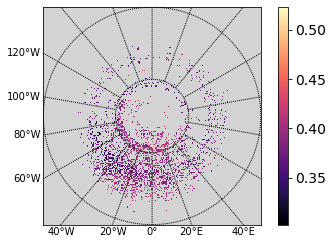

In [204]:
plt.rcParams.update({'font.size': 14})
ax = plt.gca()
ax.set_facecolor('lightgrey')
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(NCO2Alb, origin='upper', cmap = 'magma')
plt.colorbar();
#plt.clim(.9,1)
#plt.savefig('SNAlb.png', dpi= 300, facecolor=fig.get_facecolor(), bbox_inches = 'tight');

In [205]:
np.nanmean(NCO2Alb)

0.3870053313063357

In [206]:
SAlb210 = SLS210[1]
SAlb225 = SLS225[1]
SAlb240 = SLS240[1]
SAlb255 = SLS255[1]
SAlb270 = SLS270[1]
SAlb285 = SLS285[1]
SAlb300 = SLS300[1]
SAlb315 = SLS315[1]
SAlb330 = SLS330[1]

In [207]:
SCO2Alb = meanstack(SAlb210,SAlb225,SAlb240,SAlb255,SAlb270,SAlb285,SAlb300,SAlb315,SAlb330)

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: Mean of empty slice
  import sys


/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  after removing the cwd from sys.path.


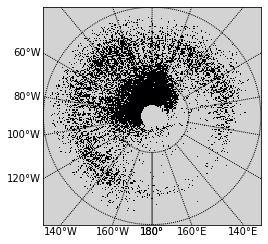

In [208]:
plt.rcParams.update({'font.size': 14})
ax = plt.gca()
ax.set_facecolor('lightgrey')
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(SCO2Alb, cmap ='magma')
plt.clim(0.9,1)
#cbar = plt.colorbar()
cbar.set_label('Albedo')
plt.savefig('SSAlb.png', dpi= 300, facecolor=fig.get_facecolor(), bbox_inches = 'tight');

In [209]:
np.nanmean(SCO2Alb)

0.5230090340909743

In [210]:
NAll_Data = binreduce(NWIEmi,NCO2Alb)
NAvg_Data = binreduce(Ultimate_Emissivity_North_Winter_3000, NCO2Alb)

In [211]:
SAll_Data = binreduce(SWIEmi,SCO2Alb)
SAvg_Data = binreduce(Ultimate_Emissivity_South_Winter_3000, SCO2Alb)

In [212]:
NAll_Data = binreduce(NWIEmi,NCO2Alb)
NSAvg_Data = binreduce(Ultimate_Emissivity_North_Summer_3000, NCO2Alb)

In [213]:
SAll_Data = binreduce(SWIEmi,SCO2Alb)
SSAvg_Data = binreduce(Ultimate_Emissivity_South_Summer_3000, SCO2Alb)

In [214]:
NAll_DataA = np.array(NAll_Data[0])
NAll_DataB = np.array(NAll_Data[1])
NAvg_DataA = np.array(NAvg_Data[0])
NAvg_DataB = np.array(NAvg_Data[1])

SAll_DataA = np.array(SAll_Data[0])
SAll_DataB = np.array(SAll_Data[1])
SAvg_DataA = np.array(SAvg_Data[0])
SAvg_DataB = np.array(SAvg_Data[1])

In [215]:
NCO2Alb = np.array(NAvg_Data[1])
NCO2Emi = np.array(NAvg_Data[0])
SCO2Alb = np.array(SAvg_Data[1])
SCO2Emi = np.array(SAvg_Data[0])

In [216]:
NAll_DataA = NAll_DataA.flatten()
NAll_DataB = NAll_DataB.flatten()
NAvg_DataA = NAvg_DataA.flatten()
NAvg_DataB = NAvg_DataB.flatten()

SAll_DataA = SAll_DataA.flatten()
SAll_DataB = SAll_DataB.flatten()
SAvg_DataA = SAvg_DataA.flatten()
SAvg_DataB = SAvg_DataB.flatten()

In [217]:
NAll_DataA=NAll_DataA[np.logical_not(np.isnan(NAll_DataA))]
NAll_DataB=NAll_DataB[np.logical_not(np.isnan(NAll_DataB))]
NAvg_DataA=NAvg_DataA[np.logical_not(np.isnan(NAvg_DataA))]
NAvg_DataB=NAvg_DataB[np.logical_not(np.isnan(NAvg_DataB))]

SAll_DataA=SAll_DataA[np.logical_not(np.isnan(SAll_DataA))]
SAll_DataB=SAll_DataB[np.logical_not(np.isnan(SAll_DataB))]
SAvg_DataA=SAvg_DataA[np.logical_not(np.isnan(SAvg_DataA))]
SAvg_DataB=SAvg_DataB[np.logical_not(np.isnan(SAvg_DataB))]

In [218]:
NSAvg_DataA = np.array(NSAvg_Data[0])
NSAvg_DataB = np.array(NSAvg_Data[1])
SSAvg_DataA = np.array(SSAvg_Data[0])
SSAvg_DataB = np.array(SSAvg_Data[1])

In [219]:
NSAvg_DataA = NSAvg_DataA.flatten()
NSAvg_DataB = NSAvg_DataB.flatten()
SSAvg_DataA = SSAvg_DataA.flatten()
SSAvg_DataB = SSAvg_DataB.flatten()

In [220]:
NSAvg_DataA=NSAvg_DataA[np.logical_not(np.isnan(NSAvg_DataA))]
NSAvg_DataB=NSAvg_DataB[np.logical_not(np.isnan(NSAvg_DataB))]
SSAvg_DataA=SSAvg_DataA[np.logical_not(np.isnan(SSAvg_DataA))]
SSAvg_DataB=SSAvg_DataB[np.logical_not(np.isnan(SSAvg_DataB))]

In [221]:
#
AMN60 = np.nanmean(polarrings(NCO2Alb, 60,65))
AMN65 = np.nanmean(polarrings(NCO2Alb, 65,70))
AMN70 = np.nanmean(polarrings(NCO2Alb, 70,75))
AMN75 = np.nanmean(polarrings(NCO2Alb, 75,80))
AMN80 = np.nanmean(polarrings(NCO2Alb, 80,87))
AEMN60 = np.nanstd(polarrings(NCO2Alb, 60,65))/np.sqrt(len(np.unique(polarrings(NCO2Alb, 60,65)[~np.isnan(polarrings(NCO2Alb, 60,65))])))
AEMN65 = np.nanstd(polarrings(NCO2Alb, 65,70))/np.sqrt(len(np.unique(polarrings(NCO2Alb, 65,70)[~np.isnan(polarrings(NCO2Alb, 65,70))])))
AEMN70 = np.nanstd(polarrings(NCO2Alb, 70,75))/np.sqrt(len(np.unique(polarrings(NCO2Alb, 70,75)[~np.isnan(polarrings(NCO2Alb, 70,75))])))
AEMN75 = np.nanstd(polarrings(NCO2Alb, 75,80))/np.sqrt(len(np.unique(polarrings(NCO2Alb, 75,80)[~np.isnan(polarrings(NCO2Alb, 75,80))])))
AEMN80 = np.nanstd(polarrings(NCO2Alb, 80,87))/np.sqrt(len(np.unique(polarrings(NCO2Alb, 80,87)[~np.isnan(polarrings(NCO2Alb, 80,87))])))
AMS60 = np.nanmean(polarrings(SCO2Alb, 60,65))
AMS65 = np.nanmean(polarrings(SCO2Alb, 65,70))
AMS70 = np.nanmean(polarrings(SCO2Alb, 70,75))
AMS75 = np.nanmean(polarrings(SCO2Alb, 75,80))
AMS80 = np.nanmean(polarrings(SCO2Alb, 80,87))
AEMS60 = np.nanstd(polarrings(SCO2Alb, 60,65))/np.sqrt(len(np.unique(polarrings(SCO2Alb, 60,65)[~np.isnan(polarrings(SCO2Alb, 60,65))])))
AEMS65 = np.nanstd(polarrings(SCO2Alb, 65,70))/np.sqrt(len(np.unique(polarrings(SCO2Alb, 65,70)[~np.isnan(polarrings(SCO2Alb, 65,70))])))
AEMS70 = np.nanstd(polarrings(SCO2Alb, 70,75))/np.sqrt(len(np.unique(polarrings(SCO2Alb, 70,75)[~np.isnan(polarrings(SCO2Alb, 70,75))])))
AEMS75 = np.nanstd(polarrings(SCO2Alb, 75,80))/np.sqrt(len(np.unique(polarrings(SCO2Alb, 75,80)[~np.isnan(polarrings(SCO2Alb, 75,80))])))
AEMS80 = np.nanstd(polarrings(SCO2Alb, 80,87))/np.sqrt(len(np.unique(polarrings(SCO2Alb, 80,87)[~np.isnan(polarrings(SCO2Alb, 80,87))])))

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in true_divide
  # This is added back by InteractiveShellApp.init_path()
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in true_divide
  # This is added back by InteractiveShellApp.init_path()
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in arctan
  # This is added back by InteractiveShellApp.init_path()


In [222]:
#
EMN60 = np.nanmean(polarrings(NCO2Emi, 60,65))
EMN65 = np.nanmean(polarrings(NCO2Emi, 65,70))
EMN70 = np.nanmean(polarrings(NCO2Emi, 70,75))
EMN75 = np.nanmean(polarrings(NCO2Emi, 75,80))
EMN80 = np.nanmean(polarrings(NCO2Emi, 80,87))
EEMN60 = np.nanstd(polarrings(NCO2Emi, 60,65))/np.sqrt(len(np.unique(polarrings(NCO2Emi, 60,65)[~np.isnan(polarrings(NCO2Emi, 60,65))])))
EEMN65 = np.nanstd(polarrings(NCO2Emi, 65,70))/np.sqrt(len(np.unique(polarrings(NCO2Emi, 65,70)[~np.isnan(polarrings(NCO2Emi, 65,70))])))
EEMN70 = np.nanstd(polarrings(NCO2Emi, 70,75))/np.sqrt(len(np.unique(polarrings(NCO2Emi, 70,75)[~np.isnan(polarrings(NCO2Emi, 70,75))])))
EEMN75 = np.nanstd(polarrings(NCO2Emi, 75,80))/np.sqrt(len(np.unique(polarrings(NCO2Emi, 75,80)[~np.isnan(polarrings(NCO2Emi, 75,80))])))
EEMN80 = np.nanstd(polarrings(NCO2Emi, 80,87))/np.sqrt(len(np.unique(polarrings(NCO2Emi, 80,87)[~np.isnan(polarrings(NCO2Emi, 80,87))])))
EMS60 = np.nanmean(polarrings(SCO2Emi, 60,65))
EMS65 = np.nanmean(polarrings(SCO2Emi, 65,70))
EMS70 = np.nanmean(polarrings(SCO2Emi, 70,75))
EMS75 = np.nanmean(polarrings(SCO2Emi, 75,80))
EMS80 = np.nanmean(polarrings(SCO2Emi, 80,87))
EEMS60 = np.nanstd(polarrings(SCO2Emi, 60,65))/np.sqrt(len(np.unique(polarrings(SCO2Emi, 60,65)[~np.isnan(polarrings(SCO2Emi, 60,65))])))
EEMS65 = np.nanstd(polarrings(SCO2Emi, 65,70))/np.sqrt(len(np.unique(polarrings(SCO2Emi, 65,70)[~np.isnan(polarrings(SCO2Emi, 65,70))])))
EEMS70 = np.nanstd(polarrings(SCO2Emi, 70,75))/np.sqrt(len(np.unique(polarrings(SCO2Emi, 70,75)[~np.isnan(polarrings(SCO2Emi, 70,75))])))
EEMS75 = np.nanstd(polarrings(SCO2Emi, 75,80))/np.sqrt(len(np.unique(polarrings(SCO2Emi, 75,80)[~np.isnan(polarrings(SCO2Emi, 75,80))])))
EEMS80 = np.nanstd(polarrings(SCO2Emi, 80,87))/np.sqrt(len(np.unique(polarrings(SCO2Emi, 80,87)[~np.isnan(polarrings(SCO2Emi, 80,87))])))

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in true_divide
  # This is added back by InteractiveShellApp.init_path()
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in true_divide
  # This is added back by InteractiveShellApp.init_path()
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in arctan
  # This is added back by InteractiveShellApp.init_path()


In [223]:
lan = (62.5, 67.5, 72.5, 77.5, 83.5)
lan1 = np.linspace(50,90,100)
NAE =np.polyfit(lan,(AMN60,AMN65,AMN70,AMN75,AMN80), 1)
SAE =np.polyfit(lan,(AMS60,AMS65,AMS70,AMS75,AMS80), 1)
NEE =np.polyfit(lan,(EMN60,EMN65,EMN70,EMN75,EMN80), 1)
SEE =np.polyfit(lan,(EMS60,EMS65,EMS70,EMS75,EMS80), 1)

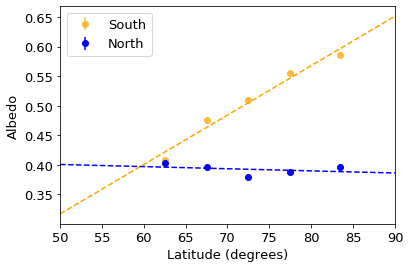

In [224]:
#
plt.rcParams.update({'font.size': 13})
plt.errorbar(lan,(AMS60,AMS65,AMS70,AMS75,AMS80), (AEMS60,AEMS65,AEMS70,AEMS75,AEMS80), 
             fmt = 'o', c = 'orange', label = 'South', alpha = 0.7)
plt.plot(lan1,SAE[1]+SAE[0]*lan1, '--', c = 'orange')
plt.errorbar(lan,(AMN60,AMN65,AMN70,AMN75,AMN80), (AEMN60,AEMN65,AEMN70,AEMN75,AEMN80), 
             fmt = 'o', c = 'blue', label = 'North')
plt.plot(lan1,NAE[1]+NAE[0]*lan1, '--', c = 'blue')
plt.ylabel('Albedo')
plt.xlabel('Latitude (degrees)')
plt.legend(loc = 'upper left')
plt.xlim(50,90)
plt.savefig('albvslat.png', dpi = 200);

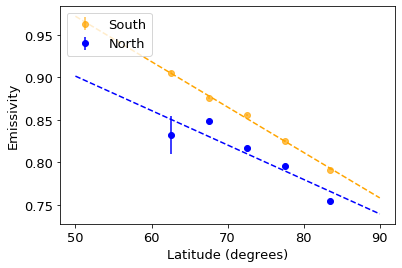

In [225]:
#
plt.rcParams.update({'font.size': 13})
plt.errorbar(lan,(EMS60,EMS65,EMS70,EMS75,EMS80), (EEMS60,EEMS65,EEMS70,EEMS75,EEMS80), 
             fmt = 'o', c = 'orange', label = 'South', alpha = 0.7)
plt.plot(lan1,SEE[1]+SEE[0]*lan1, '--', c = 'orange')
plt.errorbar(lan,(EMN60,EMN65,EMN70,EMN75,EMN80), (EEMN60,EEMN65,EEMN70,EEMN75,EEMN80), 
             fmt = 'o', c = 'blue', label = 'North')
plt.plot(lan1,NEE[1]+NEE[0]*lan1, '--', c = 'blue')
plt.ylabel('Emissivity')
plt.xlabel('Latitude (degrees)')
plt.legend(loc = 'upper left');

In [226]:
#
micron1 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/1um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron2 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/2um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron3 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/3um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron4 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/4um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron5 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/5um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron6 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/6um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron7 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/7um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron8 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/8um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron9 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/9um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron10 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/10um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron15 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/15um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron20 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/20um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron25 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/25um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron30 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/30um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron35 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/35um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron40 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/40um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron45 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/45um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron50 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/50um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron100 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/100um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron200 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/200um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron300 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/300um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron400 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/400um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron500 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/500um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron600 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/600um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron700 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/700um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron800 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/800um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron900 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/900um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron1000 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/1000um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron2000 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/2000um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron3000 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/3000um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron4000 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/4000um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron5000 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/5000um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron6000 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/6000um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron7000 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/7000um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron8000 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/8000um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron9000 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/9000um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron10000 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/10000um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron11000 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/11000um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron12000 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/12000um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron13000 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/13000um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron14000 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/14000um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron15000 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/15000um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron16000 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/16000um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron17000 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/17000um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron18000 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/18000um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron19000 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/19000um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron20000 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/20000um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron30000 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/30000um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron40000 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/40000um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron50000 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/50000um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron60000 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/60000um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron70000 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/70000um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron80000 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/80000um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron90000 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/90000um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron100000 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/100000um.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])

In [227]:
microntest = micron10000[(micron10000['Albedo'] < 0.8) & (micron10000['Albedo'] > 0.7)]
microntest

,Mass Ratio,Albedo,Emissivity
761,0.000003,0.79728,0.80463
762,0.000003,0.79416,0.80469
763,0.000003,0.79100,0.80475
764,0.000003,0.78781,0.80481
765,0.000003,0.78457,0.80487
766,0.000004,0.78129,0.80493
767,0.000004,0.77796,0.80500
768,0.000004,0.77460,0.80507
769,0.000004,0.77120,0.80514
770,0.000004,0.76775,0.80521


In [228]:
#
alb1um = micron1['Albedo']
alb2um = micron2['Albedo']
alb3um = micron3['Albedo']
alb4um = micron4['Albedo']
alb5um = micron5['Albedo']
alb6um = micron6['Albedo']
alb7um = micron7['Albedo']
alb8um = micron8['Albedo']
alb9um = micron9['Albedo']
alb10um = micron10['Albedo']
alb15um = micron15['Albedo']
alb20um = micron20['Albedo']
alb25um = micron25['Albedo']
alb30um = micron30['Albedo']
alb35um = micron35['Albedo']
alb40um = micron40['Albedo']
alb45um = micron45['Albedo']
alb50um = micron50['Albedo']
alb100um = micron100['Albedo']
alb200um = micron200['Albedo']
alb300um = micron300['Albedo']
alb400um = micron400['Albedo']
alb500um = micron500['Albedo']
alb600um = micron600['Albedo']
alb700um = micron700['Albedo']
alb800um = micron800['Albedo']
alb900um = micron900['Albedo']
alb1000um = micron1000['Albedo']
alb2000um = micron2000['Albedo']
alb3000um = micron3000['Albedo']
alb4000um = micron4000['Albedo']
alb5000um = micron5000['Albedo']
alb6000um = micron6000['Albedo']
alb7000um = micron7000['Albedo']
alb8000um = micron8000['Albedo']
alb9000um = micron9000['Albedo']
alb10000um = micron10000['Albedo']
alb11000um = micron11000['Albedo']
alb12000um = micron12000['Albedo']
alb13000um = micron13000['Albedo']
alb14000um = micron14000['Albedo']
alb15000um = micron15000['Albedo']
alb16000um = micron16000['Albedo']
alb17000um = micron17000['Albedo']
alb18000um = micron18000['Albedo']
alb19000um = micron19000['Albedo']
alb20000um = micron20000['Albedo']
alb30000um = micron30000['Albedo']
alb40000um = micron40000['Albedo']
alb50000um = micron50000['Albedo']
alb60000um = micron60000['Albedo']
alb70000um = micron70000['Albedo']
alb80000um = micron80000['Albedo']
alb90000um = micron90000['Albedo']
alb100000um = micron100000['Albedo']

In [229]:
#
emi1um = micron1['Emissivity']
emi2um = micron2['Emissivity']
emi3um = micron3['Emissivity']
emi4um = micron4['Emissivity']
emi5um = micron5['Emissivity']
emi6um = micron6['Emissivity']
emi7um = micron7['Emissivity']
emi8um = micron8['Emissivity']
emi9um = micron9['Emissivity']
emi10um = micron10['Emissivity']
emi15um = micron15['Emissivity']
emi20um = micron20['Emissivity']
emi25um = micron25['Emissivity']
emi30um = micron30['Emissivity']
emi35um = micron35['Emissivity']
emi40um = micron40['Emissivity']
emi45um = micron45['Emissivity']
emi50um = micron50['Emissivity']
emi100um = micron100['Emissivity']
emi200um = micron200['Emissivity']
emi300um = micron300['Emissivity']
emi400um = micron400['Emissivity']
emi500um = micron500['Emissivity']
emi600um = micron600['Emissivity']
emi700um = micron700['Emissivity']
emi800um = micron800['Emissivity']
emi900um = micron900['Emissivity']
emi1000um = micron1000['Emissivity']
emi2000um = micron2000['Emissivity']
emi3000um = micron3000['Emissivity']
emi4000um = micron4000['Emissivity']
emi5000um = micron5000['Emissivity']
emi6000um = micron6000['Emissivity']
emi7000um = micron7000['Emissivity']
emi8000um = micron8000['Emissivity']
emi9000um = micron9000['Emissivity']
emi10000um = micron10000['Emissivity']
emi11000um = micron11000['Emissivity']
emi12000um = micron12000['Emissivity']
emi13000um = micron13000['Emissivity']
emi14000um = micron14000['Emissivity']
emi15000um = micron15000['Emissivity']
emi16000um = micron16000['Emissivity']
emi17000um = micron17000['Emissivity']
emi18000um = micron18000['Emissivity']
emi19000um = micron19000['Emissivity']
emi20000um = micron20000['Emissivity']
emi30000um = micron30000['Emissivity']
emi40000um = micron40000['Emissivity']
emi50000um = micron50000['Emissivity']
emi60000um = micron60000['Emissivity']
emi70000um = micron70000['Emissivity']
emi80000um = micron80000['Emissivity']
emi90000um = micron90000['Emissivity']
emi100000um = micron100000['Emissivity']

In [230]:
#
ratio1um = micron1['Mass Ratio']
ratio2um = micron2['Mass Ratio']
ratio3um = micron3['Mass Ratio']
ratio4um = micron4['Mass Ratio']
ratio5um = micron5['Mass Ratio']
ratio6um = micron6['Mass Ratio']
ratio7um = micron7['Mass Ratio']
ratio8um = micron8['Mass Ratio']
ratio9um = micron9['Mass Ratio']
ratio10um = micron10['Mass Ratio']
ratio15um = micron15['Mass Ratio']
ratio20um = micron20['Mass Ratio']
ratio25um = micron25['Mass Ratio']
ratio30um = micron30['Mass Ratio']
ratio35um = micron35['Mass Ratio']
ratio40um = micron40['Mass Ratio']
ratio45um = micron45['Mass Ratio']
ratio50um = micron50['Mass Ratio']
ratio100um = micron100['Mass Ratio']
ratio400um = micron400['Mass Ratio']
ratio1000um = micron1000['Mass Ratio']
ratio2000um = micron2000['Mass Ratio']
ratio3000um = micron3000['Mass Ratio']
ratio4000um = micron4000['Mass Ratio']
ratio5000um = micron5000['Mass Ratio']
ratio6000um = micron6000['Mass Ratio']
ratio7000um = micron7000['Mass Ratio']
ratio8000um = micron8000['Mass Ratio']
ratio9000um = micron9000['Mass Ratio']
ratio10000um = micron10000['Mass Ratio']
ratio11000um = micron11000['Mass Ratio']
ratio12000um = micron12000['Mass Ratio']
ratio13000um = micron13000['Mass Ratio']
ratio14000um = micron14000['Mass Ratio']
ratio15000um = micron15000['Mass Ratio']
ratio16000um = micron16000['Mass Ratio']
ratio17000um = micron17000['Mass Ratio']
ratio18000um = micron18000['Mass Ratio']
ratio19000um = micron19000['Mass Ratio']
ratio20000um = micron20000['Mass Ratio']
ratio30000um = micron30000['Mass Ratio']
ratio40000um = micron40000['Mass Ratio']
ratio50000um = micron50000['Mass Ratio']
ratio60000um = micron60000['Mass Ratio']
ratio70000um = micron70000['Mass Ratio']
ratio80000um = micron80000['Mass Ratio']
ratio90000um = micron90000['Mass Ratio']
ratio100000um = micron100000['Mass Ratio']

In [231]:
NL =np.polyfit(NAvg_DataB,NAvg_DataA, 1)
SL =np.polyfit(SAvg_DataB,SAvg_DataA, 1)
NAL =np.polyfit(N1,N0, 1)
SAL =np.polyfit(S1,S0, 1)
a = np.linspace(0.25,.92,100)
correlation = np.corrcoef(NAvg_DataB,NAvg_DataA)[0,1]
correlation2 = np.corrcoef(SAvg_DataB,SAvg_DataA)[0,1]
correlation3 = np.corrcoef(N1,N0)[0,1]
correlation4 = np.corrcoef(S1,S0)[0,1]

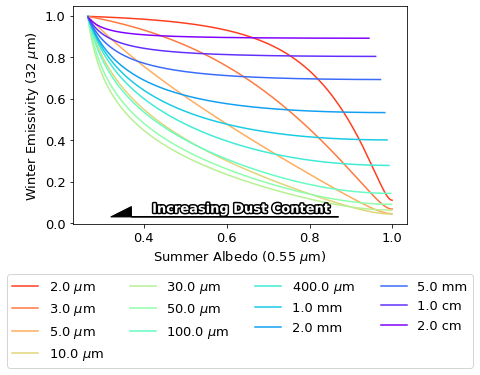

In [232]:
#
fig = plt.figure(1)
ax = fig.add_subplot(111)
#ax.plot(alb1um,emi1um,label = '1um ice')
ax.plot(alb2um,emi2um,label = '2.0 $\mu$m', c = plt.cm.rainbow_r(10*2))

ax.plot(alb3um,emi3um,label = '3.0 $\mu$m', c = plt.cm.rainbow_r(20*2))
#ax.plot(alb4um,emi4um,label = '4um ice')
ax.plot(alb5um,emi5um,label = '5.0 $\mu$m', c = plt.cm.rainbow_r(30*2))
#ax.plot(alb6um,emi6um,label = '6um ice')
#ax.plot(alb7um,emi7um,label = '7um ice')
#ax.plot(alb8um,emi8um,label = '8um ice')
#ax.plot(alb9um,emi9um,label = '9um ice')
ax.plot(alb10um,emi10um,label = '10.0 $\mu$m', c = plt.cm.rainbow_r(40*2))
#ax.plot(alb15um,emi15um,label = '15um ice')
#ax.plot(alb20um,emi20um,label = '20um ice')
#ax.plot(alb25um,emi25um,label = '25um ice')
ax.plot(alb30um,emi30um,label = '30.0 $\mu$m', c = plt.cm.rainbow_r(50*2))
#ax.plot(alb35um,emi35um,label = '35um ice')
#ax.plot(alb40um,emi40um,label = '40um ice')
#ax.plot(alb45um,emi45um,label = '45um ice')
ax.plot(alb50um,emi50um,label = '50.0 $\mu$m', c = plt.cm.rainbow_r(60*2))
ax.plot(alb100um,emi100um,label = '100.0 $\mu$m', c = plt.cm.rainbow_r(70*2))
#ax.plot(alb200um,emi200um,label = '200um ice')
#ax.plot(alb300um,emi300um,label = '300um ice')
ax.plot(alb400um,emi400um,label = '400.0 $\mu$m', c = plt.cm.rainbow_r(80*2))
#ax.plot(alb500um,emi500um,label = '500um ice')
#ax.plot(alb600um,emi600um,label = '600um ice')
#ax.plot(alb700um,emi700um,label = '700um ice')
#ax.plot(alb800um,emi800um,label = '800um ice')
#ax.plot(alb900um,emi900um,label = '900um ice')
ax.plot(alb1000um,emi1000um,label = '1.0 mm', c = plt.cm.rainbow_r(90*2))
ax.plot(alb2000um,emi2000um,label = '2.0 mm', c = plt.cm.rainbow_r(100*2))
#ax.plot(alb3000um,emi3000um,label = '3000um ice')
#ax.plot(alb4000um,emi4000um,label = '4000um ice')
ax.plot(alb5000um,emi5000um,label = '5.0 mm', c = plt.cm.rainbow_r(110*2))
#ax.plot(alb6000um,emi6000um,label = '6000um ice')
#ax.plot(alb7000um,emi7000um,label = '7000um ice')
#ax.plot(alb8000um,emi8000um,label = '8000um ice')
#ax.plot(alb9000um,emi9000um,label = '9000um ice')
ax.plot(alb10000um,emi10000um,label = '1.0 cm', c = plt.cm.rainbow_r(120*2))
ax.plot(alb20000um,emi20000um,label = '2.0 cm',  c = plt.cm.rainbow_r(130*2))
plt.arrow(0.87,.03,-.5,0, shape = 'left', head_width = .1, head_length = .05, color ='k')
ax.text(0.42,0.05,'Increasing Dust Content' , color = 'w', fontweight = 1000, path_effects=[path_effects.Stroke(linewidth=3, foreground='black'),
                       path_effects.Normal()])
lgd = ax.legend(loc=9, bbox_to_anchor=(0.5, -0.2), ncol = 4)
plt.xlabel('Summer Albedo (0.55 $\mu$m)')
plt.ylabel('Winter Emissivity (32 $\mu$m)')
plt.savefig('AlbEmiModel.png',bbox_extra_artists=(lgd,), bbox_inches='tight',dpi=300);

In [233]:
#
micron1wa = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/1umwa.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron10wa = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/10umwa.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron100wa = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/100umwa.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])
micron1000wa = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Data_Products/ALBemi/1000umwa.csv', names = ['Mass Ratio' , 'Albedo', 'Emissivity'])

In [234]:
#
alb1umwa = micron1wa['Albedo']
alb10umwa = micron10wa['Albedo']
alb100umwa = micron100wa['Albedo']
alb1000umwa = micron1000wa['Albedo']
emi1umwa = micron1wa['Emissivity']
emi10umwa = micron10wa['Emissivity']
emi100umwa = micron100wa['Emissivity']
emi1000umwa = micron1000wa['Emissivity']
ratio1umwa = micron1wa['Mass Ratio']
ratio10umwa = micron10wa['Mass Ratio']
ratio100umwa = micron100wa['Mass Ratio']
ratio1000umwa = micron1000wa['Mass Ratio']
h2o = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Matlab_Fx/h2owdust1.csv', names = ['Ratio','Albedo', 'Emissivity'])
h2o10 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Matlab_Fx/h2owdust10.csv', names = ['Ratio','Albedo', 'Emissivity'])

In [405]:
from scipy.interpolate import interp1d    
radius = interp1d([0,100],(1,10), kind='linear',axis=0, fill_value='extrapolate')
rationew = interp1d([0,100], np.stack((h2o['Ratio'], h2o10['Ratio'])), kind='linear', axis=0)
albnew = interp1d([0,100], np.stack((h2o['Albedo'], h2o10['Albedo'])), kind='linear', axis=0)
eminew = interp1d([0,100], np.stack((h2o['Emissivity'], h2o10['Emissivity'])), kind='linear', axis=0)
rationew(74)[]

array([7.82220000e-07, 8.11579324e-07, 8.42033756e-07, ...,
       7.26656306e+09, 7.53929710e+09, 7.82220000e+09])

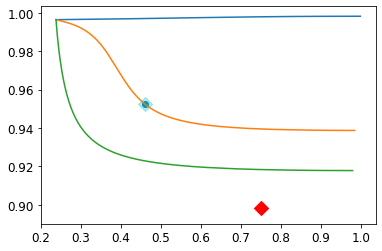

In [418]:
plt.plot(albnew(0),eminew(0));
plt.plot(albnew(74),eminew(74));
plt.plot(albnew(100),eminew(100));
#plt.scatter(albnew(0)[159],eminew(0)[159],label='$q_d$ = {:.1e}'.format(rationew(0)[289]))
#plt.scatter(albnew(1)[150],eminew(1)[150],label='$q_d$ = {:.1e}'.format(rationew(1)[307]))
plt.scatter(albnew(74)[247],eminew(74)[247],label='$q_d$ = {:.1e}'.format(rationew(2)[143]))
plt.scatter(0.46, np.nanmean(NSAvg_DataA),c = 'c', label = 'Corrected Surface ($q_d$ = 1.4e-05) North', zorder =10000, marker=  'D', s = 100, alpha =0.3)
plt.scatter(0.75, np.nanmean(SSAvg_DataA),c = 'r', label = 'Corrected Surface ($q_d$ = 2.5e-06)', zorder =10000, marker=  'D',s =100);

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

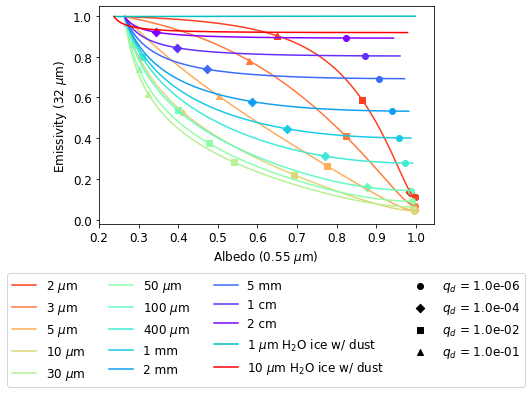

In [415]:
#
fig = plt.figure(1)
ax = fig.add_subplot(111)
#ax.plot(alb1um,emi1um,label = '1um ice')
ax.plot(alb2um,emi2um,label = '2 $\mu$m', c = plt.cm.rainbow_r(10*2))
ax.scatter(alb2um[38],emi2um[38], label = r'$q_d$ = {:.1e}'.format(ratio2um[38]), c = 'k')
ax.scatter(alb2um[163],emi2um[163], marker ='D', label = r'$q_d$ = {:.1e}'.format(ratio2um[163]), c = 'k')
ax.scatter(alb2um[163],emi2um[163], marker ='D', c = plt.cm.rainbow_r(10*2))
ax.scatter(alb2um[288],emi2um[288], marker ='s', label = r'$q_d$ = {:.1e}'.format(ratio2um[288]), c = 'k')
ax.scatter(alb2um[350],emi2um[350], marker ='^', label = r'$q_d$ = {:.1e}'.format(ratio2um[350]), c = 'k')
ax.scatter(alb2um[38],emi2um[38], c = plt.cm.rainbow_r(10*2))
ax.scatter(alb2um[288],emi2um[288], marker ='s', c = plt.cm.rainbow_r(10*2))
ax.scatter(alb2um[350],emi2um[350], marker ='^', c = plt.cm.rainbow_r(10*2))
ax.plot(alb3um,emi3um,label = '3 $\mu$m', c = plt.cm.rainbow_r(20*2))
ax.scatter(alb3um[71],emi3um[71], c = plt.cm.rainbow_r(20*2))
ax.scatter(alb3um[323],emi3um[323], marker ='s', c = plt.cm.rainbow_r(20*2))
ax.scatter(alb3um[384],emi3um[384], marker ='^', c = plt.cm.rainbow_r(20*2))
#ax.plot(alb4um,emi4um,label = '4um ice')
ax.plot(alb5um,emi5um,label = '5 $\mu$m', c = plt.cm.rainbow_r(30*2))
ax.scatter(alb5um[113],emi5um[113], c = plt.cm.rainbow_r(30*2))
ax.scatter(alb5um[363],emi5um[363], marker ='s', c = plt.cm.rainbow_r(30*2))
ax.scatter(alb5um[425],emi5um[425], marker ='^', c = plt.cm.rainbow_r(30*2))
#ax.plot(alb6um,emi6um,label = '6um ice')
#ax.plot(alb7um,emi7um,label = '7um ice')
#ax.plot(alb8um,emi8um,label = '8um ice')
#ax.plot(alb9um,emi9um,label = '9um ice')
ax.plot(alb10um,emi10um,label = '10 $\mu$m', c = plt.cm.rainbow_r(40*2))
ax.scatter(alb10um[169],emi10um[169], c = plt.cm.rainbow_r(40*2))
ax.scatter(alb10um[419],emi10um[419], marker ='s', c = plt.cm.rainbow_r(40*2))
ax.scatter(alb10um[482],emi10um[482], marker ='^', c = plt.cm.rainbow_r(40*2))
#ax.plot(alb15um,emi15um,label = '15um ice')
#ax.plot(alb20um,emi20um,label = '20um ice')
#ax.plot(alb25um,emi25um,label = '25um ice')
ax.plot(alb30um,emi30um,label = '30 $\mu$m', c = plt.cm.rainbow_r(50*2))
ax.scatter(alb30um[259],emi30um[259], c = plt.cm.rainbow_r(50*2))
ax.scatter(alb30um[509],emi30um[509], marker ='s', c = plt.cm.rainbow_r(50*2))
ax.scatter(alb30um[571],emi30um[571], marker ='^', c = plt.cm.rainbow_r(50*2))
#ax.plot(alb35um,emi35um,label = '35um ice')
#ax.plot(alb40um,emi40um,label = '40um ice')
#ax.plot(alb45um,emi45um,label = '45um ice')
ax.plot(alb50um,emi50um,label = '50 $\mu$m', c = plt.cm.rainbow_r(60*2))
ax.scatter(alb50um[300],emi50um[300], c = plt.cm.rainbow_r(60*2))
ax.scatter(alb50um[550],emi50um[550], marker ='s', c = plt.cm.rainbow_r(60*2))
ax.scatter(alb50um[613],emi50um[613], marker ='^', c = plt.cm.rainbow_r(60*2))
ax.plot(alb100um,emi100um,label = '100 $\mu$m', c = plt.cm.rainbow_r(70*2))
ax.scatter(alb100um[357],emi100um[357], c = plt.cm.rainbow_r(70*2))
ax.scatter(alb100um[607],emi100um[607], marker ='s', c = plt.cm.rainbow_r(70*2))
ax.scatter(alb100um[482],emi100um[482], marker ='D', c = plt.cm.rainbow_r(70*2))
ax.scatter(alb100um[669],emi100um[669], marker ='^', c = plt.cm.rainbow_r(70*2))
#ax.plot(alb200um,emi200um,label = '200um ice')
#ax.plot(alb300um,emi300um,label = '300um ice')
ax.plot(alb400um,emi400um,label = '400 $\mu$m', c = plt.cm.rainbow_r(80*2))
ax.scatter(alb400um[470],emi400um[470], c = plt.cm.rainbow_r(80*2))
ax.scatter(alb400um[595],emi400um[595], marker ='D', c = plt.cm.rainbow_r(80*2))
ax.scatter(alb400um[720],emi400um[720], marker ='s', c = plt.cm.rainbow_r(80*2))
ax.scatter(alb400um[782],emi400um[782], marker ='^', c = plt.cm.rainbow_r(80*2))
#ax.plot(alb500um,emi500um,label = '500um ice')
#ax.plot(alb600um,emi600um,label = '600um ice')
#ax.plot(alb700um,emi700um,label = '700um ice')
#ax.plot(alb800um,emi800um,label = '800um ice')
#ax.plot(alb900um,emi900um,label = '900um ice')
ax.plot(alb1000um,emi1000um,label = '1 mm', c = plt.cm.rainbow_r(90*2))
ax.scatter(alb1000um[544],emi1000um[544], c = plt.cm.rainbow_r(90*2))
ax.scatter(alb1000um[669],emi1000um[669], marker ='D', c = plt.cm.rainbow_r(90*2))
ax.plot(alb2000um,emi2000um,label = '2 mm', c = plt.cm.rainbow_r(100*2))
ax.scatter(alb2000um[601],emi2000um[601], c = plt.cm.rainbow_r(100*2))
ax.scatter(alb2000um[726],emi2000um[726], marker ='D', c = plt.cm.rainbow_r(100*2))
#ax.plot(alb3000um,emi3000um,label = '3000um ice')
#ax.plot(alb4000um,emi4000um,label = '4000um ice')
ax.plot(alb5000um,emi5000um,label = '5 mm', c = plt.cm.rainbow_r(110*2))
ax.scatter(alb5000um[675],emi5000um[675], c = plt.cm.rainbow_r(110*2))
ax.scatter(alb5000um[800],emi5000um[800], marker ='D', c = plt.cm.rainbow_r(110*2))
#ax.plot(alb6000um,emi6000um,label = '6000um ice')
#ax.plot(alb7000um,emi7000um,label = '7000um ice')
#ax.plot(alb8000um,emi8000um,label = '8000um ice')
#ax.plot(alb9000um,emi9000um,label = '9000um ice')
ax.plot(alb10000um,emi10000um,label = '1 cm', c = plt.cm.rainbow_r(120*2))
ax.scatter(alb10000um[732],emi10000um[732], c = plt.cm.rainbow_r(120*2))
ax.scatter(alb10000um[857],emi10000um[857], marker ='D', c = plt.cm.rainbow_r(120*2))
ax.plot(alb20000um,emi20000um,label = '2 cm', c = plt.cm.rainbow_r(130*2))
ax.scatter(alb20000um[788],emi20000um[788], c = plt.cm.rainbow_r(130*2))
ax.scatter(alb20000um[913],emi20000um[913], marker ='D', c = plt.cm.rainbow_r(130*2))
ax.plot(h2o['Albedo'],h2o['Emissivity'], label = '1 $\mu$m H$_2$O ice w/ dust', c = 'c', linewidth = 1.5)
ax.plot(h2o10['Albedo'],h2o10['Emissivity'], label = '10 $\mu$m H$_2$O ice w/ dust', c = 'r', linewidth = 1.5)

lgd = ax.legend(loc=9, bbox_to_anchor=(0.5, -0.2), ncol = 4)
plt.xlabel('Albedo (0.55 $\mu$m)')
plt.ylabel('Emissivity (32 $\mu$m)');
plt.savefig('AlbEmiModelmmr.png',bbox_extra_artists=(lgd,), bbox_inches='tight',dpi=300);

In [355]:
h2o10['Albedo'].min()

0.2379

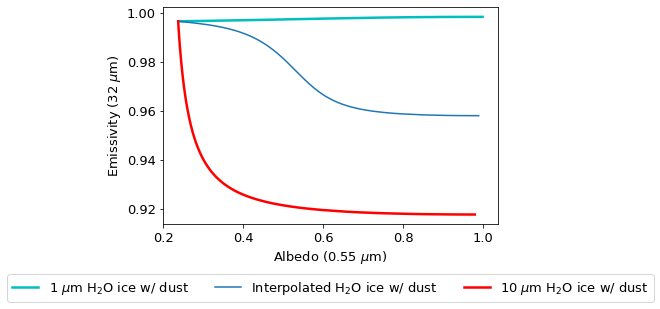

In [239]:
fig = plt.figure(1)
ax = fig.add_subplot(111)
ax.plot(h2o['Albedo'],h2o['Emissivity'], label = '1 $\mu$m H$_2$O ice w/ dust', c = 'c', linewidth = 2.5)
ax.plot(albnew(1),eminew(1), label = 'Interpolated H$_2$O ice w/ dust');
ax.plot(h2o10['Albedo'],h2o10['Emissivity'], label = '10 $\mu$m H$_2$O ice w/ dust', c = 'r', linewidth = 2.5)
plt.xlabel('Albedo (0.55 $\mu$m)')
plt.ylabel('Emissivity (32 $\mu$m)')
lgd = ax.legend(loc=9, bbox_to_anchor=(0.5, -0.2), ncol = 3)
plt.savefig('Interph2o.png',bbox_extra_artists=(lgd,), bbox_inches='tight',dpi=300);

In [240]:
ratio10000um[715]
ratio10000um[830]

3.8109000000000004e-05

Mass mixing ratio top of the atmosphere north is 10^-4, surface is 10^-5.
Mass mixing ratio top of the atmosphere south is 10^-5, surface is 10^-7.

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

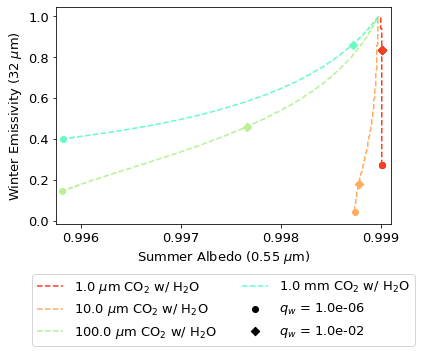

In [241]:
#
fig = plt.figure(1)
ax = fig.add_subplot(111)
plt.rcParams.update({'font.size': 13})
ax.plot(alb1umwa, emi1umwa, linestyle = '--'  , label = '1.0 $\mu$m CO$_2$ w/ H$_2$O',  c = plt.cm.rainbow_r(10*2))
ax.plot(alb10umwa, emi10umwa, linestyle = '--' , label = '10.0 $\mu$m CO$_2$ w/ H$_2$O',  c = plt.cm.rainbow_r(30*2))
ax.plot(alb100umwa, emi100umwa, linestyle = '--' , label = '100.0 $\mu$m CO$_2$ w/ H$_2$O',  c = plt.cm.rainbow_r(50*2))
ax.plot(alb1000umwa, emi1000umwa, linestyle = '--' , label = '1.0 mm CO$_2$ w/ H$_2$O',  c = plt.cm.rainbow_r(70*2))
plt.scatter(alb1umwa[10], emi1umwa[10], label = r'$q_w$ = {:.1e}'.format(ratio1umwa[10]), c = 'k')
plt.scatter(alb1umwa[10], emi1umwa[10], c = plt.cm.rainbow_r(10*2))
plt.scatter(alb10umwa[197], emi10umwa[197], c = plt.cm.rainbow_r(30*2))
plt.scatter(alb100umwa[385], emi100umwa[385], c = plt.cm.rainbow_r(50*2))
plt.scatter(alb1000umwa[572], emi1000umwa[572], c = plt.cm.rainbow_r(70*2))
plt.scatter(alb1umwa[260], emi1umwa[260],marker ='D', label = r'$q_w$ = {:.1e}'.format(ratio1umwa[260]), c = 'k')
plt.scatter(alb1umwa[260], emi1umwa[260],marker ='D', c = plt.cm.rainbow_r(10*2))
plt.scatter(alb10umwa[447], emi10umwa[447], marker ='D',c = plt.cm.rainbow_r(30*2))
plt.scatter(alb100umwa[635], emi100umwa[635], marker ='D',c = plt.cm.rainbow_r(50*2))
plt.scatter(alb1000umwa[822], emi1000umwa[822],marker ='D', c = plt.cm.rainbow_r(70*2))
lgd = ax.legend(loc=9, bbox_to_anchor=(0.5, -0.2), ncol = 2)
plt.xlabel('Summer Albedo (0.55 $\mu$m)')
plt.ylabel('Winter Emissivity (32 $\mu$m)')
plt.xlim(0.99575,0.9991)
plt.xticks([0.996,0.997,0.998,0.999])
plt.savefig('AlbEmiModelco2wa.png',bbox_extra_artists=(lgd,), bbox_inches='tight',dpi=300);

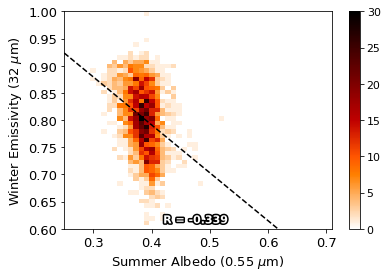

In [242]:
#
fig = plt.figure(1)
ax = fig.add_subplot(111)
plt.rcParams.update({'font.size': 11})
im = ax.hist2d(NAvg_DataB,NAvg_DataA,range = [[0.25, 0.71], [0.6, 1.0]], bins = [50,50], cmap = 'gist_heat_r')
ax.plot(a,NL[1]+NL[0]*a, '--',c = 'black')
colors = ['#e6194b', '#f58231', '#ffe119', '#bcf60c', '#3cb44b', '#46f0f0', '#4363d8', '#911eb4', '#f032e6', '#808080']
ax.text(0.42,0.61,'R = {:.3f}'.format(correlation) , color = 'w', fontweight = 1000, path_effects=[path_effects.Stroke(linewidth=3, foreground='black'),
                       path_effects.Normal()])
ax.set_xlabel('Summer Albedo (0.55 $\mu$m)')
ax.set_ylabel('Winter Emissivity (32 $\mu$m)')
fig.colorbar(im[3], ticks = [0,5,10,15,20,25,30])
#ax.plot(alb3000um,emi3000um,label = '3.0 mm', c = plt.cm.rainbow_r(60*2))
#ax.plot(alb4000um,emi4000um,label = '4.0 mm', c = plt.cm.rainbow_r(70*2))
#ax.plot(alb5000um,emi5000um,label = '5.0 mm', c = plt.cm.rainbow_r(80*2))
#ax.plot(alb6000um,emi6000um,label = '6.0 mm', c = plt.cm.rainbow_r(90*2))
#ax.plot(alb8000um,emi8000um,label = '8.0 mm', c = plt.cm.rainbow_r(100*2))
#ax.plot(alb10000um,emi10000um,label = '1.0 cm', c = plt.cm.rainbow_r(110*2))
#ax.plot(alb13000um,emi13000um,label = '1.3 cm', c = plt.cm.rainbow_r(120*2))
#plt.scatter(0.46,0.80, c = 'r', label = 'Corrected Surface ($q_d$ = 7.2e-05)', zorder =10000, marker = 'D')
#plt.scatter(0.39,0.80, c = 'c', label  = 'Mean TOA ($q_d$ = 1.9e-04)', zorder =10000, marker = 's')

#lgd = ax.legend(loc=9, bbox_to_anchor=(0.5, -0.2), ncol = 4)
plt.savefig('Northmixrat.png',bbox_extra_artists=(lgd,), bbox_inches='tight',dpi=300);

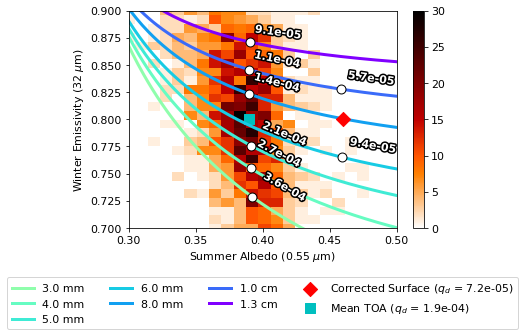

In [243]:
#
fig = plt.figure(1)
ax = fig.add_subplot(111)
plt.rcParams.update({'font.size': 11})
im2 = ax.hist2d(NAvg_DataB,NAvg_DataA, range = [[0.25, 0.71], [0.6, 1.0]], bins = [50,50], cmap = 'gist_heat_r')
colors = ['#e6194b', '#f58231', '#ffe119', '#bcf60c', '#3cb44b', '#46f0f0', '#4363d8', '#911eb4', '#f032e6', '#808080']
#ax.plot(a,NL[1]+NL[0]*a, '--',c = 'black')
ax.set_xlabel('Summer Albedo (0.55 $\mu$m)')
ax.set_ylabel('Winter Emissivity (32 $\mu$m)')
fig.colorbar(im2[3])
ax.plot(alb3000um,emi3000um,label = '3.0 mm ', c = plt.cm.rainbow_r(60*2), linewidth=3.0)
ax.plot(alb4000um,emi4000um,label = '4.0 mm ', c = plt.cm.rainbow_r(70*2), linewidth=3.0)
ax.plot(alb5000um,emi5000um,label = '5.0 mm ', c = plt.cm.rainbow_r(80*2), linewidth=3.0)
ax.plot(alb6000um,emi6000um,label = '6.0 mm ', c = plt.cm.rainbow_r(90*2), linewidth=3.0)
ax.plot(alb8000um,emi8000um,label = '8.0 mm', c = plt.cm.rainbow_r(100*2), linewidth=3.0)
ax.plot(alb10000um,emi10000um,label = '1.0 cm', c = plt.cm.rainbow_r(110*2), linewidth=3.0)
ax.plot(alb13000um,emi13000um,label = '1.3 cm', c = plt.cm.rainbow_r(130*2), linewidth=3.0)
#ax.scatter(alb3000um[812],emi3000um[812], c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
#ax.scatter(alb4000um[825],emi4000um[825], c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
#ax.scatter(alb5000um[835],emi5000um[835], c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
#ax.scatter(alb6000um[843],emi6000um[843], c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
ax.scatter(alb8000um[847],emi8000um[847], c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
ax.scatter(alb10000um[859],emi10000um[859], c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
ax.scatter(alb13000um[873],emi13000um[873], c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
ax.scatter(alb3000um[793],emi3000um[793], c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
ax.scatter(alb4000um[809],emi4000um[809], c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
ax.scatter(alb5000um[821],emi5000um[821], c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
#ax.scatter(alb6000um[829],emi6000um[829], c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
ax.scatter(alb6000um[813],emi6000um[813], c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
ax.scatter(alb10000um[841],emi10000um[841], c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
#ax.text(alb3000um[812]+.007,emi3000um[812]-.010, '{:.1e}'.format(ratio3000um[812]),rotation = -34,fontsize= 'medium', color = 'w', fontweight = 1000, path_effects=[path_effects.Stroke(linewidth=3, foreground='black'),
                       #path_effects.Normal()])
#ax.text(alb4000um[825]+.007,emi4000um[825]-.008, '{:.1e}'.format(ratio4000um[825]),rotation = -30,fontsize= 'medium', color = 'w', fontweight = 1000, path_effects=[path_effects.Stroke(linewidth=3, foreground='black'),
                       #path_effects.Normal()])
#ax.text(alb5000um[835]+.005,emi5000um[835]-.005, '{:.1e}'.format(ratio5000um[835]),rotation = -25,fontsize= 'medium', color = 'w', fontweight = 1000, path_effects=[path_effects.Stroke(linewidth=3, foreground='black'),
                       #path_effects.Normal()])
#ax.text(alb6000um[843]+.004,emi6000um[843]-.0007, '{:.1e}'.format(ratio6000um[843]),rotation = -23,fontsize= 'medium', color = 'w', fontweight = 1000, path_effects=[path_effects.Stroke(linewidth=3, foreground='black'),
                       #path_effects.Normal()])
ax.text(alb3000um[793]+.007,emi3000um[793]-.004, '{:.1e}'.format(ratio3000um[793]),rotation = -30,fontsize= 'medium', color = 'w', fontweight = 1000, path_effects=[path_effects.Stroke(linewidth=3, foreground='black'),
                       path_effects.Normal()])
ax.text(alb4000um[809]+.004,emi4000um[809]+.001, '{:.1e}'.format(ratio4000um[809]),rotation = -28,fontsize= 'medium', color = 'w', fontweight = 1000, path_effects=[path_effects.Stroke(linewidth=3, foreground='black'),
                       path_effects.Normal()])
ax.text(alb5000um[820]+.004,emi5000um[820]+.002, '{:.1e}'.format(ratio5000um[820]),rotation = -23,fontsize= 'medium', color = 'w', fontweight = 1000, path_effects=[path_effects.Stroke(linewidth=3, foreground='black'),
                       path_effects.Normal()])
ax.text(alb8000um[847]+.003,emi8000um[847]+.002, '{:.1e}'.format(ratio8000um[847]),rotation = -15,fontsize= 'medium', color = 'w', fontweight = 1000, path_effects=[path_effects.Stroke(linewidth=3, foreground='black'),
                       path_effects.Normal()])
ax.text(alb10000um[859]+.003,emi10000um[859]+.002,'{:.1e}'.format(ratio10000um[859]),rotation = -12,fontsize= 'medium', color = 'w', fontweight = 1000, path_effects=[path_effects.Stroke(linewidth=3, foreground='black'),
                       path_effects.Normal()])
ax.text(alb13000um[873]+.003,emi13000um[873]+.003, '{:.1e}'.format(ratio13000um[873]),rotation = -8,fontsize= 'medium', color = 'w', fontweight = 1000, path_effects=[path_effects.Stroke(linewidth=3, foreground='black'),
                       path_effects.Normal()])
ax.text(alb6000um[813]+.005,emi6000um[813]+.004, '{:.1e}'.format(ratio6000um[813]),rotation = -10,fontsize= 'medium', color = 'w', fontweight = 1000, path_effects=[path_effects.Stroke(linewidth=3, foreground='black'),
                       path_effects.Normal()])

ax.text(alb10000um[841]+.005,emi10000um[841]+.004,'{:.1e}'.format(ratio10000um[841]),rotation = -8,fontsize= 'medium', color = 'w', fontweight = 1000, path_effects=[path_effects.Stroke(linewidth=3, foreground='black'),
                       path_effects.Normal()])
plt.scatter(0.46,0.80, c = 'r', label = 'Corrected Surface ($q_d$ = 7.2e-05)', s = 100, zorder = 10000, marker = 'D')
plt.scatter(0.39,0.80, c = 'c', label  = 'Mean TOA ($q_d$ = 1.9e-04)', s = 100, marker = 's')
plt.xticks([.3,.35,.4,.45,.5,.55])
plt.xlim(.3,.5)
plt.ylim(.7,.9)
lgd = ax.legend(loc=9, bbox_to_anchor=(0.5, -0.2), ncol = 4)
plt.savefig('Northmixratzoom.png',bbox_extra_artists=(lgd,), bbox_inches='tight',dpi=300);
plt.show()

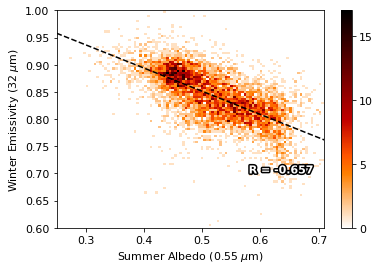

In [244]:
#
fig = plt.figure(1)
ax = fig.add_subplot(111)
plt.rcParams.update({'font.size': 11})
im3 = ax.hist2d(SAvg_DataB,SAvg_DataA, range = [[0.25, 0.71], [0.6, 1.0]], bins = [100,100], cmap = 'gist_heat_r')
ax.text(0.58,0.7,'R = {:.3f}'.format(correlation2), rotation = 0, color = 'w', fontweight = 1000, path_effects=[path_effects.Stroke(linewidth=3, foreground='black'),
                                                                                                     path_effects.Normal()])
ax.plot(a,SL[1]+SL[0]*a, '--',c = 'k', zorder =9999)
ax.set_xlabel('Summer Albedo (0.55 $\mu$m)')
ax.set_ylabel('Winter Emissivity (32 $\mu$m)')
fig.colorbar(im3[3], ticks = [0,5,10,15,20])
#plt.scatter(0.75,0.84, c = 'r', label = 'Corrected Surface ($q_d$ = 4.1e-06)', zorder =10000, marker = 'D' )
#plt.scatter(0.51,0.84, c = 'c', label = 'Mean TOA ($q_d$ = 1.0e-05)', zorder =10000, marker = 's')
#lgd = ax.legend(loc=9, bbox_to_anchor=(0.5, -0.2), ncol = 4)
plt.savefig('Southmixrat.png',bbox_extra_artists=(lgd,), bbox_inches='tight',dpi=300);
plt.show()

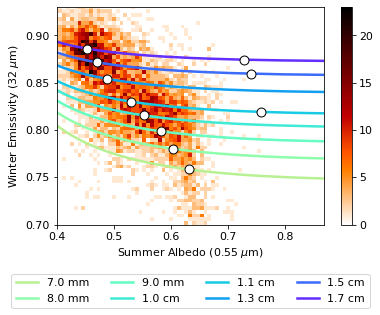

In [245]:
#
fig = plt.figure(1)
ax = fig.add_subplot(111)
plt.rcParams.update({'font.size': 11})
im4 = ax.hist2d(SAvg_DataB,SAvg_DataA, range = [[0.25, 0.92], [0.6, 1.0]], bins = [100,100], cmap = 'gist_heat_r')
ax.set_xlabel('Summer Albedo (0.55 $\mu$m)')
ax.set_ylabel('Winter Emissivity (32 $\mu$m)')
fig.colorbar(im4[3], ticks = [0,5,10,15,20])
ax.plot(alb7000um,emi7000um,label = '7.0 mm', c = plt.cm.rainbow_r(50*2), linewidth=2.5)
ax.plot(alb8000um,emi8000um,label = '8.0 mm', c = plt.cm.rainbow_r(60*2), linewidth=2.5)
ax.plot(alb9000um,emi9000um,label = '9.0 mm', c = plt.cm.rainbow_r(70*2), linewidth=2.5)
ax.plot(alb10000um,emi10000um,label = '1.0 cm', c = plt.cm.rainbow_r(80*2), linewidth=2.5)
ax.plot(alb11000um,emi11000um,label = '1.1 cm', c = plt.cm.rainbow_r(90*2), linewidth =2.5)
ax.plot(alb13000um,emi13000um,label = '1.3 cm', c = plt.cm.rainbow_r(100*2), linewidth=2.5)
ax.plot(alb15000um,emi15000um,label = '1.5 cm', c = plt.cm.rainbow_r(110*2), linewidth=2.5)
ax.plot(alb17000um,emi17000um,label = '1.7 cm', c = plt.cm.rainbow_r(120*2), linewidth=2.5)
ax.scatter(alb7000um[784],emi7000um[784], c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
ax.scatter(alb8000um[797],emi8000um[797], c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
ax.scatter(alb9000um[808],emi9000um[808], c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
ax.scatter(alb10000um[820],emi10000um[820], c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
#ax.scatter(alb7000um[825],emi7000um[825], c = 'w', s = 80.0, zorder=10000, edgecolor = 'k')
#ax.scatter(alb8000um[830],emi8000um[830], c = 'w', s = 80.0, zorder=10000, edgecolor = 'k')
#ax.scatter(alb9000um[835],emi9000um[835], c = 'w', s = 80.0, zorder=10000, edgecolor = 'k')
#ax.scatter(alb10000um[840],emi10000um[840], c = 'w', s = 80.0, zorder=10000, edgecolor = 'k')
ax.scatter(alb11000um[830],emi11000um[830], c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
ax.scatter(alb11000um[777],emi11000um[777], c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
ax.scatter(alb13000um[848],emi13000um[848], c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
ax.scatter(alb15000um[860],emi15000um[860], c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
ax.scatter(alb15000um[799],emi15000um[799], c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
ax.scatter(alb17000um[871],emi17000um[871], c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
ax.scatter(alb17000um[809],emi17000um[809], c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')

#plt.scatter(0.75,0.84, c = 'r', label = 'Corrected Surface ($q_d$ = 4.1e-06)', zorder =10000, s = 100, marker=  'D')
#plt.scatter(0.51,0.84, c = 'c', label = 'Mean TOA ($q_d$ = 3.5e-05)', s = 100, marker = 's')
lgd = ax.legend(loc=9, bbox_to_anchor=(0.5, -0.2), ncol = 4)
plt.xlim(.4,.87)
plt.ylim(.7,.93)
plt.savefig('Southmixratzoom.png',bbox_extra_artists=(lgd,), bbox_inches='tight',dpi=300);
plt.show()

In [246]:
ratio = np.logspace(-6,10,1001)

ratio15000um = ratio*((4/3*(1e-6)**3) *3000)/(4/3*(15000e-6)**3 *1500)
ratio20000um = ratio*((4/3*(1e-6)**3) *3000)/(4/3*(20000e-6)**3 *1500)
ratio30000um = ratio*((4/3*(1e-6)**3) *3000)/(4/3*(30000e-6)**3 *1500)
ratio40000um = ratio*((4/3*(1e-6)**3) *3000)/(4/3*(40000e-6)**3 *1500)
ratio50000um = ratio*((4/3*(1e-6)**3) *3000)/(4/3*(50000e-6)**3 *1500)

In [247]:
cm2 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Matlab_Fx/2cm.csv', names = ['Albedo', 'Emissivity'])
cm3 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Matlab_Fx/3cm.csv', names = ['Albedo', 'Emissivity'])
cm4 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Matlab_Fx/4cm.csv', names = ['Albedo', 'Emissivity'])
cm5 = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Matlab_Fx/5cm.csv', names = ['Albedo', 'Emissivity'])
cm2d = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Matlab_Fx/2cmd.csv', names = ['Albedo', 'Emissivity'])
cm3d = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Matlab_Fx/3cmd.csv', names = ['Albedo', 'Emissivity'])
cm4d = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Matlab_Fx/4cmd.csv', names = ['Albedo', 'Emissivity'])
cm5d = pd.read_csv('/Users/eytangarybicas/Desktop/WORK/Matlab_Fx/5cmd.csv', names = ['Albedo', 'Emissivity'])

In [248]:
h2o

,Ratio,Albedo,Emissivity
0,3.000000e-06,0.99816,0.99825
1,3.112600e-06,0.99814,0.99825
2,3.229400e-06,0.99812,0.99825
3,3.350600e-06,0.99809,0.99825
4,3.476300e-06,0.99807,0.99825
...,...,...,...
996,2.588900e+10,0.23790,0.99646
997,2.686100e+10,0.23790,0.99646
998,2.786900e+10,0.23790,0.99646
999,2.891500e+10,0.23790,0.99646


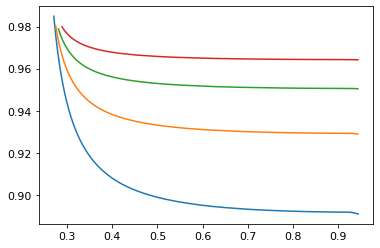

In [249]:
plt.plot(cm2d['Albedo'],cm2d['Emissivity'], label = '2.0 cm w/ 200 $\mu$m H$_2$O veneer')
plt.plot(cm3d['Albedo'],cm3d['Emissivity'], label = '3.0 cm w/ 200 $\mu$m H$_2$O veneer')
plt.plot(cm4d['Albedo'],cm4d['Emissivity'], label = '4.0 cm w/ 200 $\mu$m H$_2$O veneer')
plt.plot(cm5d['Albedo'],cm5d['Emissivity'], label = '5.0 cm w/ 200 $\mu$m H$_2$O veneer')

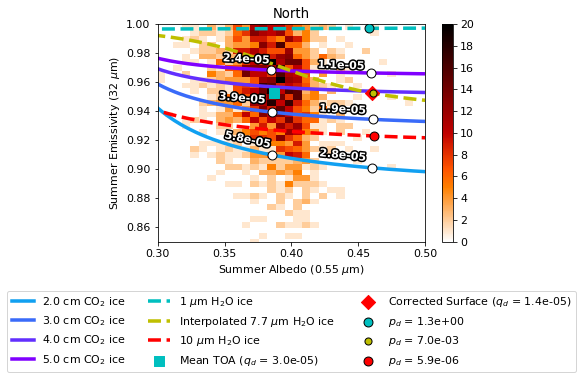

In [451]:
fig = plt.figure(1)
ax = fig.add_subplot(111)
im5 = ax.hist2d(NSAvg_DataB,NSAvg_DataA, range = [[0.28, 0.92], [0.6, 1.0]], bins = [100,100], cmap = 'gist_heat_r')
ax.set_xlabel('Summer Albedo (0.55 $\mu$m)')
ax.set_ylabel('Summer Emissivity (32 $\mu$m)')
fig.colorbar(im5[3], ticks = [0,2,4,6,8,10,12,14,16,18,20])
plt.rcParams.update({'font.size': 11})
ax.scatter(np.nanmean(NSAvg_DataB),np.nanmean(NSAvg_DataA), c = 'c', label = 'Mean TOA ($q_d$ = 3.0e-05)' , zorder =10000,  marker = 's', s = 100)
ax.scatter(0.46, np.nanmean(NSAvg_DataA),c = 'r', label = 'Corrected Surface ($q_d$ = 1.4e-05)', zorder =10000, marker=  'D', s = 100)
ax.plot(alb20000um,emi20000um,label = '2.0 cm CO$_2$ ice', c = plt.cm.rainbow_r(100*2), linewidth=3.5)
ax.plot(alb30000um,emi30000um,label = '3.0 cm CO$_2$ ice', c = plt.cm.rainbow_r(110*2), linewidth=3.5)
ax.plot(alb40000um,emi40000um,label = '4.0 cm CO$_2$ ice', c = plt.cm.rainbow_r(120*2), linewidth=3.5)
ax.plot(alb50000um,emi50000um,label = '5.0 cm CO$_2$ ice', c = plt.cm.rainbow_r(130*2), linewidth=3.5)
ax.scatter(alb20000um[898],emi20000um[898],c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
ax.scatter(alb30000um[920],emi30000um[920],c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
#ax.plot(cm2['Albedo'],cm2['Emissivity'], label = '2.0 cm w/ 200 $\mu$m H$_2$O veneer',linestyle='--', c = plt.cm.rainbow_r(0*2))
#ax.plot(cm3['Albedo'],cm3['Emissivity'], label = '3.0 cm w/ 200 $\mu$m H$_2$O veneer',linestyle='--', c = plt.cm.rainbow_r(10*2))
#ax.plot(cm4['Albedo'],cm4['Emissivity'], label = '4.0 cm w/ 200 $\mu$m H$_2$O veneer',linestyle='--', c = plt.cm.rainbow_r(0*2), linewidth = 2.5)
#ax.plot(cm5['Albedo'],cm5['Emissivity'], label = '5.0 cm w/ 200 $\mu$m H$_2$O veneer',linestyle='--', c = plt.cm.rainbow_r(30*2))
#ax.plot(cm2d['Albedo'],cm2d['Emissivity'], label = '2.0 cm w/ 200 $\mu$m H$_2$O w/dust veneer', linestyle = ':', c = plt.cm.rainbow_r(40*2), linewidth = 2.5)
#ax.plot(cm3d['Albedo'],cm3d['Emissivity'], label = '3.0 cm w/ 200 $\mu$m H$_2$O w/dust veneer', linestyle = ':', c = plt.cm.rainbow_r(50*2), linewidth = 2.5)
#ax.plot(cm4d['Albedo'],cm4d['Emissivity'], label = '4.0 cm w/ 200 $\mu$m H$_2$O veneer w/dust', linestyle = ':', c = plt.cm.rainbow_r(60*2), linewidth = 3.5)
#ax.plot(cm5d['Albedo'],cm5d['Emissivity'], label = '5.0 cm w/ 200 $\mu$m H$_2$O w/dust veneer', linestyle = ':', c = plt.cm.rainbow_r(70*2), linewidth = 2.5)
#plt.scatter(alb40000um[936],emi40000um[936],c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
ax.scatter(alb50000um[948],emi50000um[948],c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
ax.scatter(alb20000um[878],emi20000um[878],c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
ax.scatter(alb30000um[900],emi30000um[900],c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
#plt.scatter(alb40000um[916],emi40000um[916],c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
ax.scatter(alb50000um[928],emi50000um[928],c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
ax.text(alb20000um[898]-.036,emi20000um[898]+.005,'{:.1e}'.format(ratio20000um[898]),rotation = -12,fontsize= 'medium', color = 'w', fontweight = 1000,path_effects=[path_effects.Stroke(linewidth=3, foreground='black'),
                       path_effects.Normal()])
ax.text(alb30000um[920]-.040,emi30000um[920]+.0060,'{:.1e}'.format(ratio30000um[920]),rotation = -5,fontsize= 'medium', zorder =10000, color = 'w', fontweight = 1000,path_effects=[path_effects.Stroke(linewidth=3, foreground='black'),
                        path_effects.Normal()])
ax.text(alb50000um[948]-.036,emi50000um[948]+.0045,'{:.1e}'.format(ratio50000um[948]),rotation = -3,fontsize= 'medium', color = 'w', fontweight = 1000,path_effects=[path_effects.Stroke(linewidth=3, foreground='black'),
                       path_effects.Normal()])
ax.text(alb20000um[878]-.040,emi20000um[878]+.0048,'{:.1e}'.format(ratio20000um[878]),rotation = -6,fontsize= 'medium', zorder=10000, color = 'w', fontweight = 1000,path_effects=[path_effects.Stroke(linewidth=3, foreground='black'),
                        path_effects.Normal()])
ax.text(alb30000um[900]-.040,emi30000um[900]+.0038,'{:.1e}'.format(ratio30000um[900]),rotation = -3,fontsize= 'medium', zorder=10000, color = 'w', fontweight = 1000,path_effects=[path_effects.Stroke(linewidth=3, foreground='black'),
                        path_effects.Normal()])
ax.text(alb50000um[928]-.040,emi50000um[928]+.0025,'{:.1e}'.format(ratio50000um[928]),rotation = -2,fontsize= 'medium', color = 'w', fontweight = 1000,path_effects=[path_effects.Stroke(linewidth=3, foreground='black'),
                       path_effects.Normal()])
ax.plot(albnew(0),eminew(0),label = '1 $\mu$m H$_2$O ice',c = 'c', linewidth=3.5, linestyle = '--')
ax.plot(albnew(74),eminew(74) ,label = 'Interpolated 7.7 $\mu$m H$_2$O ice',c = 'y', linewidth=3.5, linestyle = '--')
ax.plot(albnew(100),eminew(100), label = '10 $\mu$m H$_2$O ice',c = 'r', linewidth=3.5, linestyle = '--')
ax.scatter(albnew(0)[352],eminew(0)[352],label='$p_d$ = {:.1e}'.format(rationew(0)[352]),c ='c',s = 80.0, zorder=10000, edgecolor = 'k')
ax.scatter(albnew(74)[247],eminew(74)[247],label='$p_d$ = {:.1e}'.format(rationew(74)[247]),c ='y',s = 50.0, zorder=10000, edgecolor = 'k')
ax.scatter(albnew(100)[206],eminew(100)[206],label='$p_d$ = {:.1e}'.format(rationew(100)[206]),c ='r',s = 80.0, zorder=10000, edgecolor = 'k')
plt.xlim(.3,.48)
plt.ylim(.85,1.0)
plt.xticks([.3,.35,.4,.45,.5])
plt.title('North')
lgd = ax.legend(loc=9, bbox_to_anchor=(0.5, -0.2), ncol = 3)
plt.savefig('Northsummerzoom.png',bbox_extra_artists=(lgd,), bbox_inches='tight',dpi=300)
plt.show()

In [251]:
np.nanmean(NSAvg_DataA)

0.9523576360154327

In [252]:
np.nanmean(SSAvg_DataA)

0.8980952687847606

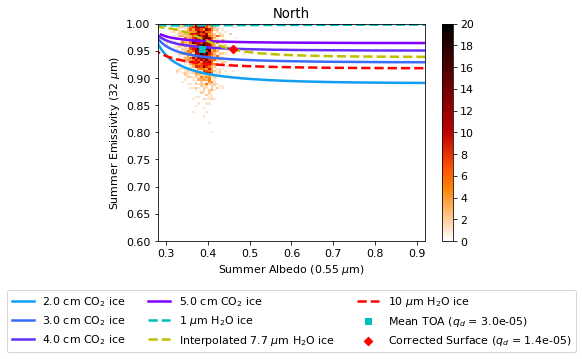

In [455]:
#
fig = plt.figure(1)
ax = fig.add_subplot(111)
im6 = ax.hist2d(NSAvg_DataB,NSAvg_DataA, range = [[0.28, 0.92], [0.6, 1.0]], bins = [100,100], cmap = 'gist_heat_r')
ax.set_xlabel('Summer Albedo (0.55 $\mu$m)')
ax.set_ylabel('Summer Emissivity (32 $\mu$m)')
fig.colorbar(im6[3], ticks = [0,2,4,6,8,10,12,14,16,18,20])
plt.rcParams.update({'font.size': 11})
plt.scatter(np.nanmean(NSAvg_DataB),np.nanmean(NSAvg_DataA), c = 'c', label = 'Mean TOA ($q_d$ = 3.0e-05)' , zorder =10000,  marker = 's')
plt.scatter(0.46, np.nanmean(NSAvg_DataA),c = 'r', label = 'Corrected Surface ($q_d$ = 1.4e-05)', zorder =10000, marker=  'D')
plt.plot(alb20000um,emi20000um,label = '2.0 cm CO$_2$ ice', c = plt.cm.rainbow_r(100*2), linewidth = 2.5)
plt.plot(alb30000um,emi30000um,label = '3.0 cm CO$_2$ ice', c = plt.cm.rainbow_r(110*2), linewidth = 2.5)
plt.plot(alb40000um,emi40000um,label = '4.0 cm CO$_2$ ice', c = plt.cm.rainbow_r(120*2), linewidth = 2.5)
plt.plot(alb50000um,emi50000um,label = '5.0 cm CO$_2$ ice', c = plt.cm.rainbow_r(130*2), linewidth = 2.5)
#plt.plot(cm2['Albedo'],cm2['Emissivity'], label = '2.0 cm w/ 200 $\mu$m H$_2$O veneer', linestyle = '--', c = plt.cm.rainbow_r(0*2))
#plt.plot(cm3['Albedo'],cm3['Emissivity'], label = '3.0 cm w/ 200 $\mu$m H$_2$O veneer', linestyle = '--', c = plt.cm.rainbow_r(10*2))
#plt.plot(cm4['Albedo'],cm4['Emissivity'], label = '4.0 cm w/ 200 $\mu$m H$_2$O veneer', linestyle = '--', c = plt.cm.rainbow_r(0*2))
#plt.plot(cm5['Albedo'],cm5['Emissivity'], label = '5.0 cm w/ 200 $\mu$m H$_2$O veneer', linestyle = '--', c = plt.cm.rainbow_r(30*2))
#plt.plot(cm2d['Albedo'],cm2d['Emissivity'], label = '2.0 cm w/ 200 $\mu$m H$_2$O w/dust veneer', linestyle = ':', c = plt.cm.rainbow_r(40*2), linewidth = 2.5)
#plt.plot(cm3d['Albedo'],cm3d['Emissivity'], label = '3.0 cm w/ 200 $\mu$m H$_2$O w/dust veneer', linestyle = ':', c = plt.cm.rainbow_r(50*2), linewidth = 2.5)
#plt.plot(cm4d['Albedo'],cm4d['Emissivity'], label = '4.0 cm w/ 200 $\mu$m H$_2$O veneer w/dust ', linestyle = ':', c = plt.cm.rainbow_r(60*2), linewidth = 2.5)
#plt.plot(cm5d['Albedo'],cm5d['Emissivity'], label = '5.0 cm w/ 200 $\mu$m H$_2$O w/dust veneer', linestyle = ':', c = plt.cm.rainbow_r(70*2), linewidth = 2.5)
#plt.legend()
ax.plot(albnew(0),eminew(0),label = '1 $\mu$m H$_2$O ice',c = 'c', linewidth=2.5, linestyle = '--')
ax.plot(albnew(74),eminew(74) ,label = 'Interpolated 7.7 $\mu$m H$_2$O ice',c = 'y', linewidth=2.5, linestyle = '--')
ax.plot(albnew(100),eminew(100), label = '10 $\mu$m H$_2$O ice',c = 'r', linewidth=2.5, linestyle = '--')
lgd = ax.legend(loc=9, bbox_to_anchor=(0.5, -0.2), ncol = 3)
plt.title('North')
plt.savefig('Northsummer.png',bbox_extra_artists=(lgd,), bbox_inches='tight',dpi=300)
plt.show()

In [255]:
np.nanmean(N1)

0.3873851383245858

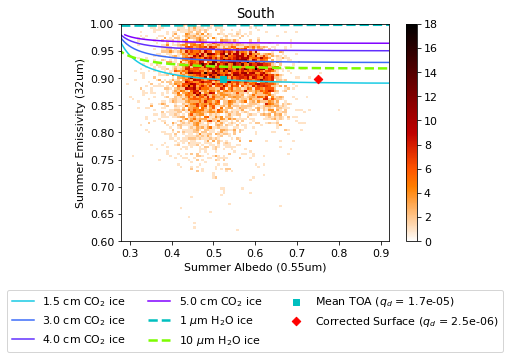

In [454]:
#
fig = plt.figure(1)
ax = fig.add_subplot(111)
im7 = ax.hist2d(SSAvg_DataB,SSAvg_DataA, range = [[0.28, 0.92], [0.6, 1.0]], bins = [100,100], cmap = 'gist_heat_r')
plt.rcParams.update({'font.size': 11})
plt.xlabel('Summer Albedo (0.55um)')
plt.ylabel('Summer Emissivity (32um)')
fig.colorbar(im7[3])
plt.scatter(np.nanmean(SSAvg_DataB),np.nanmean(SSAvg_DataA), c = 'c', label = 'Mean TOA ($q_d$ = 1.7e-05)' , zorder =10000,  marker = 's')
plt.scatter(0.75, np.nanmean(SSAvg_DataA),c = 'r', label = 'Corrected Surface ($q_d$ = 2.5e-06)', zorder =10000, marker=  'D')
plt.plot(alb20000um,emi20000um,label = '1.5 cm CO$_2$ ice', c = plt.cm.rainbow_r(90*2))
plt.plot(alb30000um,emi30000um,label = '3.0 cm CO$_2$ ice', c = plt.cm.rainbow_r(110*2))
plt.plot(alb40000um,emi40000um,label = '4.0 cm CO$_2$ ice', c = plt.cm.rainbow_r(120*2))
plt.plot(alb50000um,emi50000um,label = '5.0 cm CO$_2$ ice', c = plt.cm.rainbow_r(130*2))
ax.plot(albnew(0),eminew(0),label = '1 $\mu$m H$_2$O ice',c = 'c', linewidth=2.5, linestyle = '--')
#ax.plot(albnew(1),eminew(1) ,label = 'Interpolated H$_2$O ice',c = 'y', linewidth=2.5, linestyle = '--')
ax.plot(albnew(100),eminew(100), label = '10 $\mu$m H$_2$O ice',c = 'lawngreen', linewidth=2.5, linestyle = '--')
plt.title('South')
lgd = ax.legend(loc=9, bbox_to_anchor=(0.5, -0.2), ncol = 3)
plt.savefig('Southsummer.png',bbox_extra_artists=(lgd,), bbox_inches='tight',dpi=300)

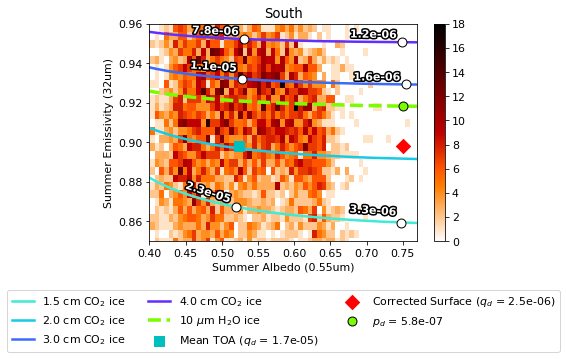

In [465]:
#
fig = plt.figure(1)
ax = fig.add_subplot(111)
im8 = ax.hist2d(SSAvg_DataB,SSAvg_DataA, range = [[0.28, 0.92], [0.6, 1.0]], bins = [100,100], cmap = 'gist_heat_r')
plt.rcParams.update({'font.size': 11})
plt.xlabel('Summer Albedo (0.55um)')
plt.ylabel('Summer Emissivity (32um)')
fig.colorbar(im8[3])
plt.scatter(np.nanmean(SSAvg_DataB),np.nanmean(SSAvg_DataA), c = 'c', label = 'Mean TOA ($q_d$ = 1.7e-05)' , zorder =10000,  marker = 's', s =100)
plt.scatter(0.75, np.nanmean(SSAvg_DataA),c = 'r', label = 'Corrected Surface ($q_d$ = 2.5e-06)', zorder =10000, marker=  'D',s =100)
plt.plot(alb15000um,emi15000um,label = '1.5 cm CO$_2$ ice', c = plt.cm.rainbow_r(80*2), linewidth=2.5)
plt.plot(alb20000um,emi20000um,label = '2.0 cm CO$_2$ ice', c = plt.cm.rainbow_r(90*2), linewidth=2.5)
plt.plot(alb30000um,emi30000um,label = '3.0 cm CO$_2$ ice', c = plt.cm.rainbow_r(110*2), linewidth=2.5)
plt.plot(alb40000um,emi40000um,label = '4.0 cm CO$_2$ ice', c = plt.cm.rainbow_r(120*2), linewidth=2.5)
plt.scatter(alb15000um[849],emi15000um[849],c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
#plt.scatter(alb20000um[864],emi20000um[864],c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
plt.scatter(alb30000um[885],emi30000um[885],c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
plt.scatter(alb40000um[900],emi40000um[900],c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
plt.scatter(alb15000um[797],emi15000um[797],c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
#plt.scatter(alb20000um[812],emi20000um[812],c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
plt.scatter(alb30000um[833],emi30000um[833],c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
plt.scatter(alb40000um[850],emi40000um[850],c = 'w',s = 80.0, zorder=10000, edgecolor = 'k')
plt.text(alb15000um[849]-.072,emi15000um[849]+.0021,'{:.1e}'.format(ratio15000um[849]),rotation = -18,fontsize= 'medium', color = 'w', fontweight = 1000,path_effects=[path_effects.Stroke(linewidth=3, foreground='black'),
                       path_effects.Normal()])
#plt.text(alb20000um[864],emi20000um[864],'{:.1e}'.format(ratio20000um[864]),rotation = -0,fontsize= 'medium', color = 'w', fontweight = 1000,path_effects=[path_effects.Stroke(linewidth=3, foreground='black'),
#                       path_effects.Normal()])
plt.text(alb30000um[885]-.072,emi30000um[885]+.0037,'{:.1e}'.format(ratio30000um[885]),rotation = -4,fontsize= 'medium', color = 'w', fontweight = 1000,path_effects=[path_effects.Stroke(linewidth=3, foreground='black'),
                       path_effects.Normal()])
plt.text(alb40000um[900]-.072,emi40000um[900]+.002,'{:.1e}'.format(ratio40000um[900]),rotation = -2,fontsize= 'medium', color = 'w', fontweight = 1000,path_effects=[path_effects.Stroke(linewidth=3, foreground='black'),
                       path_effects.Normal()])
plt.text(alb15000um[797]-.072,emi15000um[797]+.0035,'{:.1e}'.format(ratio15000um[797]),rotation = -4,fontsize= 'medium', color = 'w', fontweight = 1000,path_effects=[path_effects.Stroke(linewidth=3, foreground='black'),
                       path_effects.Normal()])
#plt.text(alb20000um[812],emi20000um[812],'{:.1e}'.format(ratio20000um[812]),rotation = -0,fontsize= 'medium', color = 'w', fontweight = 1000,path_effects=[path_effects.Stroke(linewidth=3, foreground='black'),
#                       path_effects.Normal()])
plt.text(alb30000um[833]-.072,emi30000um[833]+.002,'{:.1e}'.format(ratio30000um[833]),rotation = -0,fontsize= 'medium', color = 'w', fontweight = 1000,path_effects=[path_effects.Stroke(linewidth=3, foreground='black'),
                       path_effects.Normal()])
plt.text(alb40000um[850]-.072,emi40000um[850]+.002,'{:.1e}'.format(ratio40000um[850]),rotation = -1,fontsize= 'medium', color = 'w', fontweight = 1000,path_effects=[path_effects.Stroke(linewidth=3, foreground='black'),
                       path_effects.Normal()])

#ax.plot(albnew(1),eminew(1) ,label = 'Interpolated H$_2$O ice',c = 'y', linewidth=3.5, linestyle = '--')
ax.plot(albnew(100),eminew(100), label = '10 $\mu$m H$_2$O ice',c = 'lawngreen', linewidth=3.5, linestyle = '--')
#ax.scatter(albnew(1)[189],eminew(1)[189],label='$q_d$ = {:.1e}'.format(rationew(1)[189]),c ='y',s = 80.0, zorder=10000, edgecolor = 'k')
ax.scatter(albnew(100)[143],eminew(100)[143],label='$p_d$ = {:.1e}'.format(rationew(100)[143]),c ='lawngreen',s = 80.0, zorder=10000, edgecolor = 'k')
plt.xlim(0.4,0.77)
plt.ylim(0.85,0.96)
plt.title('South')
lgd = ax.legend(loc=9, bbox_to_anchor=(0.5, -0.2), ncol = 3)
plt.savefig('Southsummerzoom.png',bbox_extra_artists=(lgd,), bbox_inches='tight',dpi=300)

In [258]:
ratio20000um[812]

2.4543698575499658e-06

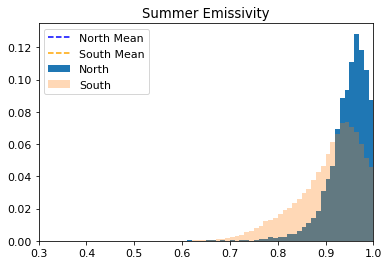

In [259]:
#
plt.rcParams.update({'font.size': 11})
valn = plt.hist(EmiSumN*100, bins = np.linspace(0,100,101), density = 1, label = 'North')
vals = plt.hist(EmiSumS*100, bins = np.linspace(0,100,101), density = 1, label = 'South', alpha = .3)
plt.axvline(np.median(EmiSumN), linestyle = '--', c = 'blue', label='North Mean')
plt.axvline(np.median(EmiSumS), linestyle = '--', c = 'orange', label='South Mean')
plt.title('Summer Emissivity')
plt.legend()
plt.xlim(50,100)
plt.xticks(np.linspace(30,100,8), [0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0]);
#plt.savefig('SumEmiNvsS.png',dpi=300);

In [260]:
(np.mean(EmiWinS)/np.mean(EmiWinN)*100)-100

3.676872229433357

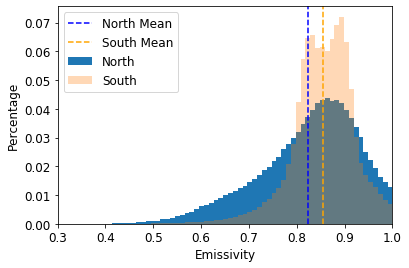

In [261]:
#
plt.rcParams.update({'font.size': 12})
plt.hist(EmiWinN*100, bins = np.linspace(0,100,100), density = 1, label = 'North')
plt.hist(EmiWinS*100, bins = np.linspace(0,100,100), density = 1, label = 'South', alpha = .3)
plt.axvline(np.mean(EmiWinN*100), linestyle = '--', c = 'blue', label='North Mean')
plt.axvline(np.mean(EmiWinS*100), linestyle = '--', c = 'orange', label='South Mean')
plt.legend()
plt.xlim(30,100)
plt.xticks(np.linspace(30,100,8), [0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.xlabel('Emissivity')
plt.ylabel('Percentage')
plt.savefig('WinEmiNvsS.png',dpi=300);

In [262]:
np.mean(EmiWinN)

0.8241546271480894

In [263]:
np.mean(EmiWinS)

0.8544577397612875

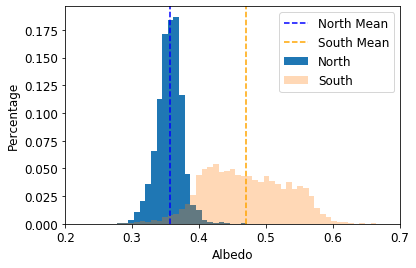

In [264]:
#
plt.rcParams.update({'font.size': 12})
plt.hist(NAvg_DataB*100, bins = np.linspace(0,100,100), density = 1, label = 'North')
plt.hist(SAvg_DataB*100, bins = np.linspace(0,100,100), density = 1, label = 'South', alpha = .3)
plt.xlabel('Albedo')
plt.axvline(np.mean(NAvg_DataB*100), linestyle = '--', c = 'blue', label='North Mean')
plt.axvline(np.mean(SAvg_DataB*100), linestyle = '--', c = 'orange', label='South Mean')
plt.xticks(np.linspace(20,80,6), [0.2,0.3,0.4,0.5,0.6,0.7,0.8])
plt.legend()
plt.xlim(20,80)
plt.ylabel('Percentage')
plt.savefig('SumAlbNvsS.png',dpi=300);

In [265]:
NWITCO2 = NWICO2[(NWICO2['Surf_lat'] >= 80.0)]
NWIBCO2 = NWICO2[(NWICO2['Surf_lat'] < 80.0)]

In [266]:
SWITCO2 = SWICO2[(SWICO2['Surf_lat'] <= -80.0)]
SWIBCO2 = SWICO2[(SWICO2['Surf_lat'] > -80.0)]

In [267]:
NWITECoor = poltocar(NWITCO2, 'N', 'Y', NWITCO2['Surf_lat'], NWITCO2['Surf_lon'])
NWIBECoor = poltocar(NWIBCO2, 'N', 'Y', NWIBCO2['Surf_lat'], NWIBCO2['Surf_lon'])
SWITECoor = poltocar(SWITCO2, 'S', 'Y', SWITCO2['Surf_lat'], SWITCO2['Surf_lon'])
SWIBECoor = poltocar(SWIBCO2, 'S', 'Y', SWIBCO2['Surf_lat'], SWIBCO2['Surf_lon'])

In [268]:
x_range = np.arange(-1,1,.01)
y_range = np.arange(-1,1,.01)

xbins, ybins = len(x_range), len(y_range)
NWITIR, xedges, yedges, binnumber = stats.binned_statistic_2d(NWITECoor[0], NWITECoor[1], values= (NWITCO2['T_surf']), statistic ='mean', bins = [xbins, ybins])
NWIBIR, xedges, yedges, binnumber = stats.binned_statistic_2d(NWIBECoor[0], NWIBECoor[1], values= (NWIBCO2['T_surf']), statistic ='mean', bins = [xbins, ybins])
SWITIR, xedges, yedges, binnumber = stats.binned_statistic_2d(SWITECoor[0], SWITECoor[1], values= (SWITCO2['T_surf']), statistic ='mean', bins = [xbins, ybins])
SWIBIR, xedges, yedges, binnumber = stats.binned_statistic_2d(SWIBECoor[0], SWIBECoor[1], values= (SWIBCO2['T_surf']), statistic ='mean', bins = [xbins, ybins])
NWITFPT, xedges, yedges, binnumber = stats.binned_statistic_2d(NWITECoor[0], NWITECoor[1], values= (NWITCO2['Frost_T']), statistic ='mean', bins = [xbins, ybins])
NWIBFPT, xedges, yedges, binnumber = stats.binned_statistic_2d(NWIBECoor[0], NWIBECoor[1], values= (NWIBCO2['Frost_T']), statistic ='mean', bins = [xbins, ybins])
SWITFPT, xedges, yedges, binnumber = stats.binned_statistic_2d(SWITECoor[0], SWITECoor[1], values= (SWITCO2['Frost_T']), statistic ='mean', bins = [xbins, ybins])
SWIBFPT, xedges, yedges, binnumber = stats.binned_statistic_2d(SWIBECoor[0], SWIBECoor[1], values= (SWIBCO2['Frost_T']), statistic ='mean', bins = [xbins, ybins])

In [269]:
NWITEmi = emi(NWITIR, NWITFPT)
NWIBEmi = emi(NWIBIR, NWIBFPT)
SWITEmi = emi(SWITIR, SWITFPT)
SWIBEmi = emi(SWIBIR, SWIBFPT)

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  """Entry point for launching an IPython kernel.


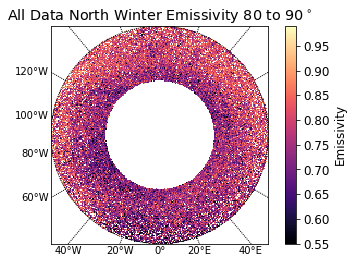

In [270]:
m = Basemap(projection='nplaea',boundinglat=80.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(NWITEmi, cmap = 'magma', origin = 'upper')
plt.title('All Data North Winter Emissivity 80 to 90$^\circ$')
cbar = plt.colorbar()
cbar.set_label('Emissivity')
plt.clim(0.55,.99)
plt.show()

In [271]:
np.nanmean(NWITEmi)

0.7634228982676786

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  """Entry point for launching an IPython kernel.


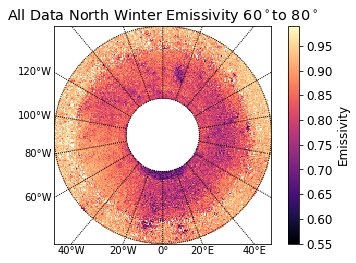

In [272]:
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(NWIBEmi, cmap = 'magma', origin = 'upper')
plt.title('All Data North Winter Emissivity 60$^\circ$to 80$^\circ$')
cbar = plt.colorbar()
cbar.set_label('Emissivity')
plt.clim(.55,.99)
plt.show()

In [273]:
np.nanmean(NWIBEmi)

0.860118738715233

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  """Entry point for launching an IPython kernel.


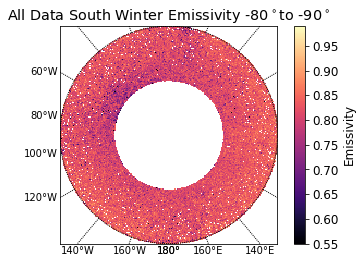

In [274]:
m = Basemap(projection='splaea',boundinglat=-80.0,lon_0=180,resolution='l')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(SWITEmi, cmap ='magma')
plt.title('All Data South Winter Emissivity -80$^\circ$to -90$^\circ$')
cbar = plt.colorbar()
cbar.set_label('Emissivity')
plt.clim(0.55,.99)
plt.show()

In [275]:
np.nanmean(SWITEmi)

0.8189195951397055

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  """Entry point for launching an IPython kernel.


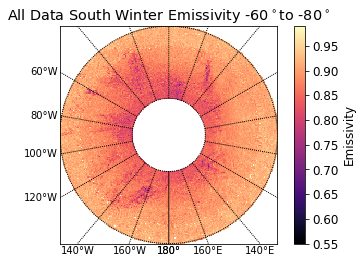

In [276]:
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(SWIBEmi, cmap ='magma')
plt.title('All Data South Winter Emissivity -60$^\circ$to -80$^\circ$')
cbar = plt.colorbar()
cbar.set_label('Emissivity')
plt.clim(0.55,.99)
plt.show()

In [277]:
np.nanmean(SWIBEmi)

0.8862806501878319

In [278]:
NAlbT = NAlb[(NAlb['Latitude'] >= 80.0)]
NAlbB = NAlb[(NAlb['Latitude'] < 80.0)]

In [279]:
SAlbT = SAlb[(SAlb['Latitude'] <= -80.0)]
SAlbB = SAlb[(SAlb['Latitude'] > -80.0)]

In [280]:
NWITCoor = poltocar(NAlbT, 'N', 'Y', NAlbT['Latitude'], NAlbT['Longitude'])
NWIBCoor = poltocar(NAlbB, 'N', 'Y', NAlbB['Latitude'], NAlbB['Longitude'])
SWITCoor = poltocar(SAlbT, 'S', 'Y', SAlbT['Latitude'], SAlbT['Longitude'])
SWIBCoor = poltocar(SAlbB, 'S', 'Y', SAlbB['Latitude'], SAlbB['Longitude'])

In [281]:
x_range = np.arange(-1,1,.01)
y_range = np.arange(-1,1,.01)

xbins, ybins = len(x_range), len(y_range)
NALBT, xedges, yedges, binnumber = stats.binned_statistic_2d(NWITCoor[0], NWITCoor[1], values= (NAlbT['Albedo']), statistic ='mean', bins = [xbins, ybins])
NALBB, xedges, yedges, binnumber = stats.binned_statistic_2d(NWIBCoor[0], NWIBCoor[1], values= (NAlbB['Albedo']), statistic ='mean', bins = [xbins, ybins])
SALBT, xedges, yedges, binnumber = stats.binned_statistic_2d(SWITCoor[0], SWITCoor[1], values= (SAlbT['Albedo']), statistic ='mean', bins = [xbins, ybins])
SALBB, xedges, yedges, binnumber = stats.binned_statistic_2d(SWIBCoor[0], SWIBCoor[1], values= (SAlbB['Albedo']), statistic ='mean', bins = [xbins, ybins])

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  """Entry point for launching an IPython kernel.


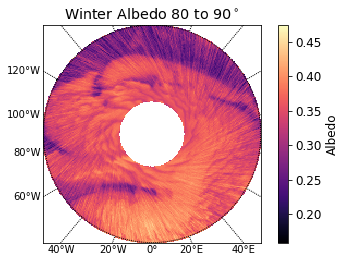

In [282]:
m = Basemap(projection='nplaea',boundinglat=80.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(NALBT, cmap = 'magma', origin = 'upper')
plt.title('Winter Albedo 80 to 90$^\circ$')
cbar = plt.colorbar()
cbar.set_label('Albedo')
plt.show()

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  """Entry point for launching an IPython kernel.


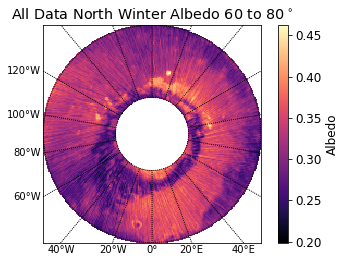

In [283]:
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(NALBB, cmap = 'magma', origin = 'upper')
plt.title('All Data North Winter Albedo 60 to 80$^\circ$')
cbar = plt.colorbar()
cbar.set_label('Albedo')
plt.show()

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  """Entry point for launching an IPython kernel.


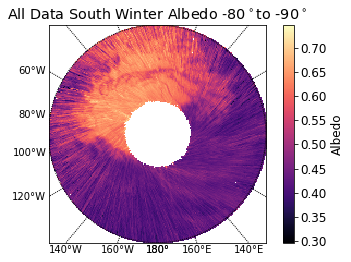

In [284]:
m = Basemap(projection='splaea',boundinglat=-80.0,lon_0=180,resolution='l')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(SALBT, cmap ='magma')
plt.title('All Data South Winter Albedo -80$^\circ$to -90$^\circ$')
cbar = plt.colorbar()
cbar.set_label('Albedo')
plt.show()

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  """Entry point for launching an IPython kernel.


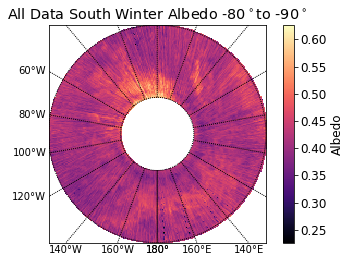

In [285]:
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(SALBB, cmap ='magma')
plt.title('All Data South Winter Albedo -80$^\circ$to -90$^\circ$')
cbar = plt.colorbar()
cbar.set_label('Albedo')
plt.show()

In [286]:
myN = MY30[(MY30['L_s'] >= 0) & (MY30['L_s'] <= 180)]
myS = MY30[(MY30['L_s'] >= 180) & (MY30['L_s'] <= 360)]

In [287]:
myN['dec'] = dec(myN['L_s'])
myS['dec'] = dec(myS['L_s'])
myNS = myN[(myN['Latitude'] >= 60.0) & (myN['Latitude'] <= 85.0)]
mySS = myS[(myS['Latitude'] <= -85.0) & (myS['Latitude'] >= -60.0)]

/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/Users/eytangarybicas/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [288]:
MNS = (ms(myN['Latitude'],np.array(myN['dec']),np.nanmean(Ultimate_Albedo_North_3000),
          np.array(myN['Distance to Sun']),loc='N')/5.9e5)*1361
MSS = (ms(myS['Latitude'],np.array(myS['dec']),np.nanmean(Ultimate_Albedo_South_3000),
          np.array(myS['Distance to Sun']),loc='S')/5.9e5)*1361

In [289]:
MNS

-5426.598927922881

In [290]:
MSS

2968.3205200852485

In [291]:
newCO2N = CO2day[(CO2day['Surf_lat'] >= 60.0) & (CO2day['Surf_lat'] <= 85.0)]
newCO2S = CO2day[(CO2day['Surf_lat'] <= -60.0) & (CO2day['Surf_lat'] >= -85.0)]

In [292]:
NFT = np.mean(newCO2N['Frost_T'])

In [293]:
SFT =np.mean(newCO2S['Frost_T'])

In [294]:
MNW = ((5.67e-8*np.nanmean(NWIEmi)*NFT**4)/5.9e5)*(668.6*88775.244147-371.9*88775.244147)
MSW = ((5.67e-8*np.nanmean(SWIEmi)*SFT**4)/5.9e5)*(371.9*88775.244147)

In [295]:
MNW

1093.8164754368197

In [296]:
MSW

1268.0921181088172

In [297]:
NFT**4/SFT**4

1.1182422008260136